# Visualizing the z-scored MMIPPs as t-SNE plots

## z-score the results

In [19]:
from pandas import DataFrame, read_csv, to_numeric
from scipy.stats import zscore, shapiro
from json import dump
from os import path
from re import sub

def z_scored(df_path):
    # Compute the z-score for each row and return a z-score DataFrame
    print(df_path)
    baseName = path.basename(df_path).replace(".csv", "")
    df = read_csv(df_path).fillna(0)
    if "Sample" in df_path:
        indexName = "Interval" if "prob" not in df_path else "Sample"
        df = df.set_index(indexName).drop("Name", axis="rows").apply(to_numeric, errors='coerce')
        indexName = df.index.name
        df.index = [i.replace("-ABX", "") for i in df.index]
        indexName = df.index.name = indexName
    elif "ASV" in df_path:
        df.set_index("ASV", inplace=True)
        if "prob" in df_path:
            df = df.drop("Name", axis="rows").apply(to_numeric, errors='coerce')

    # run normality score first to assess the validity of a z-score
    normalTests = [shapiro(row.values) for index, row in df.iterrows()]
    normalcy_test_dic = dict(zip(df.index, normalTests)) 
    # display(normalcy_test_dic)
    with open(f"{baseName}_normalcies.json", 'w') as jsonOut:
        dump(normalcy_test_dic, jsonOut, indent=3)
    z_scores = df.apply(zscore, axis="rows")
    return DataFrame(z_scores, columns=df.columns, index=df.index)


# generate the sample z-Score matrices
from glob import glob
for sample_table in glob("nboutput/Sample*probInteractions.csv"):
    zScore_sample = z_scored(sample_table)
    zScore_sample.to_csv(sample_table.replace("probInteractions", "probInteractions_zScore"))

# zScore_samples = z_scored("SampleIntervalMetaboliteInteractions.csv")
# zScore_ASVs = z_scored("ASVMetaboliteInteractions.csv")

nboutput/Sampleuptake_probInteractions.csv
nboutput/Sampleexcretion_probInteractions.csv
nboutput/Samplegrowth_probInteractions.csv


## defining the color code bins based on methane flux

In [4]:
from pandas import read_excel

data = read_excel("data/Cliff_Sample_Metadata_BGC_NMR.xlsx")
display(data)
data.to_csv("data/Cliff_Sample_Metadata_BGC_NMR.csv")

,New_index,Sample_name,Sample,Site,Core,Depth,Restoration,Hydrol,Date,Lat,...,Succinate,Sucrose,Thymidine,Trehalose,Trimethylamine,Tryptophan,Tyrosine,Uracil,Uridine,Valine
0,1,Historic_R2A_A_D1,R2A_A_D1,R2A,A,D1,Reference,Tidal marsh,2014-07-11,37.496219,...,11.4,11.0,0.0,20.6,0.8,0.0,2.2,10.7,4.0,70.6
1,2,Historic_R2A_A_D2,R2A_A_D2,R2A,A,D2,Reference,Tidal marsh,2014-07-11,37.496219,...,2.0,8.8,0.0,12.1,0.2,0.0,0.0,0.0,0.0,6.6
2,3,Historic_R2A_B_D1,R2A_B_D1,R2A,B,D1,Reference,Tidal marsh,2014-07-11,37.496044,...,8.6,287.8,5.3,17.4,1.0,0.0,1.6,3.5,6.2,61.6
3,4,Historic_R2A_B_D2,R2A_B_D2,R2A,B,D2,Reference,Tidal marsh,2014-07-11,37.496044,...,1.0,454.6,0.0,22.0,0.0,0.0,0.0,0.0,0.0,8.1
4,5,Historic_R2A_C_D1,R2A_C_D1,R2A,C,D1,Reference,Tidal marsh,2014-07-11,37.496546,...,11.0,3219.9,0.0,51.7,0.0,0.0,0.0,0.0,0.0,41.1
5,6,Historic_R2A_C_D2,R2A_C_D2,R2A,C,D2,Reference,Tidal marsh,2014-07-11,37.496546,...,2.0,27.7,0.0,24.5,0.1,0.0,0.0,0.0,0.7,4.1
6,7,restored_SF2_A_D1,SF2_A_D1,SF2,A,D1,Restored,Managed pond,2014-07-17,37.497143,...,46.1,77.4,36.6,16.1,0.8,7.8,44.6,13.0,13.3,86.9
7,8,restored_SF2_A_D2,SF2_A_D2,SF2,A,D2,Restored,Managed pond,2014-07-17,37.497143,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,restored_SF2_B_D1,SF2_B_D1,SF2,B,D1,Restored,Managed pond,2014-07-17,37.497202,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10,restored_SF2_B_D2,SF2_B_D2,SF2,B,D2,Restored,Managed pond,2014-07-17,37.497202,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## producing the t-SNE plots

### processing data

In [2]:
from sklearn.preprocessing import KBinsDiscretizer
from collections import Counter
from pandas import read_csv
from numpy import array

data = read_csv("data/Cliff_Sample_Metadata_BGC_NMR.csv")
methane = array(data["CH4_umol_m2_d"].to_list()).reshape(-1, 1)
binning = KBinsDiscretizer(n_bins=4, encode='ordinal', strategy='kmeans')
methaneBins = binning.fit_transform(methane).reshape(-1)
orderedBins = dict(sorted(Counter(dict(zip(methane.reshape(-1), methaneBins))).items(), key=lambda item: item[1], reverse=True))
display(orderedBins)

reversedOrderedBins = {}
for flux, code in orderedBins.items():
    if code in reversedOrderedBins:
        reversedOrderedBins[code].append(flux)
    else:  reversedOrderedBins[code] = [flux]
    
# print()
# display(reversedOrderedBins)

# color exchanges
colorMap = {
    3.0: "purple",
    2.0: "blue",
    1.0: "green",
    0.0: "red"
}
legendMap = {f"{min(fluxes)} to {max(fluxes)}": colorMap[code] for code, fluxes in reversedOrderedBins.items()}
print()
display(legendMap)

ch4_to_sample = {} #dict(zip(data["CH4_umol_m2_d"].to_list(), data["Sample"].to_list()))
colorsList = {k: colorMap[v] for k,v in orderedBins.items()} # {ch4_to_sample[k]: colorMap[v] for k,v in orderedBins.items()}
for index, row in data.iterrows():
    ch4_to_sample[row["Sample"]] = colorsList[row["CH4_umol_m2_d"]]
    
print()    
display(ch4_to_sample)
print()
display(colorsList)

{1607.09: 3.0,
 1588.57: 3.0,
 1347.13: 2.0,
 1327.18: 2.0,
 737.32: 1.0,
 490.47: 1.0,
 -24.3: 0.0,
 -1.76: 0.0,
 -7.1: 0.0,
 4.43: 0.0,
 41.45: 0.0,
 10.5: 0.0}

{'1588.57 to 1607.09': 'purple',
 '1327.18 to 1347.13': 'blue',
 '490.47 to 737.32': 'green',
 '-24.3 to 41.45': 'red'}

{'R2A_A_D1': 'red',
 'R2A_A_D2': 'red',
 'R2A_B_D1': 'red',
 'R2A_B_D2': 'red',
 'R2A_C_D1': 'red',
 'R2A_C_D2': 'red',
 'SF2_A_D1': 'red',
 'SF2_A_D2': 'red',
 'SF2_B_D1': 'red',
 'SF2_B_D2': 'red',
 'SF2_C_D1': 'red',
 'SF2_C_D2': 'red',
 'R1_A_D1': 'green',
 'R1_A_D2': 'green',
 'R1_B_D1': 'blue',
 'R1_B_D2': 'blue',
 'R1_C_D1': 'green',
 'R1_C_D2': 'green',
 'R2_A_D1': 'blue',
 'R2_A_D2': 'blue',
 'R2_B_D1': 'purple',
 'R2_B_D2': 'purple',
 'R2_C_D1': 'purple',
 'R2_C_D2': 'purple'}

{1607.09: 'purple',
 1588.57: 'purple',
 1347.13: 'blue',
 1327.18: 'blue',
 737.32: 'green',
 490.47: 'green',
 -24.3: 'red',
 -1.76: 'red',
 -7.1: 'red',
 4.43: 'red',
 41.45: 'red',
 10.5: 'red'}

### generating the t-SNE plots

nboutput/Sampleuptake_probInteractions_zScore_tSNE_18
nboutput/Sampleuptake_probInteractions_zScore_tSNE_13
nboutput/Sampleuptake_probInteractions_zScore_tSNE_8
nboutput/Sampleuptake_probInteractions_zScore_tSNE_3
nboutput/Sampleexcretion_probInteractions_zScore_tSNE_18
nboutput/Sampleexcretion_probInteractions_zScore_tSNE_13
nboutput/Sampleexcretion_probInteractions_zScore_tSNE_8
nboutput/Sampleexcretion_probInteractions_zScore_tSNE_3
nboutput/Samplegrowth_probInteractions_zScore_tSNE_18
nboutput/Samplegrowth_probInteractions_zScore_tSNE_13
nboutput/Samplegrowth_probInteractions_zScore_tSNE_8
nboutput/Samplegrowth_probInteractions_zScore_tSNE_3


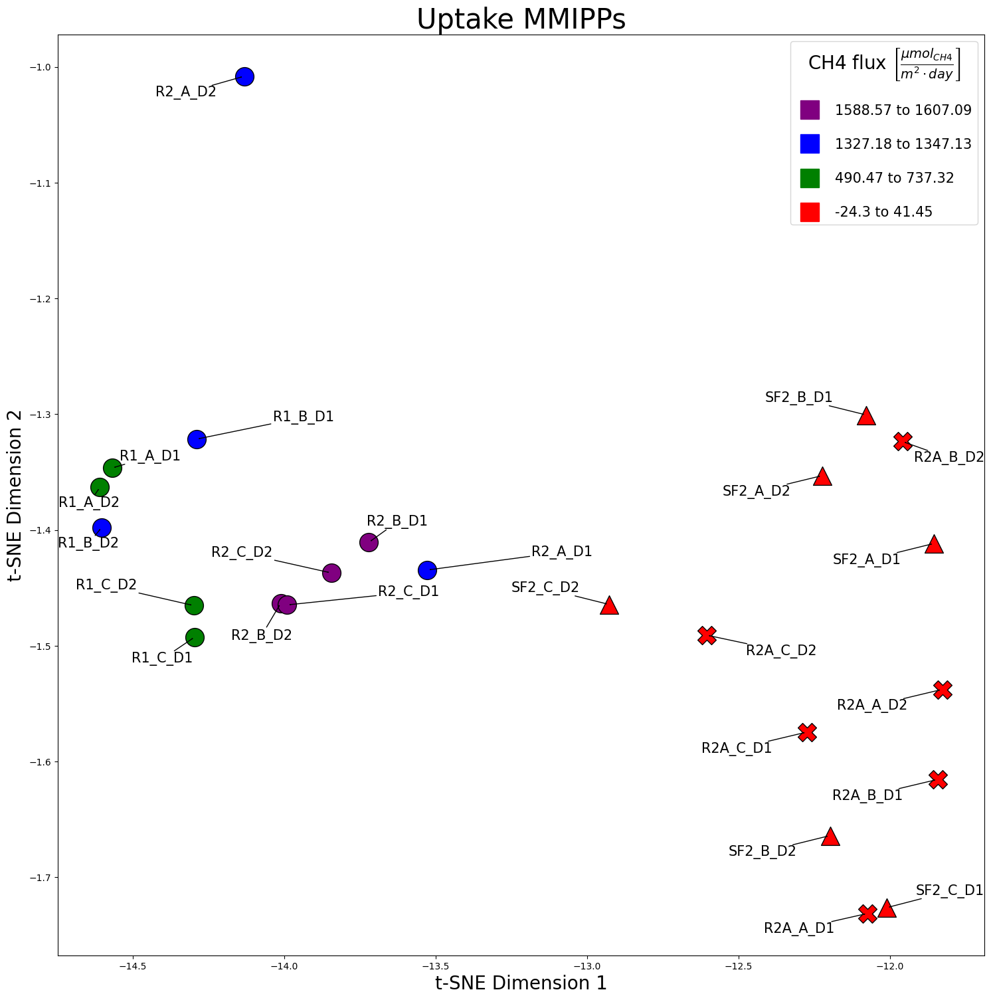

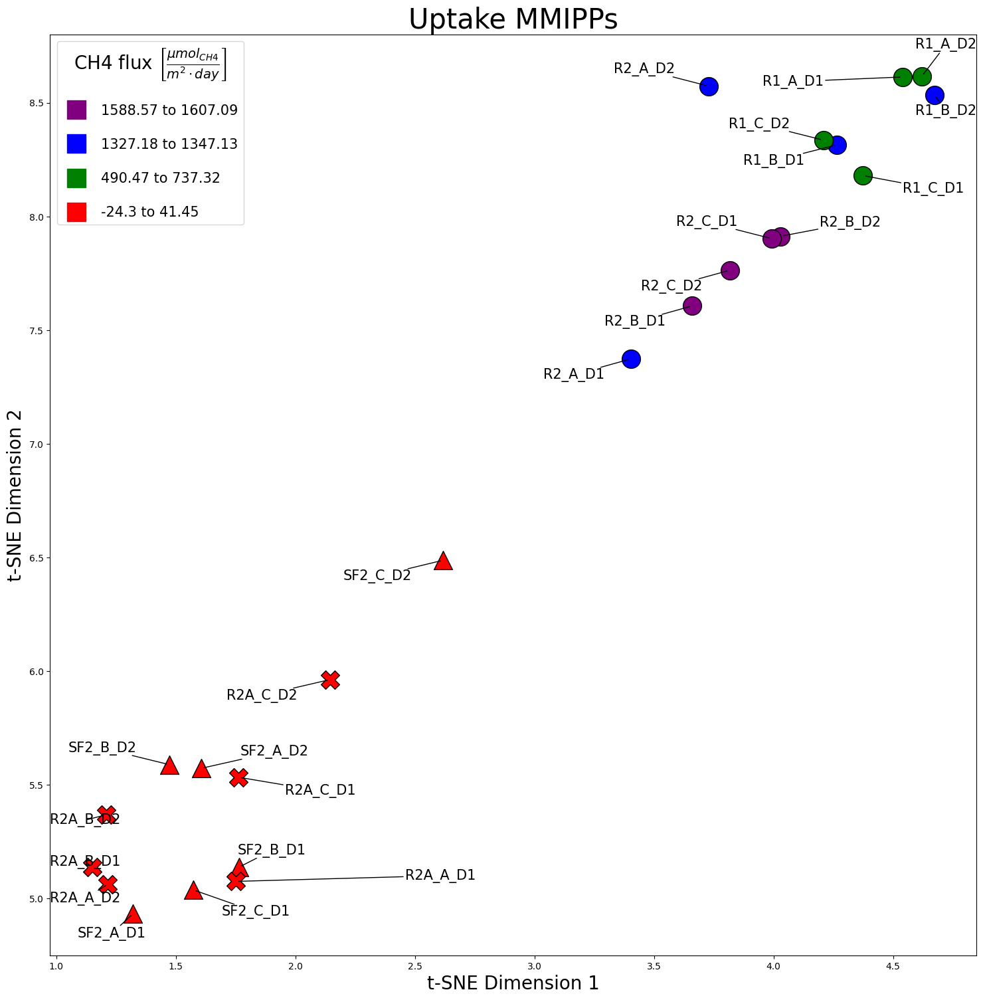

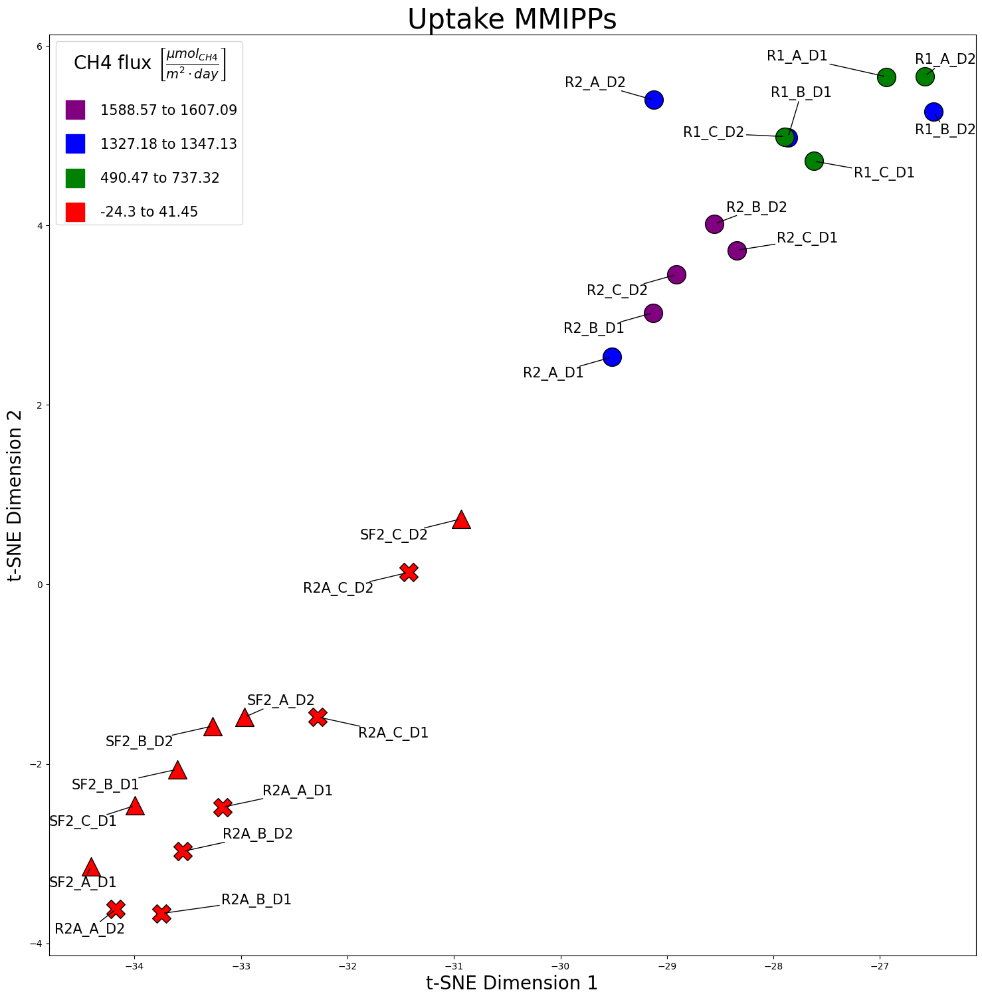

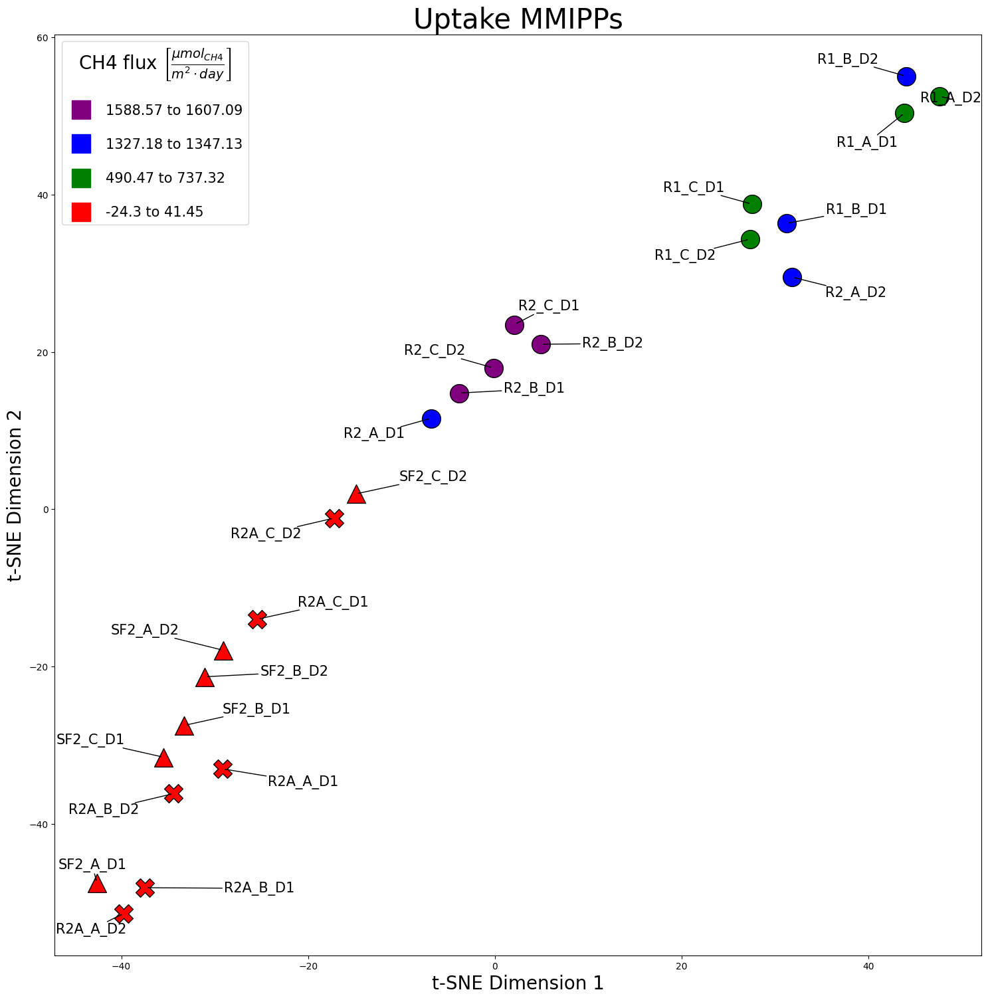

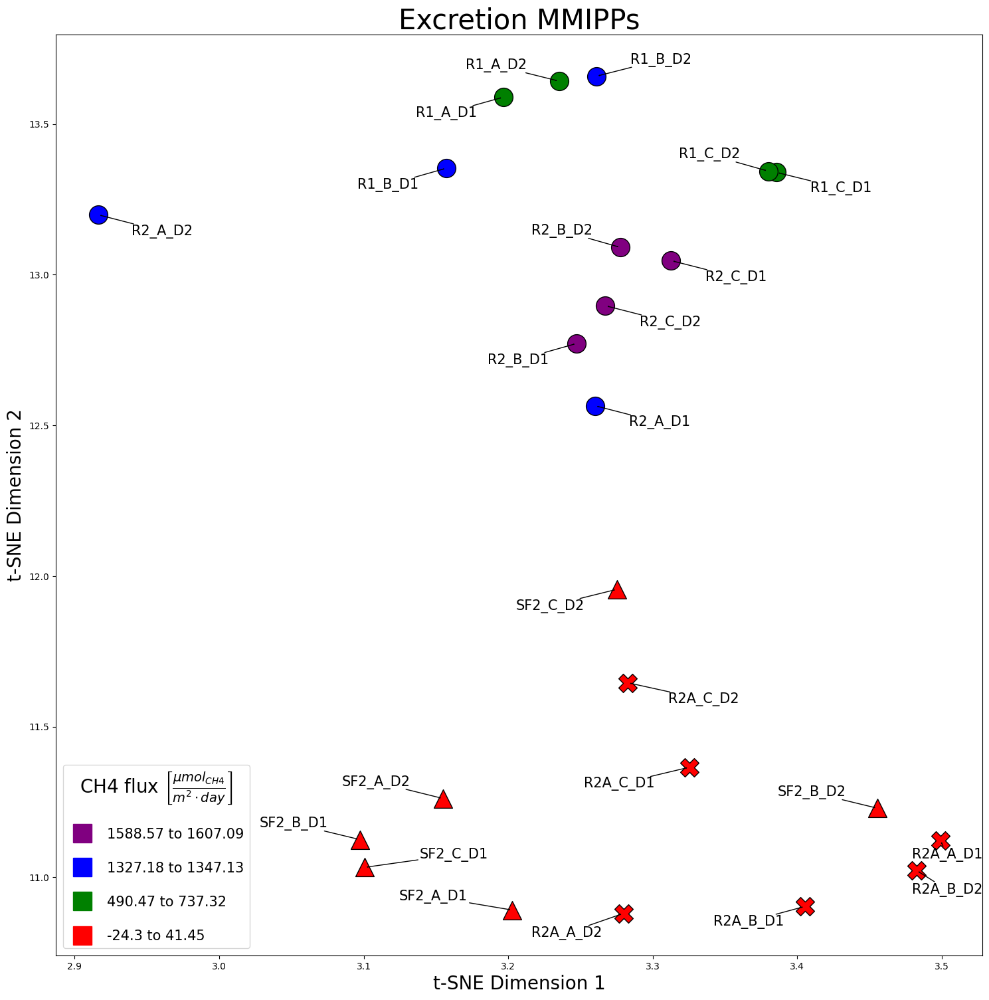

...

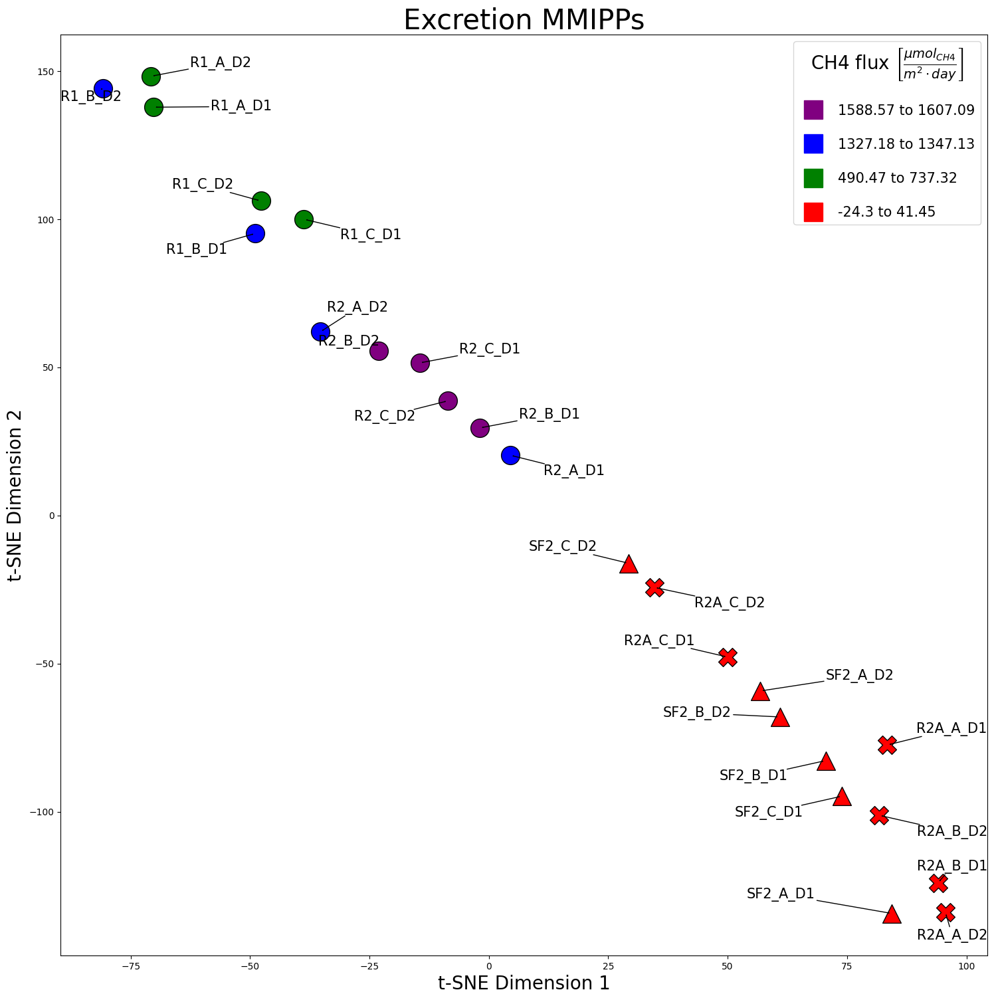

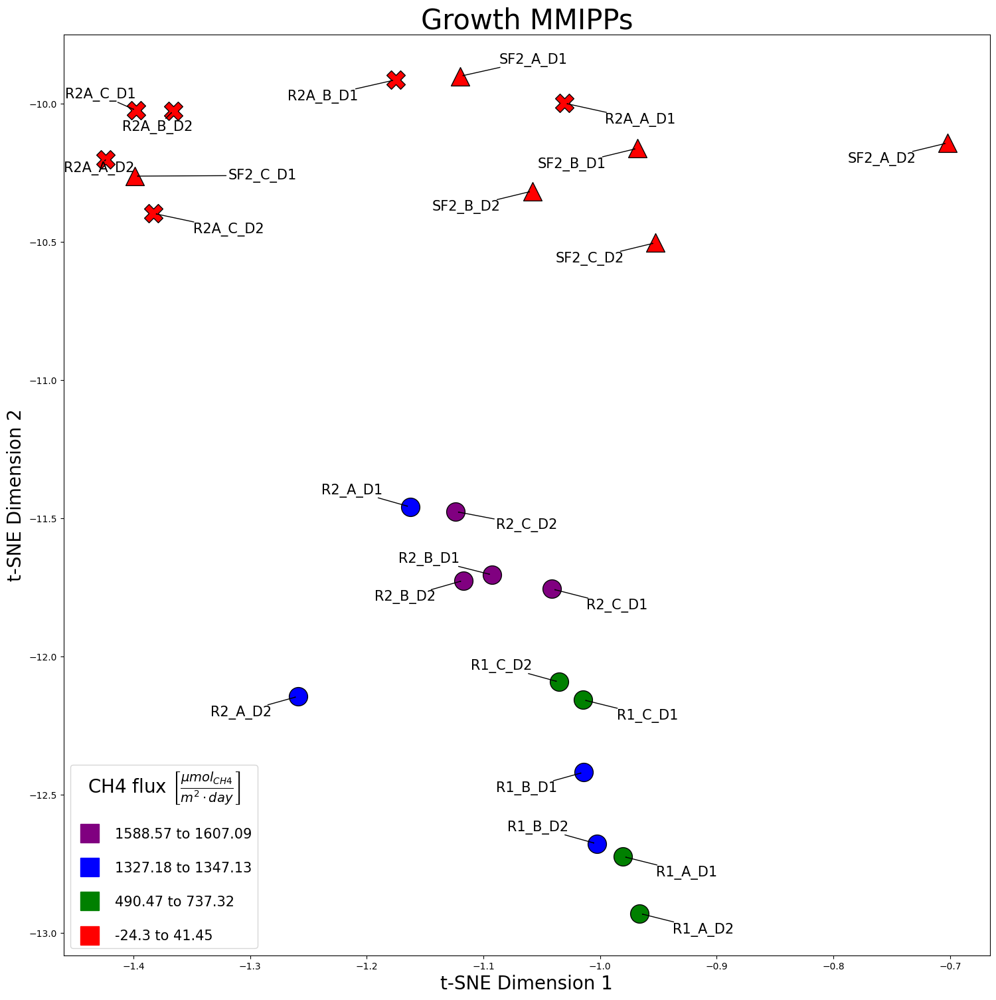

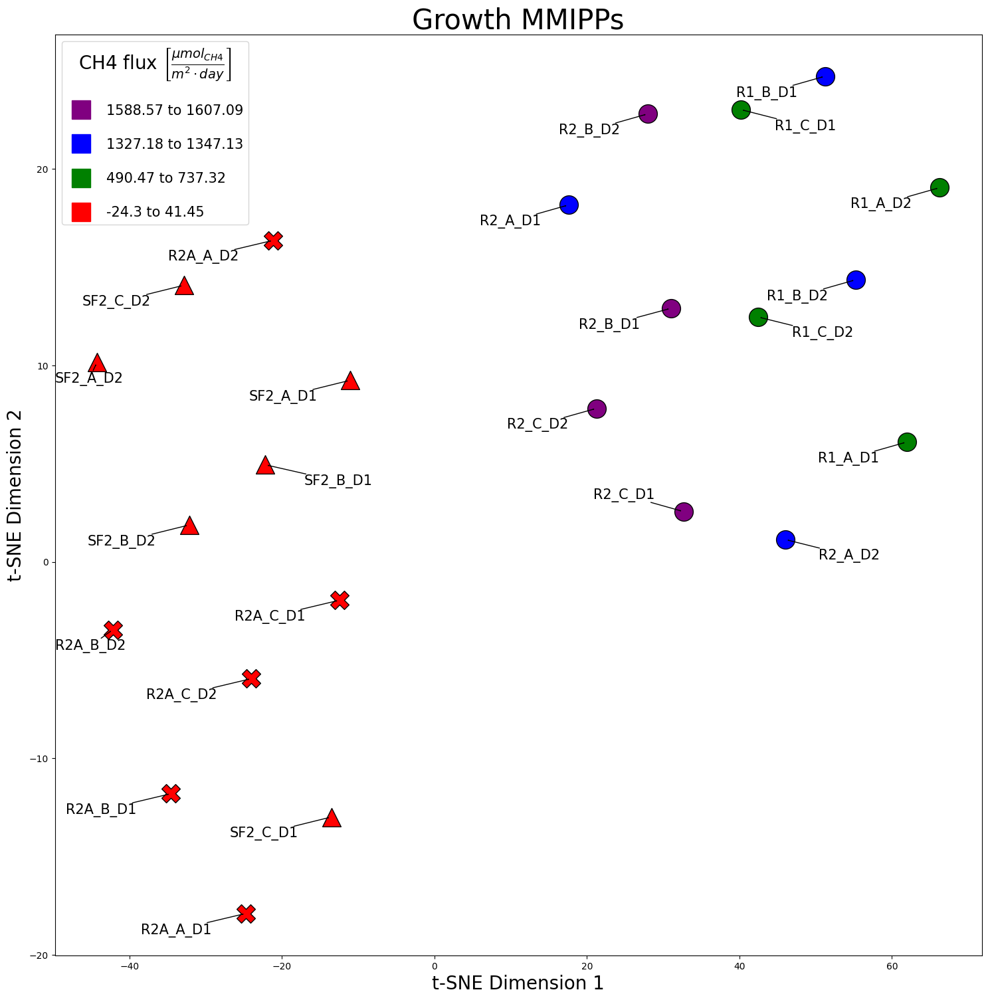

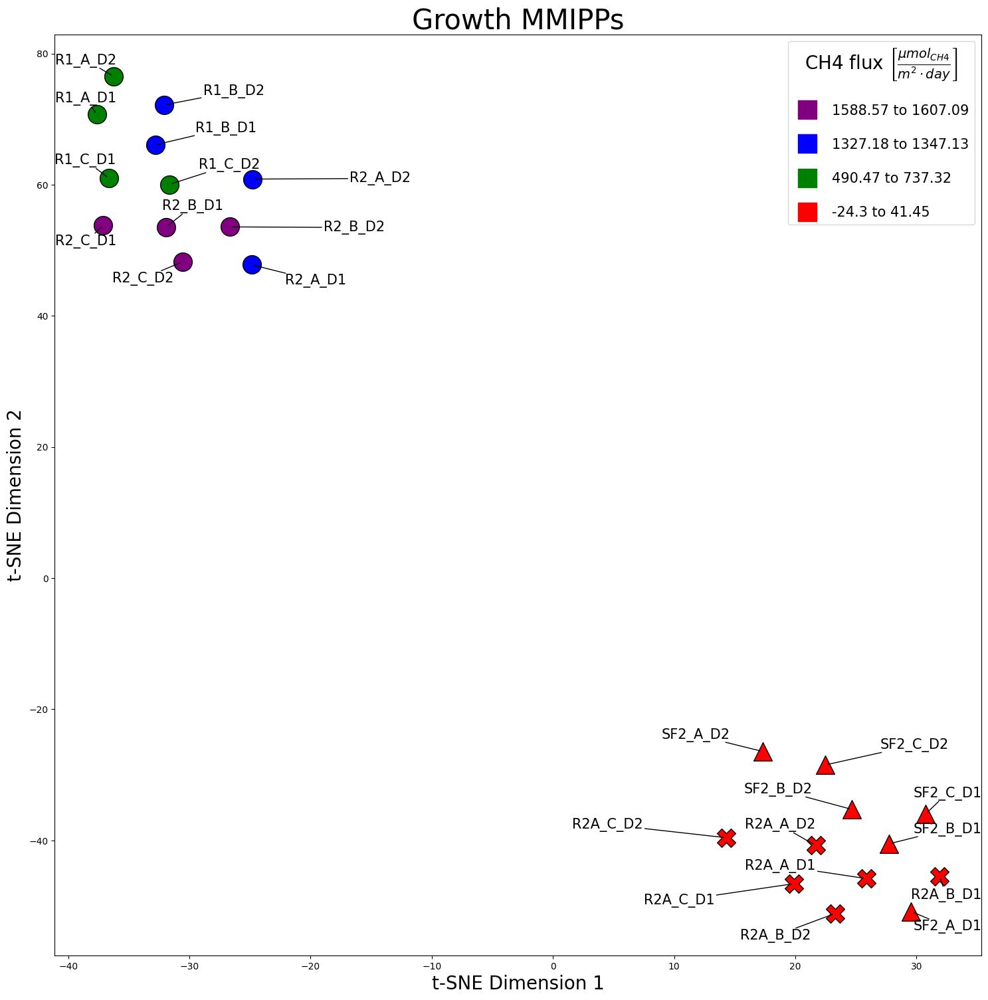

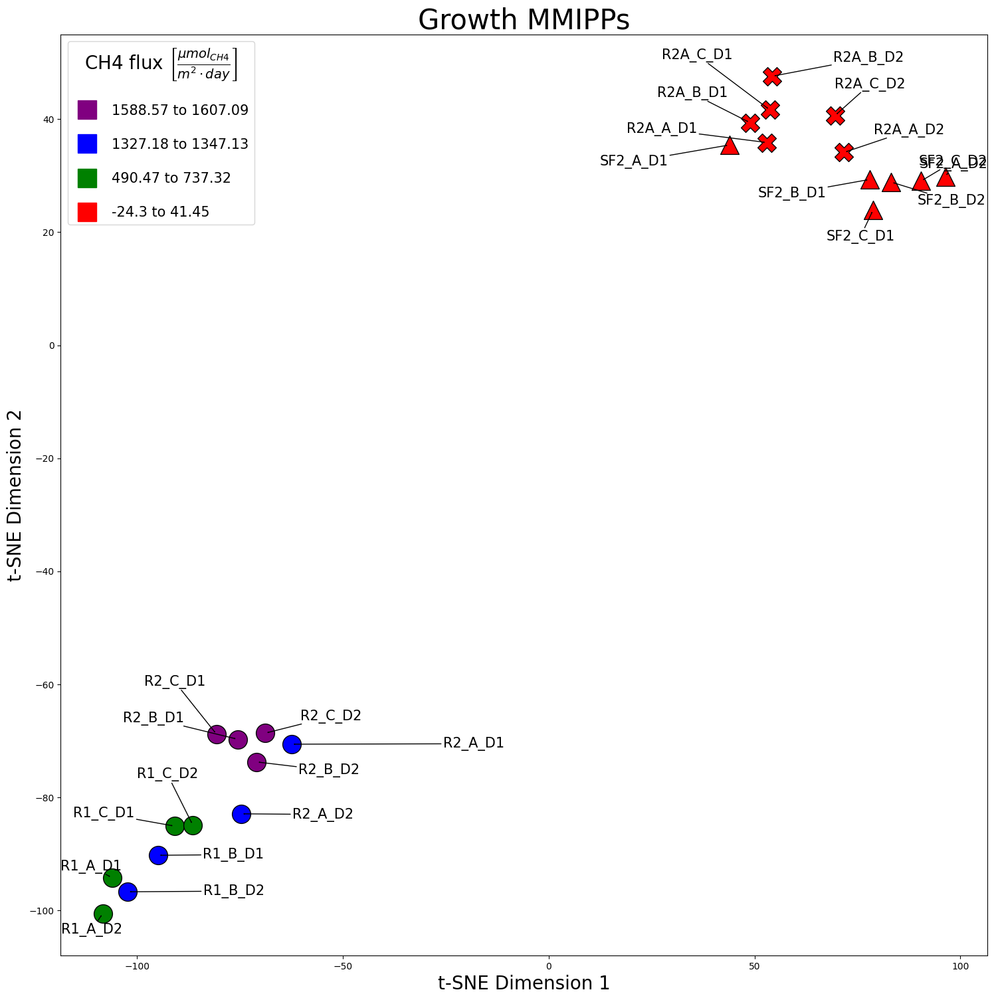

In [2]:
from sklearn.preprocessing import StandardScaler
from matplotlib import pyplot, colors, cm
from pandas import read_csv, Series
from adjustText import adjust_text
from sklearn.manifold import TSNE
from json import load, dump
from glob import glob
from re import sub

# Function to create and plot t-SNE
# Maybe make the above ASV matrix binary: 1 or 0
def create_tsne_plot(data_path, labels=None, title=None, export_name=None, taxonomical_level="order", perplexity=None,
                     titleFont=30, axesFont=20, annotationSize=12, nodeSize=30, legendSize=8, markers=None, nodeColors=None,
                     colorScheme="turbo", colorsHash=None, legendMap=None):
    # load and process the data
    baseName = data_path.replace("_probInteractions", "")

    # define clustering parameters
    s = nodeSize or 10
    indexName = "Sample"
    perplexity = perplexity or 15
    s = nodeSize or 70
    if "Interval" in data_path:
        indexName = "Interval"
        perplexity = perplexity or 5
        s = nodeSize or 120
    # process the df
    df = read_csv(data_path).set_index(indexName).fillna(0)
    if "zScore" not in data_path:  df.drop("Name", axis=0, inplace=True)

    labels = []
    for i in df.index:
        if "SF" in i:
            labels.append("Restored")
        elif "R2A" in i:
            labels.append("Reference")
        else:
            labels.append("Unrestored")
    
    # define the chart labels and corresponding color codes
    df = df.astype(float)
    chart_labels = Series(df.index if labels is None else labels)
    codes = chart_labels.astype('category').cat.codes

    # create the tSNE mapping
    tsne_model = TSNE(n_components=2, random_state=42, perplexity=perplexity, n_iter=5000, learning_rate=50)
    tsne_results = tsne_model.fit_transform(df)
    
    # visualize the tSNE visualization
    title = f"t-SNE of {baseName}" if title is None else title
    pyplot.figure(figsize=(18, 18))
    # pyplot.rcParams['text.usetex'] = True
    pyplot.xlabel('t-SNE Dimension 1', fontsize=axesFont)
    pyplot.ylabel('t-SNE Dimension 2', fontsize=axesFont)
    pyplot.title(title, fontsize=titleFont)
    export_name = export_name or f"{baseName}_tSNE"
    # cmap="winter"  ;   all options are here https://matplotlib.org/stable/users/explain/colors/colormaps.html
    xs, ys = tsne_results[:, 0], tsne_results[:, 1]
    legend_title = r'CH4 flux $\left[\frac{\mu mol_{CH4}}{m^2 \cdot day}\right]$'
    if markers is None:
        ## create the scatter elements and legend contents
        scatter = pyplot.scatter(xs, ys, c=chart_labels.astype('category').cat.codes, cmap='brg', alpha=0.5, s=s)
        handles, _ = scatter.legend_elements()
        pyplot.legend(handles=handles, labels=chart_labels.astype('category').cat.categories.tolist(),
                      title=legend_title, prop={'size': legendSize}, title_fontsize=axesFont)
    else:
        ## create the scatter elements
        labelIndex = dict(zip(chart_labels, codes)) if "Sample" in data_path else dict(zip(labels, codes))
        df['tsne-2d-one'], df['tsne-2d-two'] = xs, ys
        codes.index = df.index
        for i, (index, row) in enumerate(df.iterrows()):
            scatter = pyplot.scatter(row['tsne-2d-one'], row['tsne-2d-two'], s=s, label=labels[i], marker=markers[labels[i]],
                                     color=colorsHash[index], edgecolor="black")
        handles = [pyplot.Line2D([0], [0], color=color, marker="s", markersize=s/20, label=sample, linestyle="None")
                   for sample, color in legendMap.items()]
        pyplot.legend(handles=handles, title=legend_title, prop={'size': legendSize}, title_fontsize=axesFont, labelspacing=1.5)
    ## Add labels to the sample points
    text_labels = df.index if "Sample" in data_path else text_labels 

    # Add labels for each point
    from adjustText import adjust_text
    texts = [pyplot.text(xs[i], ys[i], label, fontsize=annotationSize, ha='center', va='center') for i, label in enumerate(text_labels)]
    adjust_text(texts, arrowprops=dict(arrowstyle='->', color='black'), expand=(2.3, 2.3))
    print(export_name)
    pyplot.savefig(export_name, bbox_inches='tight')#, pad_inches=10)

    
# generate the sample plots
for sample_table in glob("nboutput/Sample*probInteractions_zScore.csv"):
    df = read_csv(sample_table)
    for perplexity in list(range(18, 2, -5)):
        baseName = f"{sample_table.replace('.csv', '')}_tSNE_{perplexity}"
        simulation = sample_table.replace("Sample", '').replace("_probInteractions_zScore.csv", '').split("/")[-1]
        create_tsne_plot(sample_table, perplexity=perplexity, title=f"{simulation.capitalize()} MMIPPs", export_name=baseName,
                         titleFont=30, axesFont=20, nodeSize=400, annotationSize=15, legendSize=15,
                         markers={"Restored":'^', "Unrestored":'o', "Reference": 'X'}, colorsHash=ch4_to_sample,
                         legendMap=legendMap
                        )        

# Clustered SMIPPs Heatmaps

In [101]:
mags_to_highlight = ["Salt_Pond_MetaG_R1_A_D1_MG_DASTool_bins.concoct_out.5.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R1_A_D2_MG_DASTool_bins_concoct_out.21.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R1_A_H2O_MG_DASTool_bins_metabat.14.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R1_A_H2O_MG_DASTool_bins_metabat.8.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R1_B_H2O_MG_DASTool_bins_metabat.17.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R1_C_D1_MG_DASTool_bins_metabat.31.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R1_C_H2O_MG_DASTool_bins_metabat.29.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2_A_D2_MG_DASTool_bins_concoct_out.19.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2_A_D2_MG_DASTool_bins_concoct_out.67.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2_A_D2_MG_DASTool_bins_concoct_out.9.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2_A_D2_MG_DASTool_bins_metabat.14.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2_A_D2_MG_DASTool_bins_metabat.16.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2_A_H2O_MG_DASTool_bins_concoct_out.11.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2_A_H2O_MG_DASTool_bins_concoct_out.29.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2_A_H2O_MG_DASTool_bins_concoct_out.45.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2_A_H2O_MG_DASTool_bins_maxbin.035.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2_A_H2O_MG_DASTool_bins_metabat.14.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2_B_H2O_MG_DASTool_bins_metabat.16.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2_B_H2O_MG_DASTool_bins_metabat.17.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2_B_H2O_MG_DASTool_bins_metabat.29.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2_C_H2O_MG_DASTool_bins_concoct_out.35.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2_C_H2O_MG_DASTool_bins_concoct_out.60.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2_C_H2O_MG_DASTool_bins_metabat.20.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2_C_H2O_MG_DASTool_bins_metabat.29.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2_restored_DShore_MG_DASTool_bins_concoct_out.12.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2_restored_DShore_MG_DASTool_bins_concoct_out.37.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2_restored_DShore_MG_DASTool_bins_concoct_out.40.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2A_A_D2_MG_DASTool_bins_metabat.16.pangenome.RAST.glm4ec",
"Salt_Pond_MetaG_R2A_C_D1_MG_DASTool_bins_concoct_out.52.pangenome.RAST.glm4ec",
"Salt_Pond_MetaGSF2_C_D2_MG_DASTool_bins_concoct_out.25.pangenome.RAST.glm4ec"]

# specify the rows and columns to highlight
with open("datacache/mag_to_name.json", 'r') as jsonIn:
    mag_to_name = load(jsonIn)

mags_to_highlight = [mag_to_name[mag.replace("pangenome.RAST.glm4ec", 'contigs__.RAST')]+".pg.G.D" for mag in mags_to_highlight]
compounds_to_highlight = ["cpd25960", "cpd01024", "cpd00540"]

# store the rows and columns that will be highlighted
from glob import glob
rowIndices, colIndices = {}, {}
for smippTable in glob("nboutput/MAG*probInteractions.csv"):
    ## load and process the DataFrame
    print(smippTable)
    rowIndices[smippTable], colIndices[smippTable] = [], []
    df = read_csv(smmippTable).set_index("MAG")
    df.columns = df.loc["Name"]
    df.drop("Name", axis=0, inplace=True)
    df = df.astype(float)
    df.replace([inf, -inf], nan, inplace=True)
    df.fillna(0, inplace=True)
    
    ## find the matching row indices
    for i, (index, row) in enumerate(table.iterrows()):
        if index in mags_to_highlight:
            rowIndices[smippTable].append(i)
    ## find the matching columns
    for i, col in enumerate(table.columns):
        if col in compounds_to_highlight:
            colIndices[smippTable].append(i)

nboutput/MAGuptake_probInteractions.csv
nboutput/MAGexcretion_probInteractions.csv
nboutput/MAGgrowth_probInteractions.csv


nboutput/MAGuptake_probInteractions.csv
uptake
30 MAGs are not defined in the GTDB data
26 ['Proteobacteria' 'Planctomycetota' 'Spirochaetota' None 'Bacteroidota'
 'Verrucomicrobiota' 'Desulfobacterota_F' 'Actinobacteriota'
 'Firmicutes_A' 'Gemmatimonadota' 'Firmicutes_F' 'Caldatribacteriota'
 'Desulfobacterota' 'Marinisomatota' 'Chloroflexota' 'Campylobacterota'
 'Patescibacteria' 'Acidobacteriota' 'Synergistota' 'Thermotogota'
 'Mcinerneyibacteriota' 'Bipolaricaulota' 'SAR324' 'Krumholzibacteriota'
 'Desulfobacterota_D' 'Deinococcota']


/tmp/ipykernel_123321/1493683621.py:39: FutureWarning: The default value of numeric_only in DataFrame.sum is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  column_sums = df.sum()
/tmp/ipykernel_123321/1493683621.py:40: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  row_sums = df.sum(axis=1)
/opt/env/python3_modelseed/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


nboutput/MAGexcretion_probInteractions.csv
excretion
30 MAGs are not defined in the GTDB data
26 ['Proteobacteria' 'Planctomycetota' 'Spirochaetota' None 'Bacteroidota'
 'Verrucomicrobiota' 'Desulfobacterota_F' 'Actinobacteriota'
 'Firmicutes_A' 'Gemmatimonadota' 'Firmicutes_F' 'Caldatribacteriota'
 'Desulfobacterota' 'Marinisomatota' 'Chloroflexota' 'Campylobacterota'
 'Patescibacteria' 'Acidobacteriota' 'Synergistota' 'Thermotogota'
 'Mcinerneyibacteriota' 'Bipolaricaulota' 'SAR324' 'Krumholzibacteriota'
 'Desulfobacterota_D' 'Deinococcota']


/tmp/ipykernel_123321/1493683621.py:39: FutureWarning: The default value of numeric_only in DataFrame.sum is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  column_sums = df.sum()
/tmp/ipykernel_123321/1493683621.py:40: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  row_sums = df.sum(axis=1)
/opt/env/python3_modelseed/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


nboutput/MAGgrowth_probInteractions.csv
growth
30 MAGs are not defined in the GTDB data
10 ['Bacteroidota' 'Proteobacteria' 'Firmicutes_A' 'Actinobacteriota'
 'Caldatribacteriota' 'Planctomycetota' 'Desulfobacterota'
 'Krumholzibacteriota' 'Gemmatimonadota' 'Spirochaetota']


/tmp/ipykernel_123321/1493683621.py:39: FutureWarning: The default value of numeric_only in DataFrame.sum is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  column_sums = df.sum()
/tmp/ipykernel_123321/1493683621.py:40: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  row_sums = df.sum(axis=1)


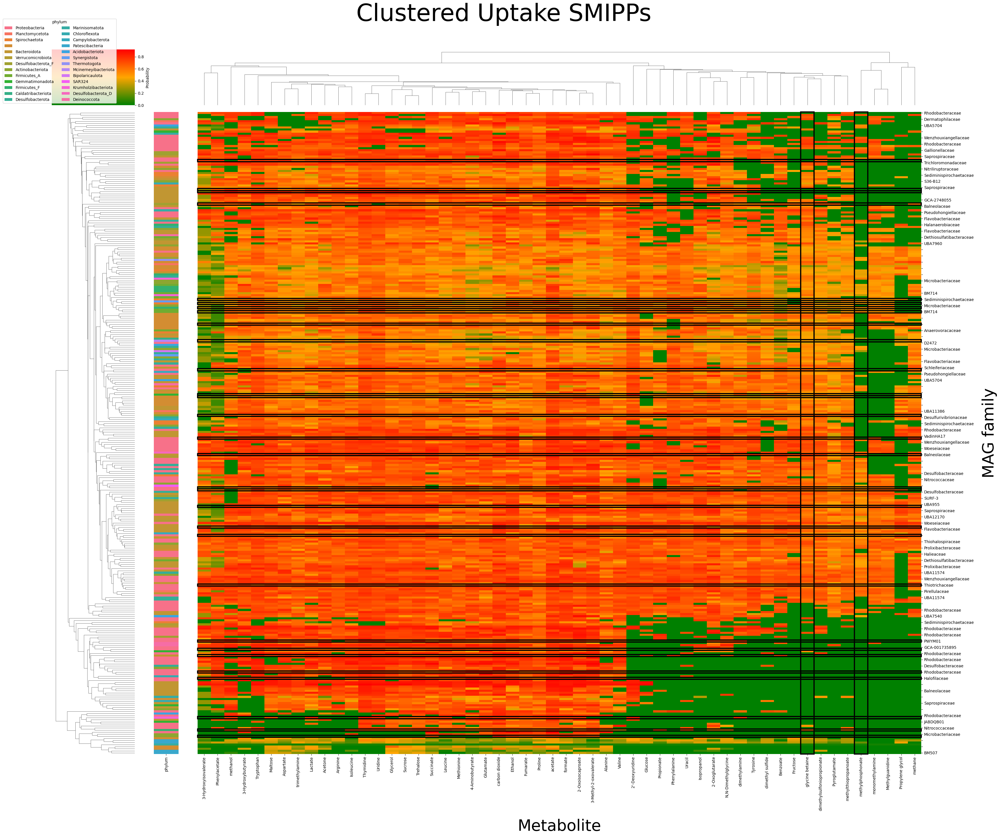

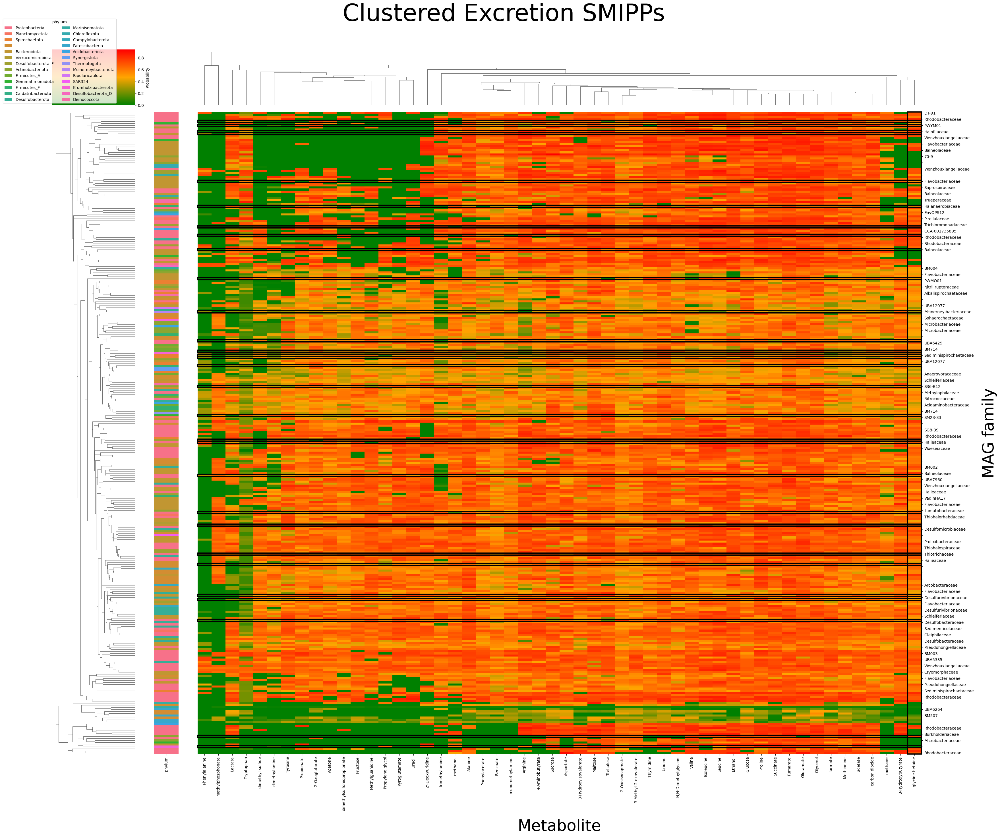

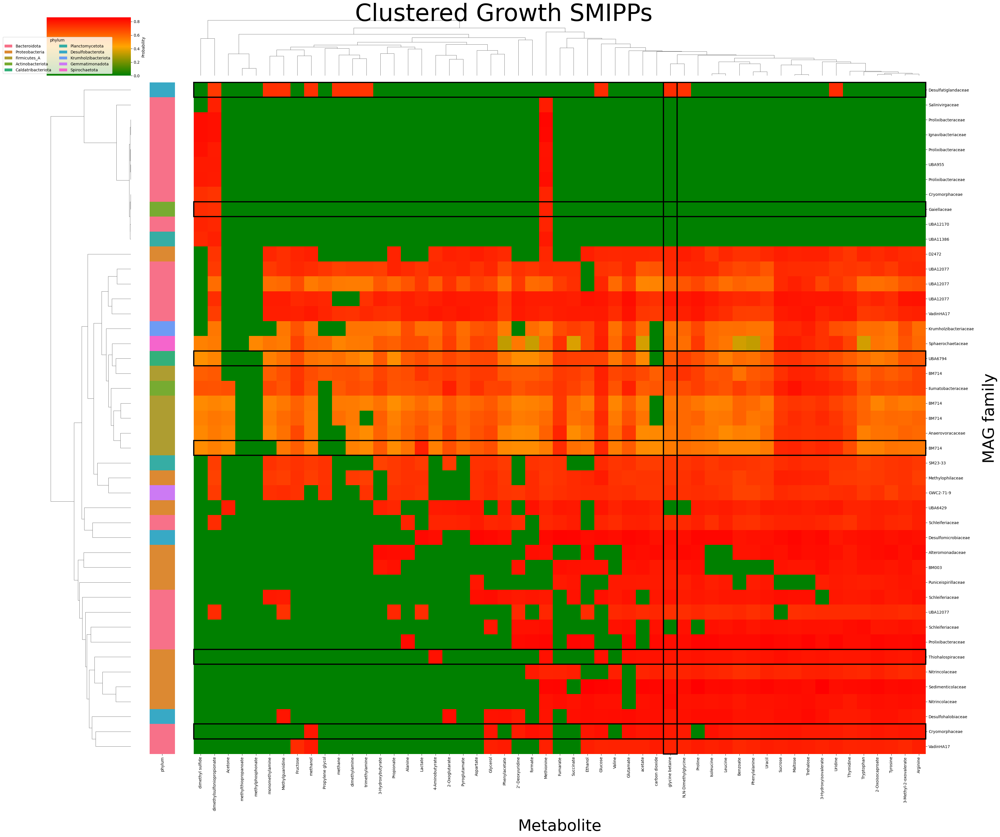

In [118]:
from matplotlib import colors, pyplot, patches
from matplotlib.patches import Patch
from pandas import read_csv
from numpy import inf, nan
import seaborn as sns
from json import load


def ClusterHeatmap(data_path, taxonomy, taxonomical_order="phylum", rows_to_highlight=None, cols_to_highlight=None):
    baseName = data_path.replace("_probInteractions", "").replace("MAG", '').replace(".csv", '').split("/")[-1]
    print(baseName)
    df = read_csv(data_path).set_index("MAG")
    if "zScore" not in data_path:
        df.columns = df.loc["Name"]
        df.drop("Name", axis=0, inplace=True)
    else:
        df.columns = [ID_name[ID] for ID in df.columns]
    df = df.astype(float)
    df.replace([inf, -inf], nan, inplace=True)
    df.fillna(0, inplace=True)
    yAxisTaxa = "family"
    if "labels" not in df.columns:
        taxa_row = []
        newIndex = []
        for i in df.index:
            if i not in taxonomy:
                # print(f"{i} is not defined in the GTDB data")
                taxa_row.append(None)
                newIndex.append(None)
                continue
            taxa_row.append(taxonomy[i].get(taxonomical_order, "other"))
            newIndex.append(taxonomy[i].get(yAxisTaxa, "other"))
        df[taxonomical_order] = taxa_row
    print(f"{len([x for x in taxa_row if x is None])} MAGs are not defined in the GTDB data")
    df.index = newIndex
    df.index.name = f"MAG {yAxisTaxa}"
    
    # Check for zero-sum columns or rows and adjust
    column_sums = df.sum()
    row_sums = df.sum(axis=1)
    zero_sum_columns = column_sums[column_sums == 0].index.tolist()
    zero_sum_rows = row_sums[row_sums == 0].index.tolist()
    if zero_sum_columns:
        df.drop(zero_sum_columns, axis=1, inplace=True)
    if zero_sum_rows:
        df.drop(zero_sum_rows, axis=0, inplace=True)

    uniqueTaxa = df[taxonomical_order].unique()
    print(len(uniqueTaxa), uniqueTaxa)
    mapping = dict(zip(uniqueTaxa, sns.husl_palette(len(uniqueTaxa))))
    row_colors = df[taxonomical_order].map(mapping)
    # print(row_colors)
    df.drop(taxonomical_order, axis=1, inplace=True)
    minimalVal = min([df[col].min() for col in df.columns])
    maximumVal = max([df[col].max() for col in df.columns])
    # print(minimalVal, maximumVal)

    # Define a custom diverging colormap with white at the center
    if minimalVal >= 0:
        cmap = colors.LinearSegmentedColormap.from_list('custom_diverging', ["green", 'orange', 'red'])
        divnorm = colors.TwoSlopeNorm(vmin=minimalVal, vcenter=(minimalVal+maximumVal)/2, vmax=maximumVal)
    else:
        cmap = colors.LinearSegmentedColormap.from_list('custom_diverging', ['blue', 'white', 'red'])
        divnorm = colors.TwoSlopeNorm(vmin=minimalVal, vcenter=0, vmax=maximumVal)

    # create the clustermap
    clusterMap = sns.clustermap(df, row_colors=row_colors, cmap=cmap, norm=divnorm, figsize=(35, 30),
                                dendrogram_ratio=(.1, .08), cbar_kws={"label": "Probability"})
    clusterMap.figure.subplots_adjust(bottom=0.15, top=0.95)  # Adjust these values as needed to fit labels
    clusterMap.figure.suptitle(f"Clustered {baseName.capitalize()} SMIPPs", fontsize=60)
    # clusterMap.ax_col_dendrogram.set_position([0.1, 0.9, 0.8, 0.1])
    clusterMap.ax_heatmap.set_xlabel('Metabolite', fontsize=40, labelpad=20)
    clusterMap.ax_heatmap.set_ylabel(df.index.name, fontsize=40, labelpad=20)
    
    # Create and adjust the legends
    # colorbar = clusterMap.cax
    # legend = clusterMap.ax_heatmap
    pyplot.legend(handles=[Patch(facecolor=color, label=label) for label, color in mapping.items()],
                  ncol=2, title=f'{taxonomical_order}', loc="lower right", bbox_to_anchor=(0.8,0))
    
    # highlight specific rows and/or cols
    if rows_to_highlight:
        dendrogram_row = clusterMap.dendrogram_row.reordered_ind
        for row in rows_to_highlight:
            ## add a rectangular patch
            if row not in dendrogram_row:  continue
            row_pos = dendrogram_row.index(row)
            rect = patches.Rectangle(
                (0, row_pos),  # (x,y) coordinates
                len(df.columns),  # Width
                1,  # Height
                linewidth=3,  # Stroke width
                edgecolor='black',  # Stroke color
                facecolor='none',  # No fill color
                # transform=clusterMap.ax_heatmap.get_yaxis_transform(),
                clip_on=False
            )
            clusterMap.ax_heatmap.add_patch(rect)
    if cols_to_highlight:
        dendrogram_col = clusterMap.dendrogram_col.reordered_ind
        for col in cols_to_highlight:
            ## Add a rectangle patch
            if col not in dendrogram_col:  continue
            col_pos = dendrogram_col.index(col)
            rect = patches.Rectangle(
                (col_pos, 0),  # (x,y) coordinates
                1,  # Width
                len(df.index),  # Height
                linewidth=3,  # Stroke width
                edgecolor='black',  # Stroke color
                facecolor='none',  # No fill color
                # transform=clusterMap.ax_heatmap.get_yaxis_transform(),
                clip_on=False
            )
            clusterMap.ax_heatmap.add_patch(rect)

    # export the figure
    clusterMap.figure.tight_layout()
    # pyplot.setp(clusterMap.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
    clusterMap.figure.savefig(f"{baseName}_heatmap.png")


# parse the taxonomy
with open("datacache/mag_to_name.json", 'r') as jsonIn:
    mag_to_name = load(jsonIn)

# print(mag_to_name)
taxonomy_df = read_csv("data/Saltern_phylogeny.csv")
taxonomy_raw = dict(zip(taxonomy_df["User Genome"].to_list(), taxonomy_df["Classification"].to_list()))
taxonomy = {}
for k,v in taxonomy_raw.items():
    phylogeny = v.split(";")
    phylogeny = [phyla.split("__")[1] for phyla in phylogeny]
    taxonomy[mag_to_name[k+".RAST"]+".pg.G.D"] = dict(zip(["kingdom", "phylum", "class", "order", "family", "genus", "species"], phylogeny))

# generate the ASV plots
from glob import glob
for smippTable in glob("nboutput/MAG*probInteractions.csv"):
    print(smippTable)
    ClusterHeatmap(smippTable, taxonomy, "phylum", rowIndices[smippTable], colIndices[smippTable])
    # break
# Correlating the MMIPPs with metabolomics data

# Correlate the MMIPPs to the metabolomics

## The main metabolomics file



 nboutput/Sampleuptake_probInteractions.csv
2'-Deoxyuridine 2'-Deoxyuridine
2-Oxoglutarate 2-Oxoglutarate
2-Oxoisocaproate 2-Oxoisocaproate
3-Hydroxybutyrate 3-Hydroxybutyrate
3-Hydroxyisovalerate 3-Hydroxyisovalerate
3-Methyl-2-oxovalerate 3-Methyl-2-oxovalerate
4-Aminobutyrate 4-Aminobutyrate
acetate Acetate
Acetone Acetone
Alanine Alanine
Arginine Arginine
Aspartate Aspartate
Benzoate Benzoate
glycine betaine Betaine
dimethylamine Dimethylamine
Ethanol Ethanol
formate Formate
Fructose Fructose
Fumarate Fumarate
Glucose Glucose
Glutamate Glutamate


/tmp/ipykernel_112275/1448934809.py:43: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  pyplot.figure(figsize=(10, 8))  # Set the size of the figure


Glycerol Glycerol
Isobutyrate Isobutyrate
The Isobutyrate computed fluxes are all 0
Isoleucine Isoleucine
Isopropanol Isopropanol
Isovalerate Isovalerate
The Isovalerate computed fluxes are all 0
Lactate Lactate
Leucine Leucine
Maltose Maltose
methanol Methanol
Methionine Methionine
monomethylamine Methylamine
Methylguanidine Methylguanidine
N,N-Dimethylglycine N,N-Dimethylglycine
Phenylacetate Phenylacetate
Phenylalanine Phenylalanine
Proline Proline
Propionate Propionate
Propylene glycol Propylene glycol
Pyroglutamate Pyroglutamate
Succinate Succinate
Sucrose Sucrose
Thymidine Thymidine
Trehalose Trehalose
trimethylamine Trimethylamine
Tryptophan Tryptophan
Tyrosine Tyrosine
Uracil Uracil
Uridine Uridine
Valine Valine


 nboutput/Sampleexcretion_probInteractions.csv
2'-Deoxyuridine 2'-Deoxyuridine
2-Oxoglutarate 2-Oxoglutarate
2-Oxoisocaproate 2-Oxoisocaproate
3-Hydroxybutyrate 3-Hydroxybutyrate
3-Hydroxyisovalerate 3-Hydroxyisovalerate
3-Methyl-2-oxovalerate 3-Methyl-2-oxovalerate
4

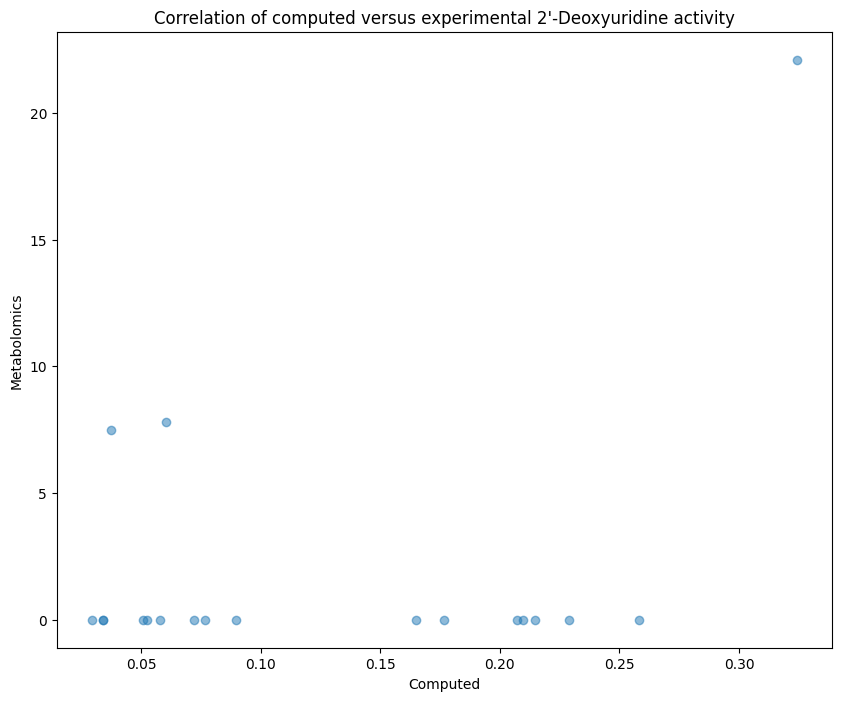

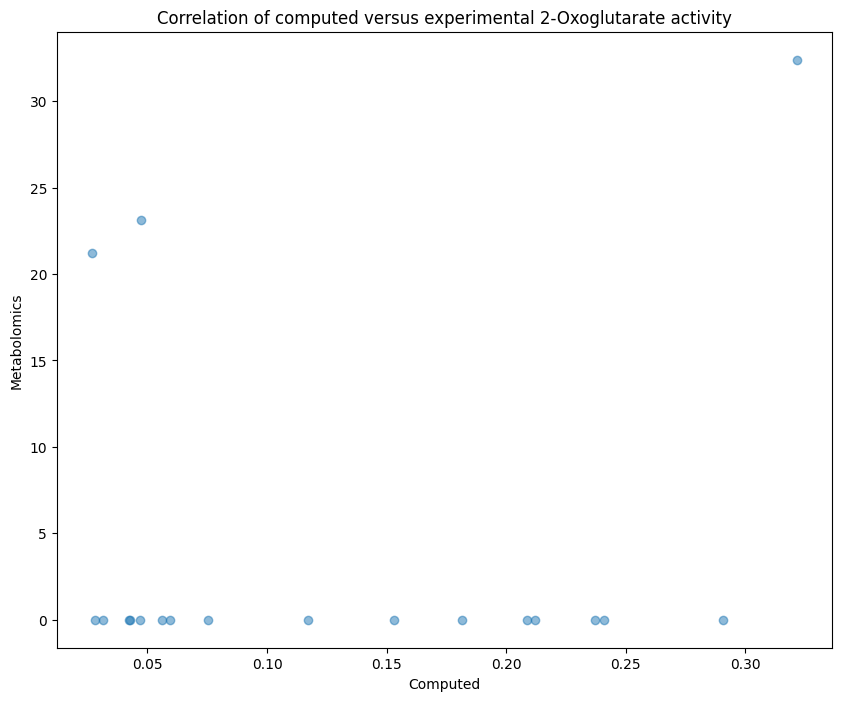

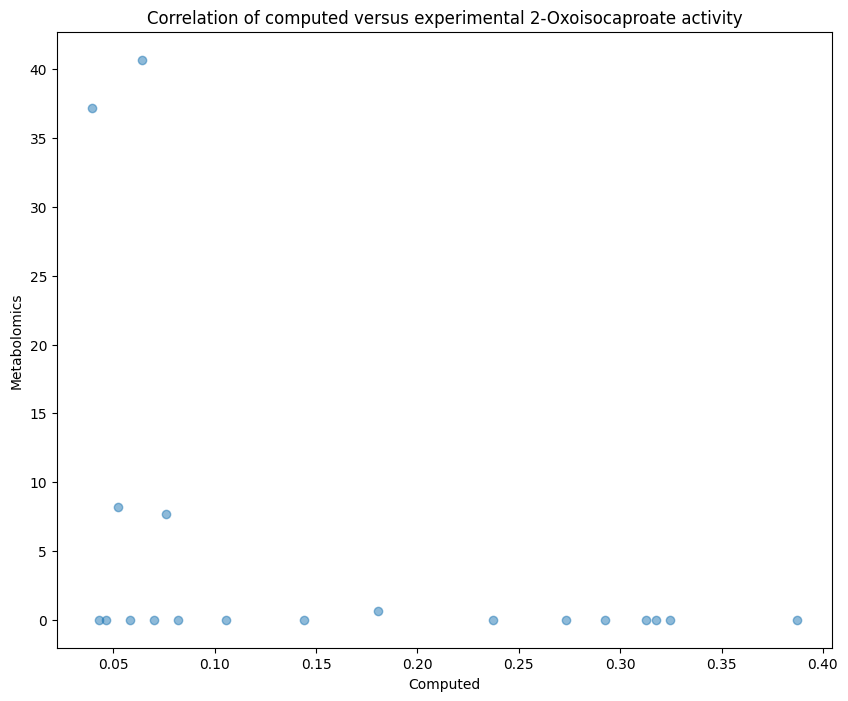

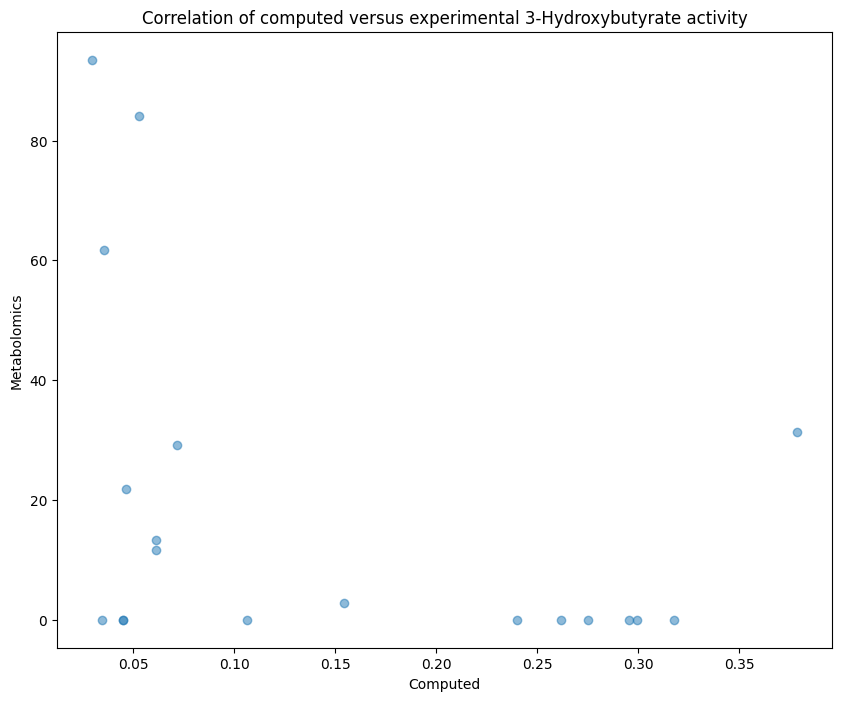

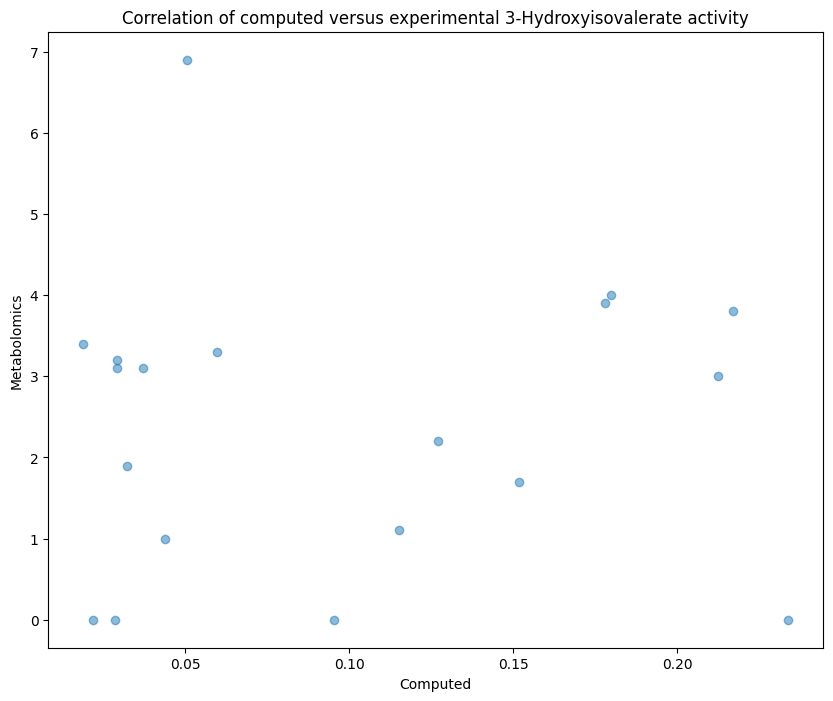

...

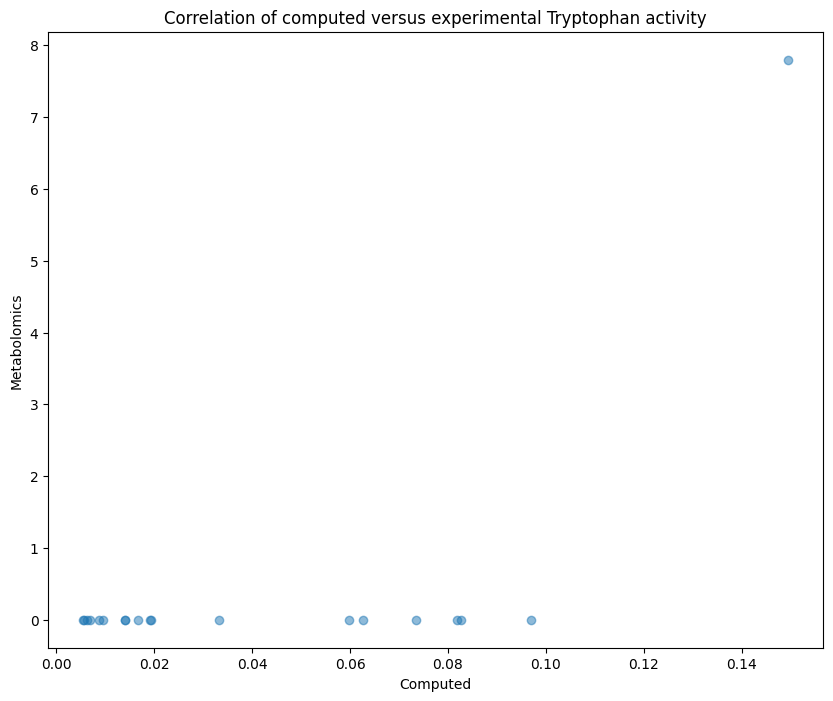

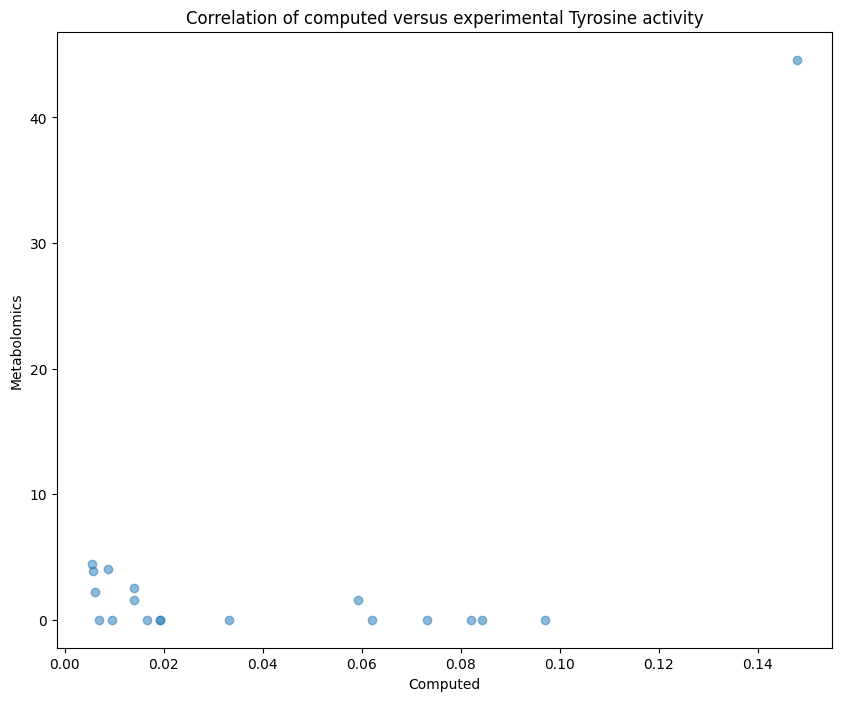

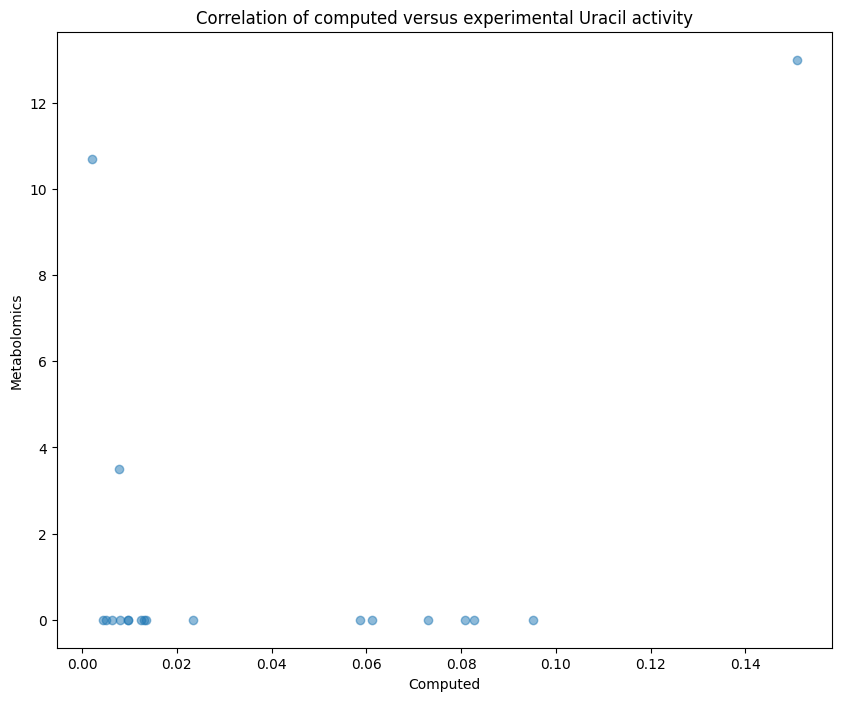

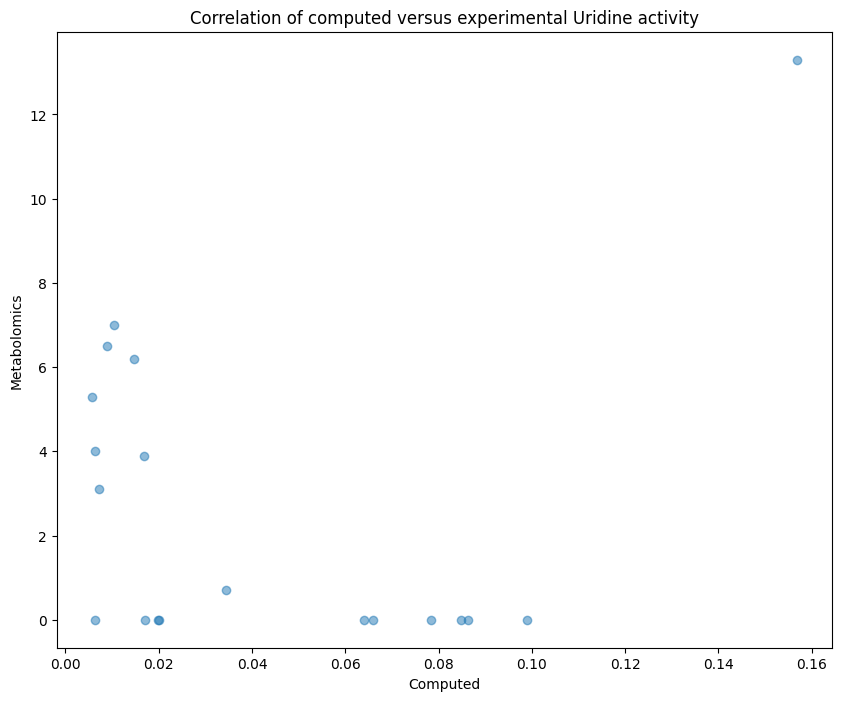

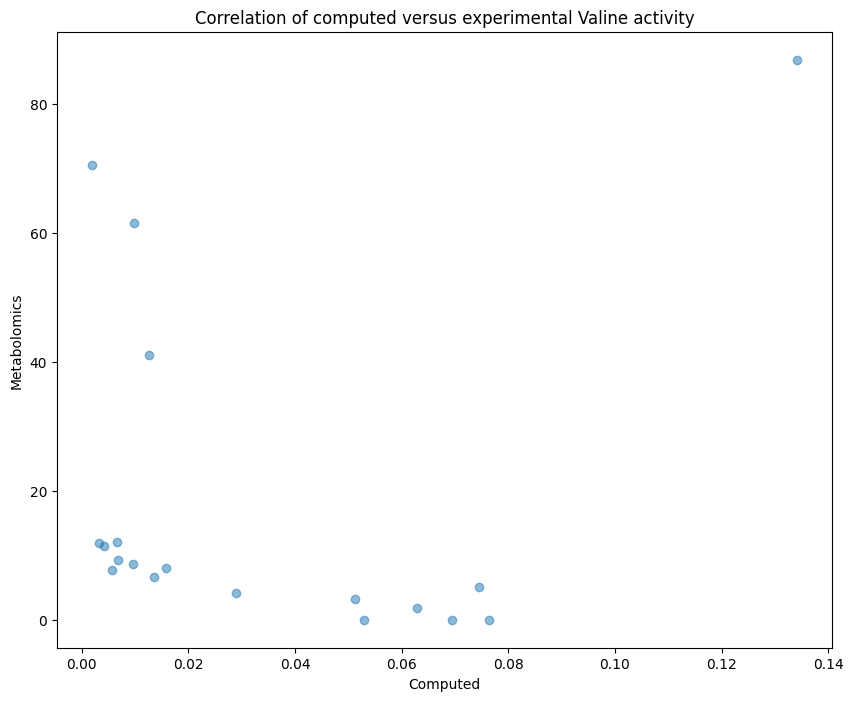

In [17]:
from pandas import read_csv
from matplotlib import pyplot
from numpy import array, delete
from sklearn.linear_model import LinearRegression


def isNumber(val):
    import re
    remainder = re.sub("[0-9.-]+", "", str(val))
    if remainder != "": 
        # print(remainder)
        return False
    return True


def compute_correlations(sample_CSV_path, metabolomics_path):
    # remove sample rows that are not represented in the metabolomics data
    print("\n\n", sample_CSV_path)
    sample = read_csv(sample_CSV_path).set_index("Sample")
    sample.columns = sample.loc["Name"]
    sample = sample.drop("Name", axis=0).astype(float)
    # display(sample)
    simple_path = sample_CSV_path.replace(".csv", "")
    directory, base = simple_path.split("/")[0], simple_path.split("/")[-1]
    # print(list(sample.index))
    metabolomics_df = read_csv("data/Cliff_Sample_Metadata_BGC_NMR.csv").set_index("Sample")
    metabolomics_df.drop(columns=metabolomics_df.columns[list(range(0,42))], inplace=True)
    # display(list(enumerate(metabolomics_df.columns)))
    # display(metabolomics_df)
    # sample_slimmed = sample.drop([index for index in sample.index if index not in metabolomics_df.index], axis=0)
    # metabolomics_df_slimmed = metabolomics_df.drop([index for index in metabolomics_df.index if index not in sample_slimmed.index], axis=0)
    # display(sample_slimmed.head())

    all_xs, all_ys = [], []
    loop_correlations = {}
    for col_x, col_y in zip(sample.columns, metabolomics_df.columns[:len(sample.columns)]):
        print(col_x, col_y)
        xs = sample[col_x]
        ys = metabolomics_df[col_y]
        all_xs.extend(xs) ; all_ys.extend(ys)
        
        # create the correlation figure
        pyplot.figure(figsize=(10, 8))  # Set the size of the figure
        pyplot.scatter(xs, ys, alpha=0.5 #, label=label,
                    # color=colors[i], 
                    # marker=markers[i]
                    )
        pyplot.xlabel('Computed')
        pyplot.ylabel('Metabolomics')
        pyplot.title(f'Correlation of computed versus experimental {col_x} activity')
        pyplot.savefig(f"{directory}/correlationFigs/{col_x}_prob_{base}")

        # Create a linear regression model
        model = LinearRegression()
        fitting_xs = array(xs).reshape(-1, 1)
        fitting_ys = array(ys)
        deleteCount = 0
        for index, val in enumerate(fitting_ys):
            if not isNumber(val):
                fitting_xs = delete(fitting_xs, index-deleteCount)
                fitting_ys = delete(fitting_ys, index-deleteCount)
                deleteCount += 1
        for index, val in enumerate(fitting_xs):
            if not isNumber(val):
                fitting_xs = delete(fitting_xs, index-deleteCount)
                fitting_ys = delete(fitting_ys, index-deleteCount)
                deleteCount += 1
                
        if len(fitting_xs) == 0:
            print(f"The {col_x} metabolite has no computed flux")
            continue
        elif len(fitting_ys) == 0:
            print(f"The {col_x} metabolite has no metabolomics data")
            continue
        elif all(fitting_xs == 0):
            print(f"The {col_x} computed fluxes are all 0")
            continue
        elif len(fitting_xs) == 2:
            print(f"The {col_x} computed fluxes are only 2, which is too few to yield reliable linear fitting")
            continue
        fitting_xs = fitting_xs.reshape(-1, 1)
        model.fit(fitting_xs, fitting_ys)

        # Calculate R^2
        r_squared = model.score(fitting_xs, fitting_ys)
        loop_correlations[col_x] = r_squared if model.coef_[0] >= 0 else -r_squared
    return dict(sorted(loop_correlations.items(), key=lambda item: item[1], reverse=True))


from glob import glob
prob_correlations = {}
for csv_path in glob("nboutput/Sample*probInteractions.csv"):
    prob_correlations[csv_path.replace(".csv", "").split("/")[-1]] = compute_correlations(csv_path, "data/Cliff_Sample_Metadata_BGC_NMR.csv")


In [18]:
from pandas import DataFrame

df = DataFrame(prob_correlations)
df.columns = [col.replace("sample", "").replace("_probInteractions", "") for col in df.columns]
df.drop("Isopropanol", axis=0, inplace=True)
display(df)
df.to_csv("nboutput/sample_correlations.csv")

,Sampleuptake,Sampleexcretion,Samplegrowth
glycine betaine,0.248072,0.265479,0.473332
Maltose,0.217856,0.195827,0.326864
Methionine,0.210188,0.185251,0.338249
Tryptophan,0.203076,0.295046,0.417517
Thymidine,0.183362,0.203427,0.392446
Tyrosine,0.178470,0.208518,0.327124
Propionate,0.154121,0.124251,0.107764
Methylguanidine,0.148262,0.109798,0.127946
trimethylamine,0.134192,0.157833,0.015210
2'-Deoxyuridine,0.127761,0.142569,0.363336


## Specifically methane and CO2

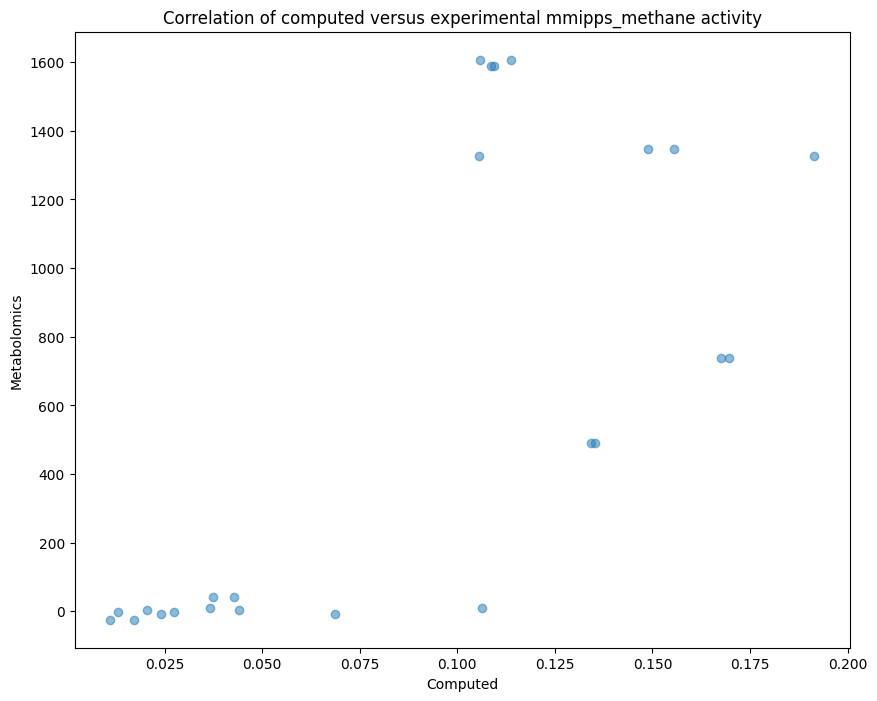

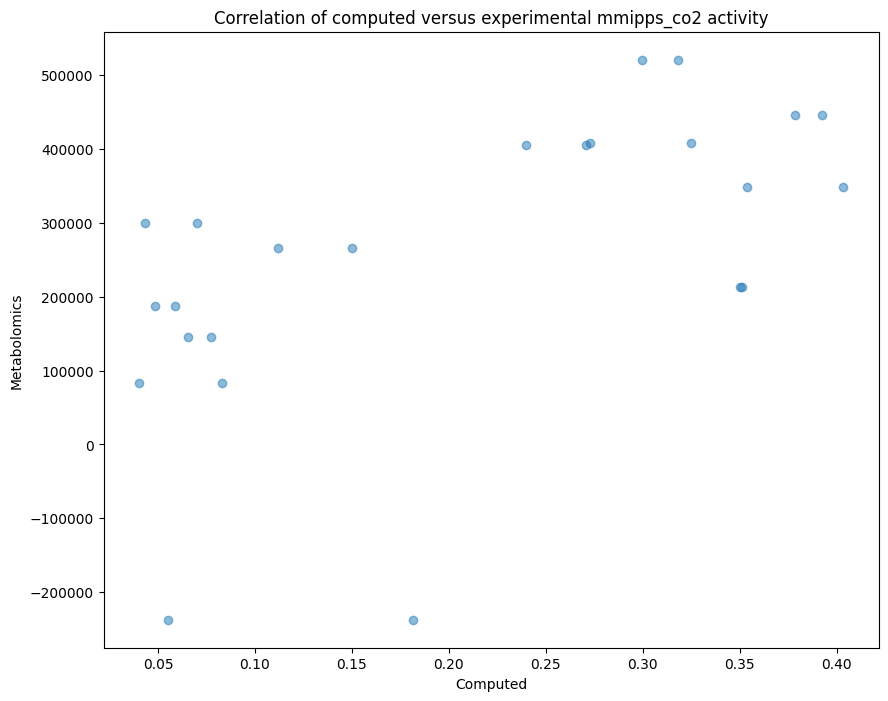

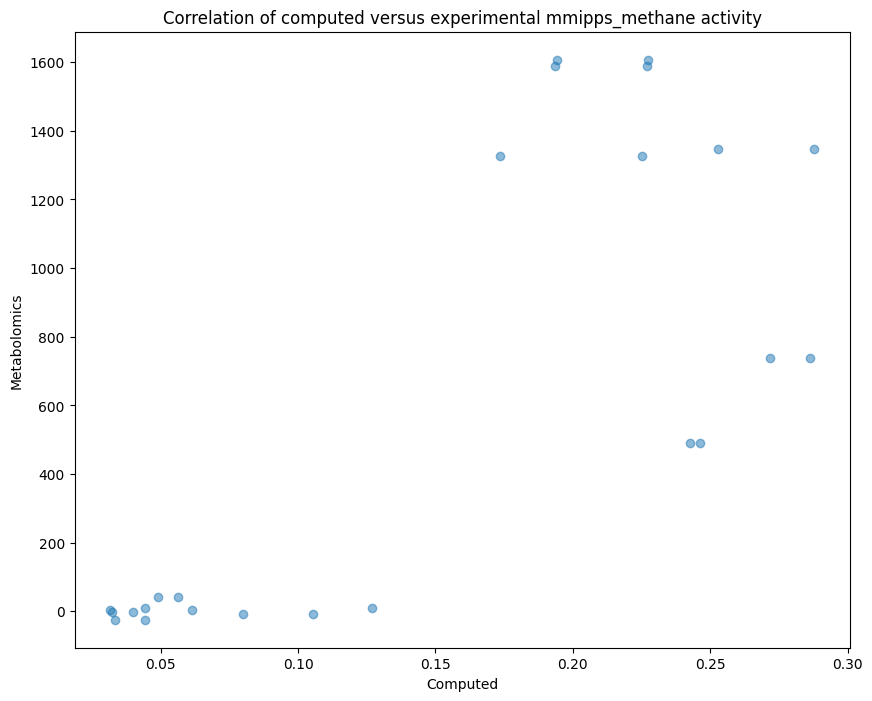

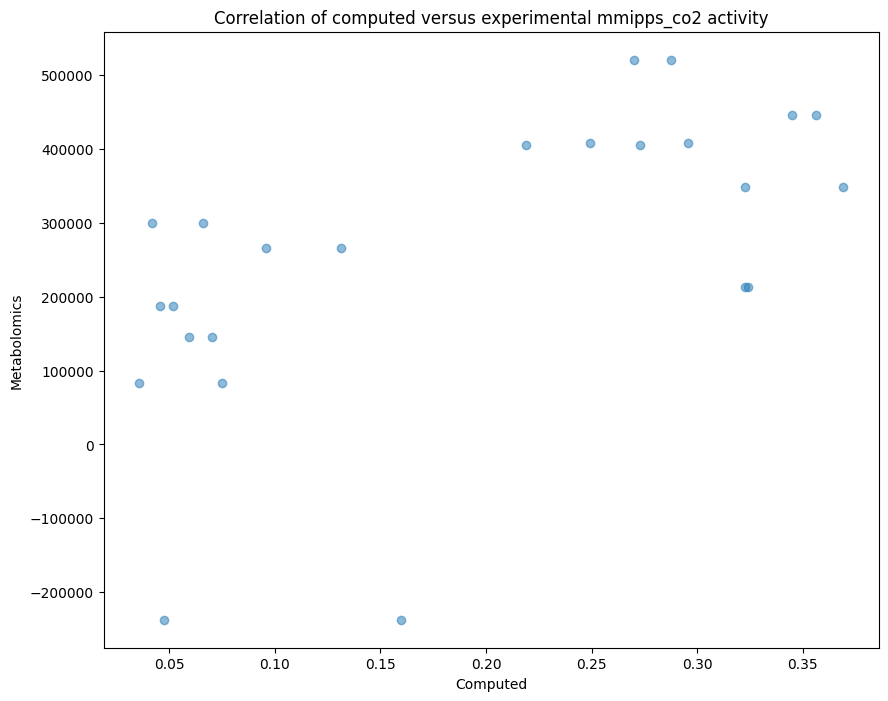

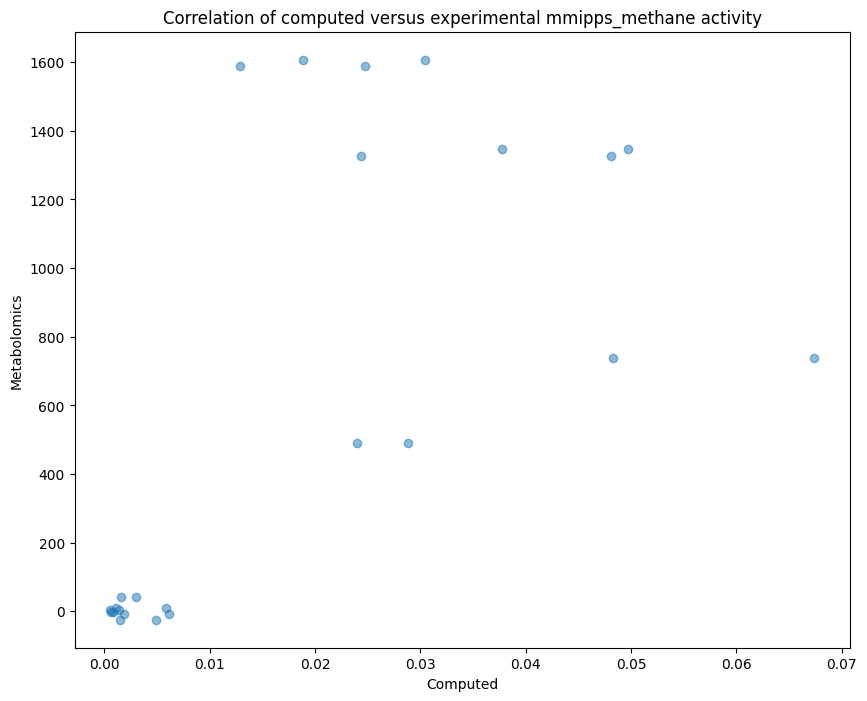

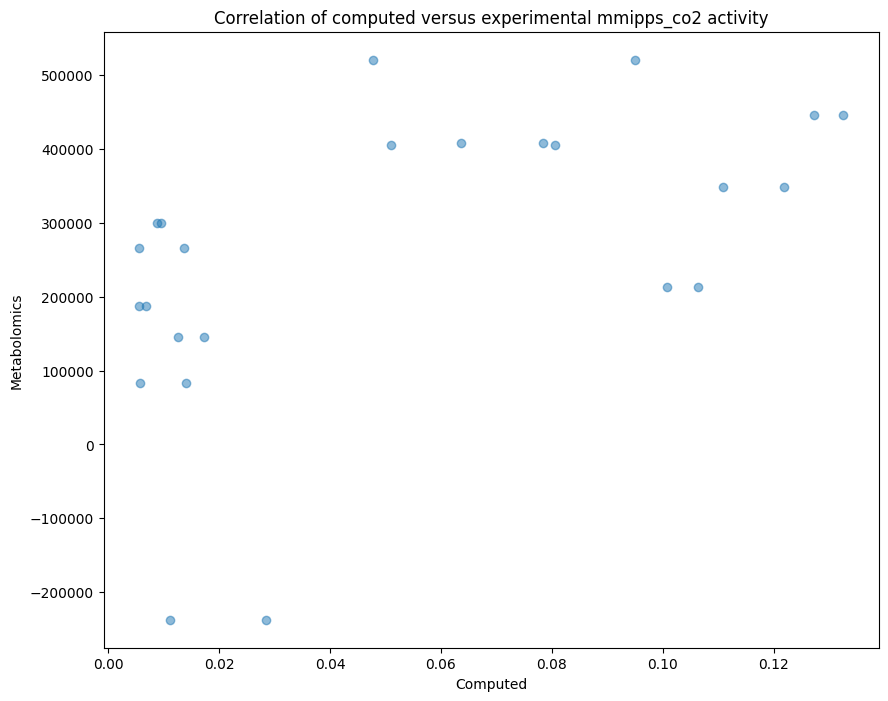

In [11]:
from pandas import read_csv
from matplotlib import pyplot
from numpy import array, delete
from sklearn.linear_model import LinearRegression


def isNumber(val):
    import re
    remainder = re.sub("[0-9.-]+", "", str(val))
    if remainder != "": 
        # print(remainder)
        return False
    return True


def list_correlations(list_pairs, sample_path):
    # remove sample rows that are not represented in the metabolomics data
    directory, base = sample_path.split("/")[0], sample_path.split("/")[-1].replace("probInteractions.csv", '')
    all_xs, all_ys = [], []
    loop_correlations = {}
    for pair in list_pairs:
        # define the pair contents
        xs, ys = [], []
        for col, vals in pair.items():
            if "mmipps" in col.lower():
                col_x, OGxs = col, vals
            elif "metab" in col.lower():
                col_y, OGys = col, vals
        for index, x in OGxs.items():
            xs.append(float(x))
            ys.append(float(OGys[index]))

        # create the correlation figure
        pyplot.figure(figsize=(10, 8))
        pyplot.scatter(xs, ys, alpha=0.5)
        pyplot.xlabel('Computed')
        pyplot.ylabel('Metabolomics')
        pyplot.title(f'Correlation of computed versus experimental {col_x} activity')
        ## TODO color points according to the 
        pyplot.savefig(f"{directory}/correlationFigs/{col_x}_prob_{base}")

        # Create a linear regression model
        model = LinearRegression()
        fitting_xs = array(xs).reshape(-1, 1)
        fitting_ys = array(ys)
        fitting_xs = fitting_xs.reshape(-1, 1)
        model.fit(fitting_xs, fitting_ys)

        # Calculate R^2
        r_squared = model.score(fitting_xs, fitting_ys)
        loop_correlations[col_x] = r_squared if model.coef_[0] >= 0 else -r_squared
    return dict(sorted(loop_correlations.items(), key=lambda item: item[1], reverse=True))


metabolomics_data = read_csv("data/Cliff_Sample_Metadata_BGC_NMR.csv").set_index("Sample")

from glob import glob
prob_correlations = {}
for csv_path in glob("nboutput/Sample*probInteractions.csv"):
    mmipps_data = read_csv(csv_path).set_index("Sample").drop("Name", axis=0)
    prob_correlations[csv_path.replace(".csv", "").split("/")[-1]] = list_correlations([
        {"mmipps_methane": mmipps_data["cpd01024"].to_dict(), "metab_methane": metabolomics_data["CH4_umol_m2_d"].to_dict()},
        {"mmipps_co2": mmipps_data["cpd00011"].to_dict(), "metab_co2": metabolomics_data["CO2_umol_m2_d"].to_dict()}], csv_path)

In [16]:
from pandas import DataFrame

df = DataFrame(prob_correlations)
df.columns = [col.replace("sample", "").replace("_probInteractions", "") for col in df.columns]
df.index = ["CH4", "CO2"]
display(df)
df.to_csv("nboutput/CH4_CO2_sample_correlations.csv")

,Sampleuptake,Sampleexcretion,Samplegrowth
CH4,0.512921,0.603793,0.424646
CO2,0.336057,0.342976,0.285984


## combine the correlations into a single graph

,Uptake,Excretion
Metabolite,,
glycine betaine,0.248072,0.265479
CH4,0.512921,0.603793
Tryptophan,0.203076,0.295046
Thymidine,0.183362,0.203427
Methionine,0.210188,0.185251
Tyrosine,0.178470,0.208518
Maltose,0.217856,0.195827
CO2,0.336057,0.342976
Phenylacetate,-0.246227,-0.276063


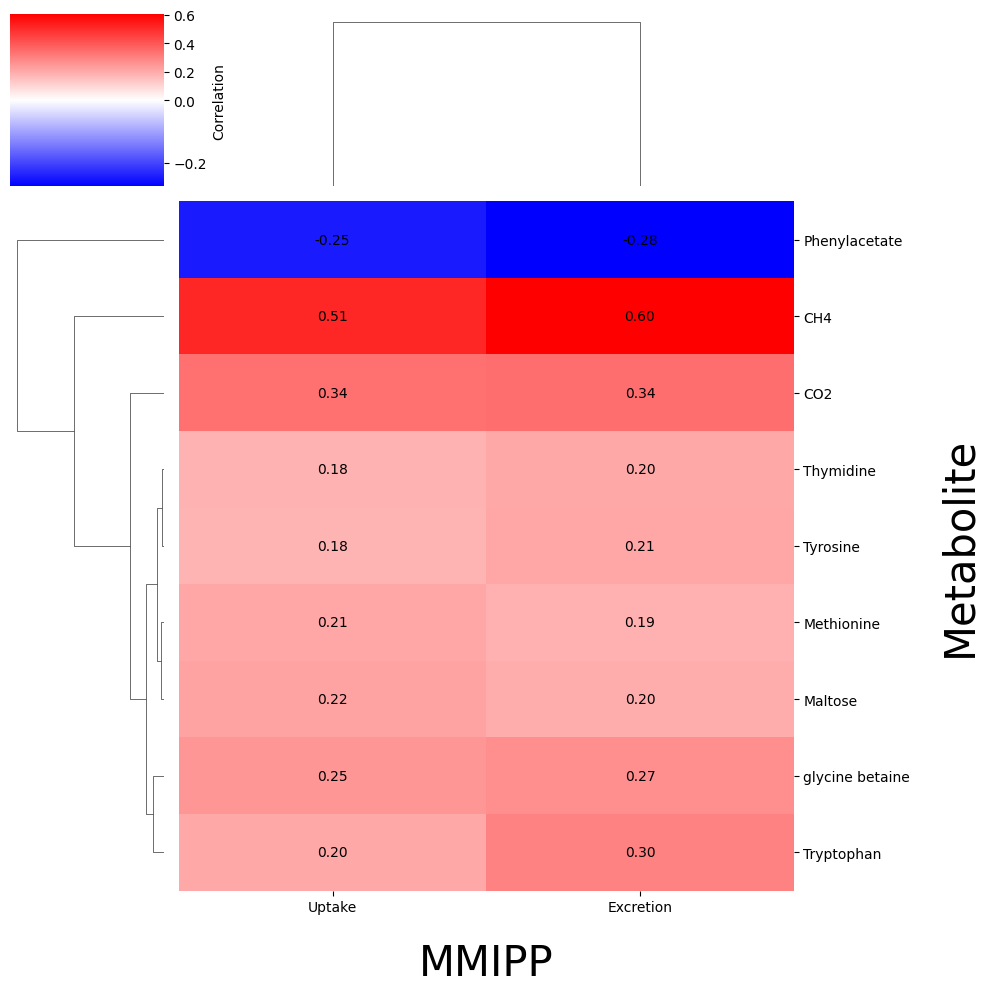

In [10]:
from pandas import read_csv, concat
import seaborn as sns

main_df = read_csv("nboutput/sample_correlations.csv")
gases_df = read_csv("nboutput/CH4_CO2_sample_correlations.csv")

df = concat([main_df, gases_df]).set_index("Unnamed: 0").sort_values(by='Samplegrowth', ascending=False)
df.index.name = "Metabolite"
df.columns = [col.replace("Sample",'').capitalize() for col in df.columns]
df.drop("Growth", axis=1, inplace=True)
for index, row in df.iterrows():
    if all([abs(row[col])<0.2 for col in df.columns]):
        df.drop(index, axis=0, inplace=True)
display(df)
df.to_csv("nboutput/combined_correlations.csv")

# create the clustermap
minimalVal = min([df[col].min() for col in df.columns])
maximumVal = max([df[col].max() for col in df.columns])
clusterMap = sns.clustermap(df,
                            cmap=colors.LinearSegmentedColormap.from_list('custom_diverging', ['blue', 'white', 'red']),
                            norm=colors.TwoSlopeNorm(vmin=minimalVal, vcenter=0, vmax=maximumVal),
                            figsize=(10, 10), cbar_kws={"label": "Correlation"})
# clusterMap = sns.clustermap(df, cmap="coolwarm", figsize=(10, 10), dendrogram_ratio=(.1, .2))
clusterMap.ax_heatmap.set_xlabel('MMIPP', fontsize=30, labelpad=20)
clusterMap.ax_heatmap.set_ylabel('Metabolite', fontsize=30, labelpad=20)

## add values text to the elements
for i in range(clusterMap.data2d.shape[0]):
    for j in range(clusterMap.data2d.shape[1]):
        value = clusterMap.data2d.iloc[i, j]
        clusterMap.ax_heatmap.text(j+0.5, i+0.5, f'{value:.2f}', ha='center', va='center', color='black')

clusterMap.figure.tight_layout()
clusterMap.figure.savefig("MMIPPs-Metabolomics_heatmap.png")

## all MMIPPs to CH4 flux, for each methane cluster

/tmp/ipykernel_2549541/2979039425.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  pyplot.figure(figsize=(10, 8))


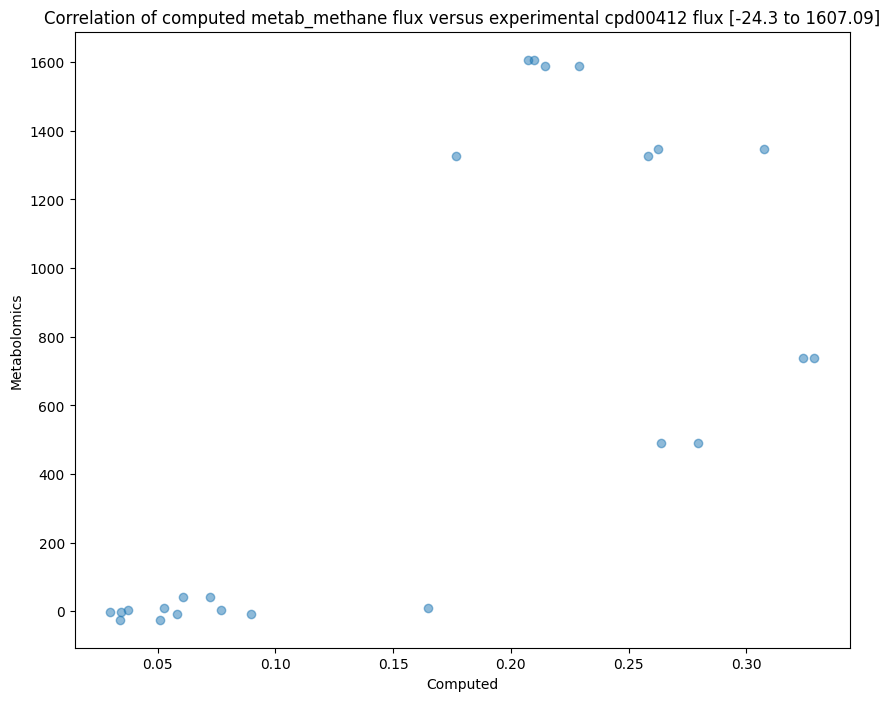

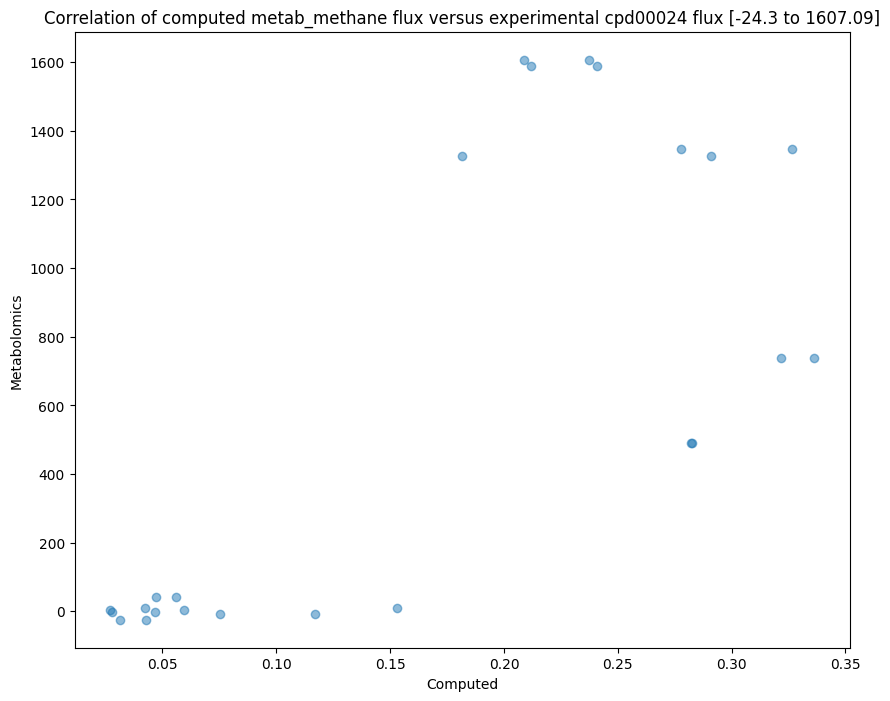

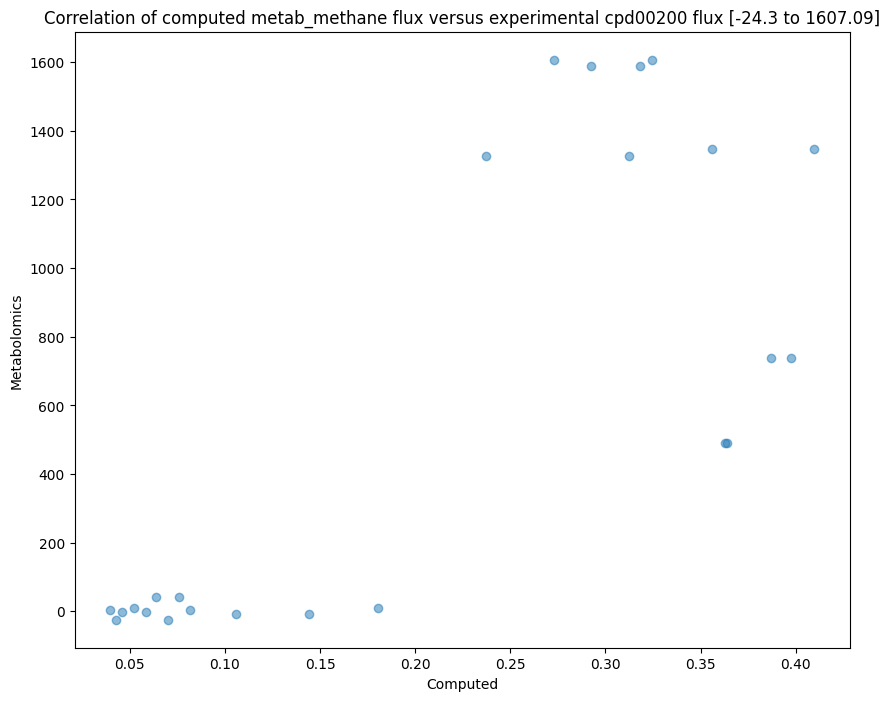

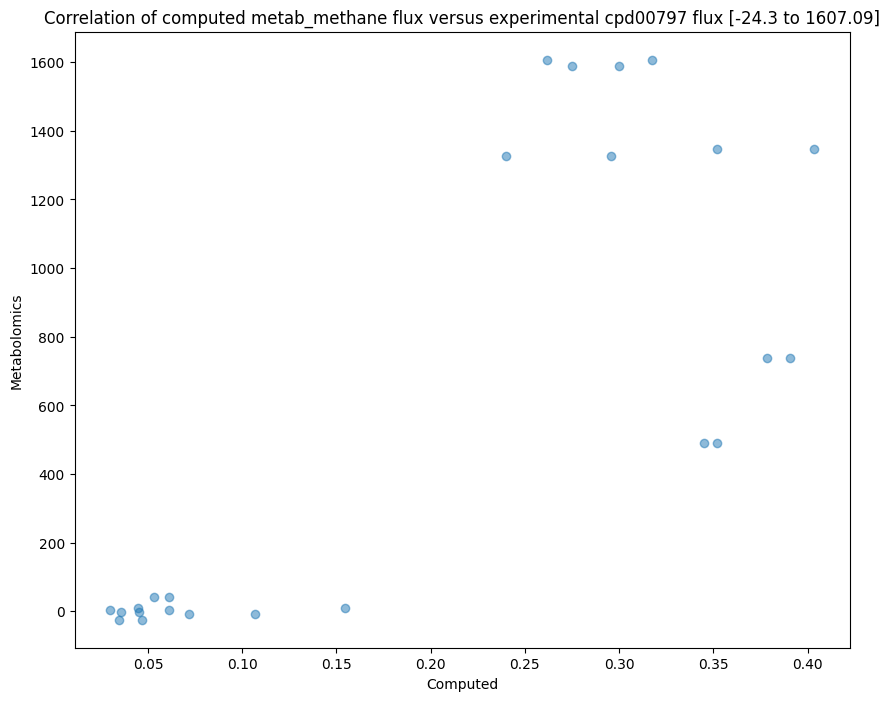

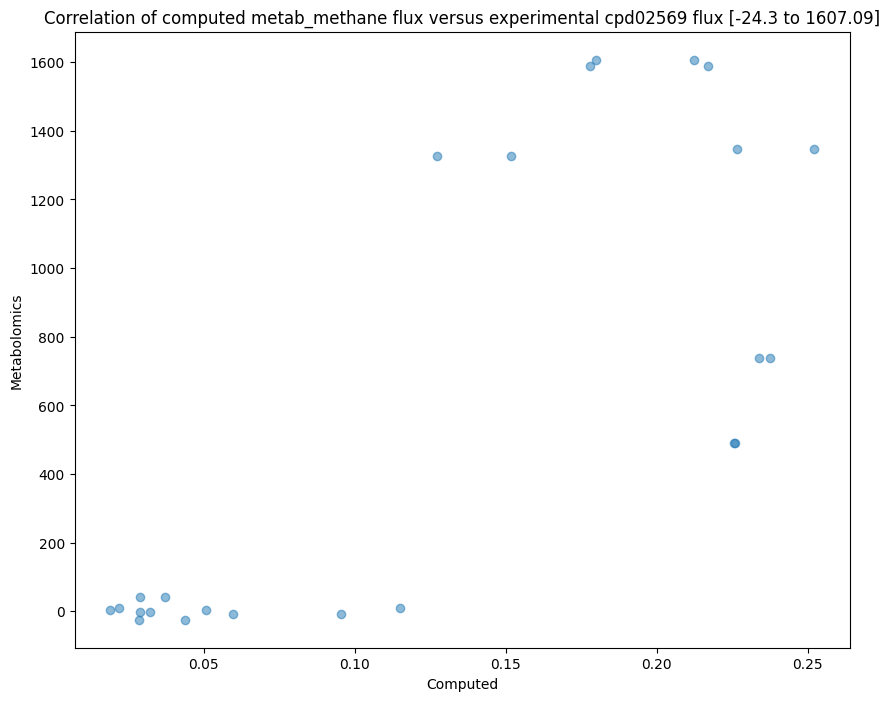

...

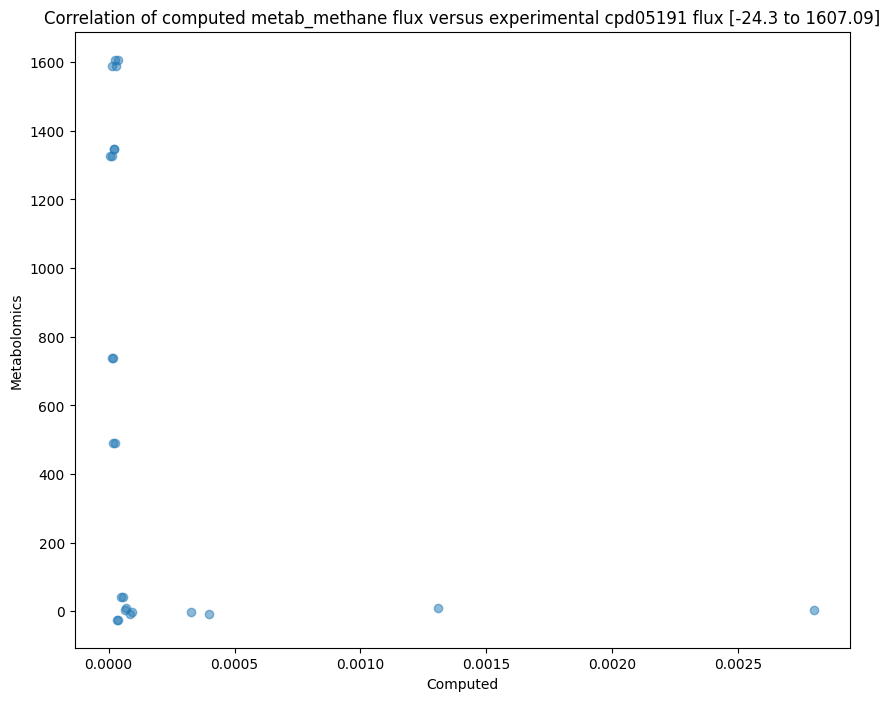

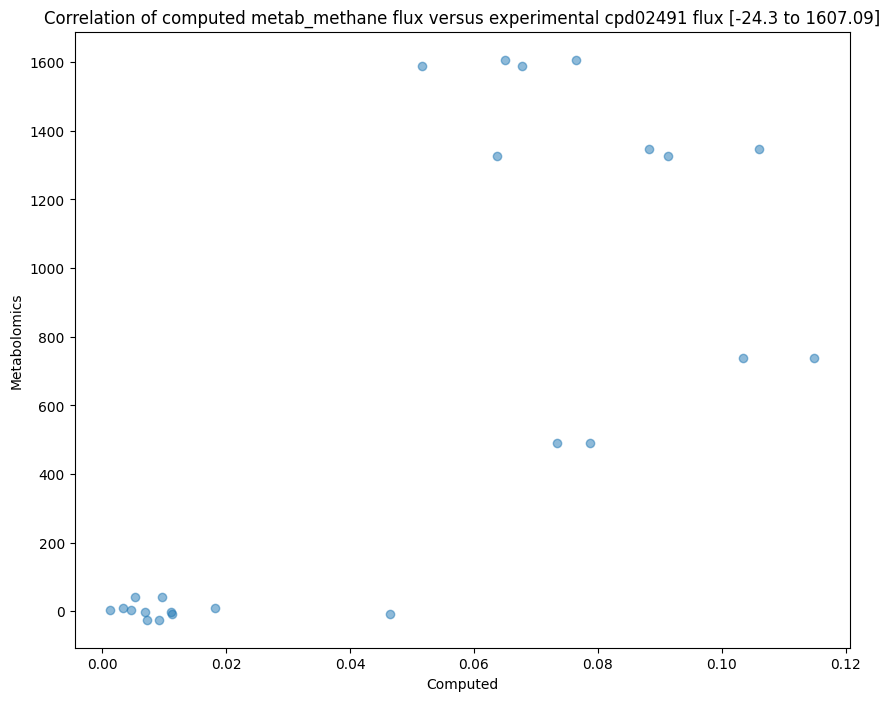

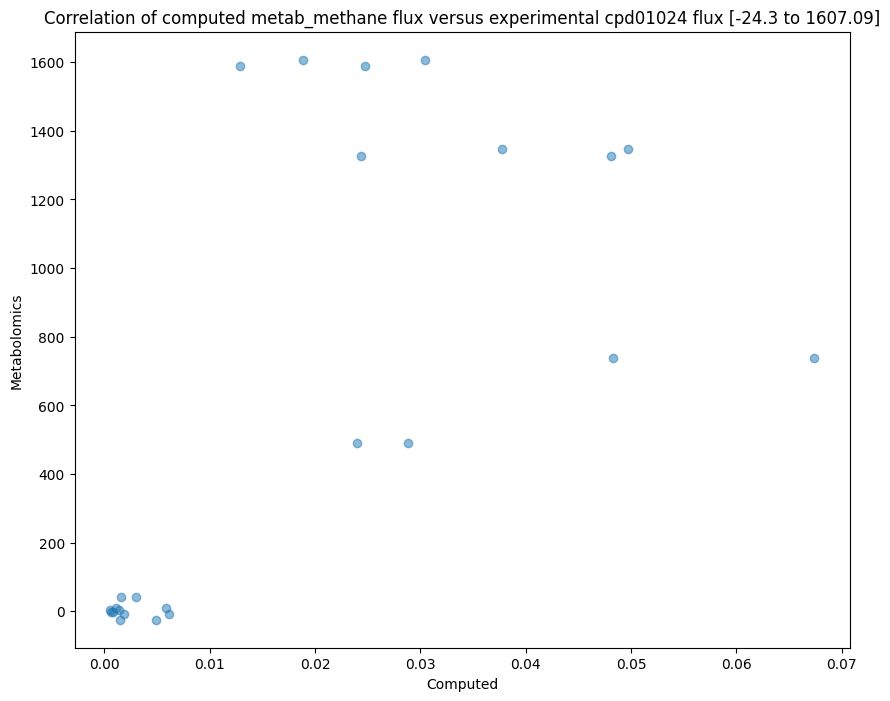

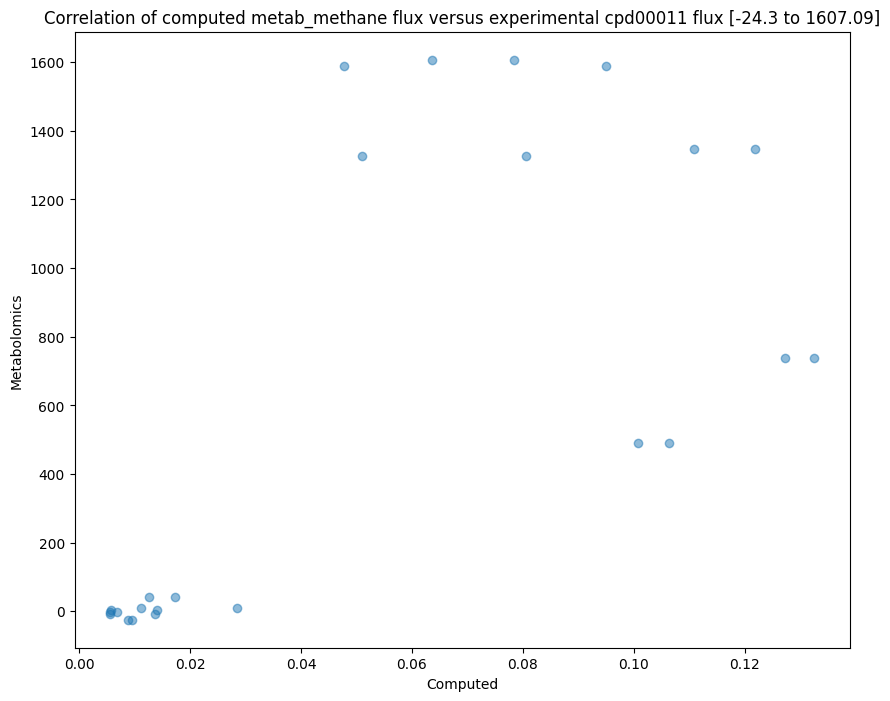

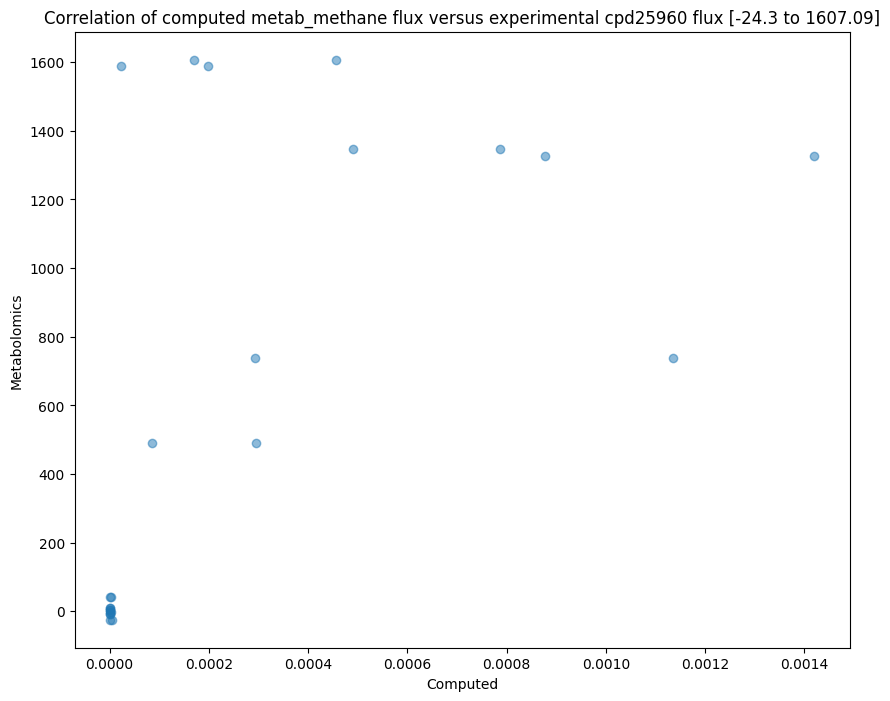

In [44]:
from pandas import read_csv
from matplotlib import pyplot
from numpy import array, delete
from sklearn.linear_model import LinearRegression


def isNumber(val):
    import re
    remainder = re.sub("[0-9.-]+", "", str(val))
    if remainder != "": 
        # print(remainder)
        return False
    return True


def Ch4_correlations(list_pairs, sample_path, color, legend):
    # remove sample rows that are not represented in the metabolomics data
    directory, base = sample_path.split("/")[0], sample_path.split("/")[-1].replace("_probInteractions.csv", '')
    all_xs, all_ys = [], []
    for pair in list_pairs:
        # define the pair contents
        xs, ys = [], []
        for col, vals in pair.items():
            if "mmipps" in col.lower():
                col_x, OGxs = col.replace("mmipps_", ''), vals
            elif "metab" in col.lower():
                col_y, OGys = col, vals
        for index, x in OGxs.items():
            xs.append(float(x))
            ys.append(float(OGys[index]))

        # create the correlation figure
        pyplot.figure(figsize=(10, 8))
        pyplot.scatter(xs, ys, alpha=0.5)
        pyplot.xlabel('Computed')
        pyplot.ylabel('Metabolomics')
        pyplot.title(f'Correlation of computed {col_y} flux versus experimental {col_x} flux [{legend[color]}]')
        pyplot.savefig(f"{directory}/correlationFigs/{col_x}_CH4_{base}_{color}.png")

        # Create a linear regression model
        model = LinearRegression()
        fitting_xs = array(xs).reshape(-1, 1)
        fitting_ys = array(ys)
        fitting_xs = fitting_xs.reshape(-1, 1)
        model.fit(fitting_xs, fitting_ys)

        # Calculate R^2
        r_squared = model.score(fitting_xs, fitting_ys)
        return r_squared if model.coef_[0] >= 0 else -r_squared


metabolomics_data = read_csv("data/Cliff_Sample_Metadata_BGC_NMR.csv").set_index("Sample")
# sampleColor = {'R2A_A_D1': 'red', 'R2A_A_D2': 'red', 'R2A_B_D1': 'red', 'R2A_B_D2': 'red', 'R2A_C_D1': 'red', 'R2A_C_D2': 'red', 'SF2_A_D1': 'red', 'SF2_A_D2': 'red', 'SF2_B_D1': 'red', 'SF2_B_D2': 'red', 'SF2_C_D1': 'red', 'SF2_C_D2': 'red',
#                'R1_A_D1': 'green', 'R1_A_D2': 'green', 'R1_C_D1': 'green', 'R1_C_D2': 'green',
#                'R1_B_D1': 'blue', 'R1_B_D2': 'blue', 'R2_A_D1': 'blue', 'R2_A_D2': 'blue',
#                'R2_B_D1': 'purple', 'R2_B_D2': 'purple', 'R2_C_D1': 'purple', 'R2_C_D2': 'purple'}
colorSample = {'red': ['R2A_A_D1', 'R2A_A_D2', 'R2A_B_D1', 'R2A_B_D2', 'R2A_C_D1', 'R2A_C_D2', 'SF2_A_D1', 'SF2_A_D2', 'SF2_B_D1', 'SF2_B_D2', 'SF2_C_D1', 'SF2_C_D2'],
               'green': ['R1_A_D1', 'R1_A_D2', 'R1_C_D1', 'R1_C_D2'],
               'blue': ['R1_B_D1', 'R1_B_D2', 'R2_A_D1', 'R2_A_D2'],
               'purple': ['R2_B_D1', 'R2_B_D2', 'R2_C_D1', 'R2_C_D2']}
CH4sample = {'low': ['R2A_A_D1', 'R2A_A_D2', 'R2A_B_D1', 'R2A_B_D2', 'R2A_C_D1', 'R2A_C_D2', 'SF2_A_D1', 'SF2_A_D2', 'SF2_B_D1', 'SF2_B_D2', 'SF2_C_D1', 'SF2_C_D2'],
             'high': ['R1_A_D1', 'R1_A_D2', 'R1_C_D1', 'R1_C_D2', 'R1_B_D1', 'R1_B_D2', 'R2_A_D1', 'R2_A_D2','R2_B_D1', 'R2_B_D2', 'R2_C_D1', 'R2_C_D2']}
allSamples = {'full': ['R2A_A_D1', 'R2A_A_D2', 'R2A_B_D1', 'R2A_B_D2', 'R2A_C_D1', 'R2A_C_D2', 'SF2_A_D1', 'SF2_A_D2', 'SF2_B_D1', 'SF2_B_D2', 'SF2_C_D1', 'SF2_C_D2', 'R1_A_D1', 'R1_A_D2', 'R1_C_D1', 'R1_C_D2', 'R1_B_D1', 'R1_B_D2', 'R2_A_D1', 'R2_A_D2','R2_B_D1', 'R2_B_D2', 'R2_C_D1', 'R2_C_D2']}

legendColors = {v:k for k,v in {'1588.57 to 1607.09': 'purple',
 '1327.18 to 1347.13': 'blue',
 '490.47 to 737.32': 'green',
 '-24.3 to 41.45': 'red'}.items()}
CH4legendColors = {v:k for k,v in {'490.47 to 1607.09': 'high', '-24.3 to 41.45': 'low'}.items()}
allLegendColors = {v:k for k,v in {'-24.3 to 1607.09': 'full'}.items()}


        
from glob import glob
prob_correlations = {}
for color, samples in allSamples.items():
    prob_correlations[color] = {}
    for csv_path in glob("nboutput/Sample*probInteractions.csv"):
        baseName = csv_path.replace("_probInteractions.csv", "").split("/")[-1]
        prob_correlations[color][baseName] = {}
        mmipps_data = read_csv(csv_path).set_index("Sample").drop("Name", axis=0).loc[samples]
        # mmipps_data = mmipps_data[mmipps_data == samples]
        for col in mmipps_data.columns:
            prob_correlations[color][baseName][col] = Ch4_correlations([
                {f"mmipps_{col}": mmipps_data[col].to_dict(), "metab_methane": metabolomics_data["CH4_umol_m2_d"].to_dict()}],
                csv_path, color, allLegendColors)

In [45]:
from pandas import DataFrame

for color, correlations in prob_correlations.items():
    df = DataFrame(correlations)
    df.sort_values(by='Sampleuptake', key=abs, ascending=False, inplace=True)
    # df.columns = [col.replace("sample", "").replace("_probInteractions", "") for col in df.columns]
    # df.index = ["CH4", "CO2"]
    display(df)
    df.to_csv(f"nboutput/CH4_MMIPPs_correlations_{color}.csv")

,Sampleuptake,Sampleexcretion,Samplegrowth
cpd00076,0.621320,0.584460,0.447865
cpd00106,0.616971,0.626424,0.568852
cpd00425,0.614486,0.613173,0.423013
cpd00797,0.612356,0.653639,0.577491
cpd00129,0.611612,0.627454,0.434115
cpd00107,0.611607,0.600263,0.455892
cpd00029,0.610430,0.593203,0.446343
cpd00116,0.608865,0.640934,0.351885
cpd00508,0.608349,0.592041,0.444643
cpd00023,0.607145,0.617272,0.442725


In [29]:
from modelseedpy.biochem import from_local

msdb = from_local("../../ModelSEEDDatabase")

modelseedpy 0.4.0


Index(['Uptake', 'Excretion', 'Growth'], dtype='object')
filtered Isovaleric acid
filtered Isobutyrate


,Uptake,Excretion
Sucrose,0.621320,0.584460
Fumarate,0.616971,0.626424
(CH3)2NH,0.614486,0.613173
(R)-3-Hydroxybutanoate,0.612356,0.653639
L-Proline,0.611612,0.627454
L-Leucine,0.611607,0.600263
Acetate,0.610430,0.593203
Methanol,0.608865,0.640934
3MOP,0.608349,0.592041
L-Glutamate,0.607145,0.617272


{'(R)-3-Hydroxybutanoate': 1.2659955522015216,
 'Methanol': 1.249799522028464,
 'Fumarate': 1.2433946276866288,
 'L-Proline': 1.2390659885286641,
 '2-Oxo-3-hydroxyisovalerate': 1.2354742105432654,
 'TRHL': 1.2302892365534062,
 '(CH3)2NH': 1.2276585402456006,
 'Glycerol': 1.225444163359584,
 'L-Glutamate': 1.2244168279637266,
 'Formate': 1.2212897772355675,
 'Succinate': 1.2159890513373395,
 'L-Lactate': 1.214893760563983,
 'L-Methionine': 1.213336878134629,
 'Maltose': 1.213178713777887,
 'L-Leucine': 1.211869932333785,
 'CO2': 1.2108367778778906,
 'Sucrose': 1.2057800456903975,
 '4MOP': 1.2050301282452314,
 'Acetate': 1.2036334167193037,
 'L-Aspartate': 1.201551858802484,
 'Uridine': 1.2004890564451804,
 '3MOP': 1.2003903883082385,
 'L-Isoleucine': 1.1996074392121345,
 'Ethanol': 1.1954492464066835,
 'D-Glucose': 1.1931062858245887,
 'DMSP': 1.1905179369656662,
 'Thymidine': 1.1897832535710813,
 'BET': 1.186571962878586,
 'L-Valine': 1.1852107843981328,
 'L-Arginine': 1.17950407431917

0.0 0.6536393195196418


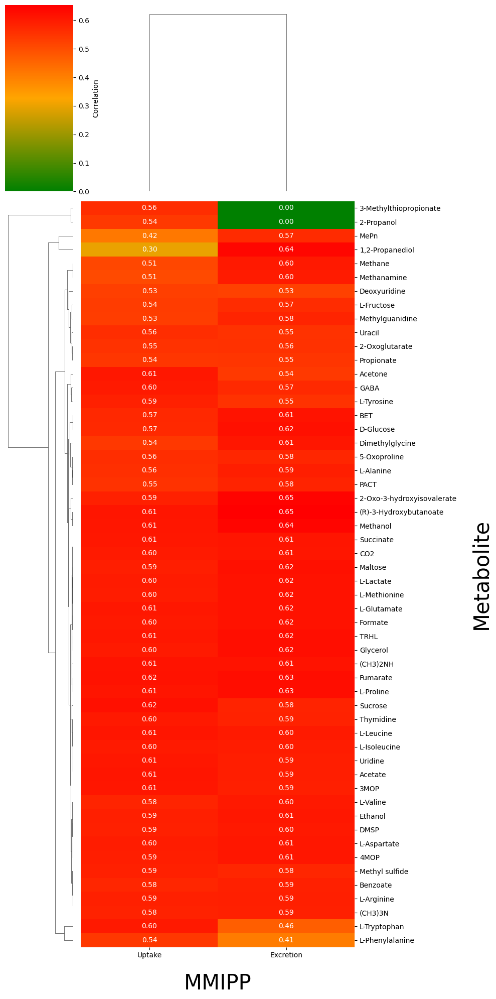

In [46]:
from matplotlib import colors, pyplot, patches
from pandas import read_csv, concat
from math import isclose
import seaborn as sns

for color in prob_correlations:
    df = read_csv(f"nboutput/CH4_MMIPPs_correlations_{color}.csv").set_index("Unnamed: 0")
    df.index.name = "Metabolite"
    df.index = [msdb.compounds.get(i)["name"] for i in df.index]
    df.columns = [col.replace("Sample",'').replace("_probInteractions", '').capitalize() for col in df.columns]
    print(df.columns)
    df.drop("Growth", axis=1, inplace=True)
    for index, row in df.iterrows():
        if all([abs(row[col])<0.05 for col in df.columns]):
            df.drop(index, axis=0, inplace=True)
            print(f"filtered {index}")
    display(df)
    totCorr = {}
    for index, row in df.iterrows():
        totCorr.update({index: row["Uptake"]+row["Excretion"]})
    display(dict(sorted(totCorr.items(), key=lambda item: abs(item[1]), reverse=True)))
    df.to_csv(f"nboutput/CH4_correlations_{color}.csv")

    # create the clustermap
    ## Define a custom diverging colormap with white at the center
    minimalVal = min([df[col].min() for col in df.columns])
    maximumVal = max([df[col].max() for col in df.columns])
    print(minimalVal, maximumVal)
    if minimalVal >= 0 or maximumVal <= 0:
        cmap = colors.LinearSegmentedColormap.from_list('custom_diverging', ["green", 'orange', 'red'])
        divnorm = colors.TwoSlopeNorm(vmin=minimalVal, vcenter=(minimalVal+maximumVal)/2, vmax=maximumVal)
    else:
        cmap = colors.LinearSegmentedColormap.from_list('custom_diverging', ['blue', 'white', 'red'])
        divnorm = colors.TwoSlopeNorm(vmin=minimalVal, vcenter=0, vmax=maximumVal)

    ## create the figure
    clusterMap = sns.clustermap(df, cmap=cmap, norm=divnorm, figsize=(10, 20), cbar_kws={"label": "Correlation"})
    clusterMap.ax_heatmap.set_xlabel('MMIPP', fontsize=30, labelpad=20)
    clusterMap.ax_heatmap.set_ylabel('Metabolite', fontsize=30, labelpad=20)

    ## add values text to the elements
    for i in range(clusterMap.data2d.shape[0]):
        for j in range(clusterMap.data2d.shape[1]):
            value = clusterMap.data2d.iloc[i, j]
            clusterMap.ax_heatmap.text(j+0.5, i+0.5, f'{value:.2f}', ha='center', va='center', color='white')

    clusterMap.figure.tight_layout()
    clusterMap.figure.savefig(f"nboutput/MMIPPs-CH4_heatmap_{color}.png")

## correlate modeling and experimental CH4 fluxes at the various growth rates

In [235]:
from glob import glob
from json import load, dump
from os import path
import re

# parse the methane fluxes from each simulation at variable optimum growths
pattern = re.compile("([A-Z]+\d+[A-Z]?_[A-C]_D\d+)")
methane_fluxes = {}
for growth in ["100", "90", "80", "70", "60", "50"]:
    methane_fluxes[growth] = {}
    # for sol_path in [f for f in glob(f"nboutput/{growth}/*_output.json") if pattern.search(f)]:
    for sol_path in glob(f"nboutput/{growth}/*_output.json"):
        # if any([x in sol_path for x in ["_output", "_hash"]]):  continue
        # print(sol_path)
        commName = path.basename(sol_path).replace("_output.json", '')
        sol = load(open(sol_path, 'r'))
        # print(sol)
        methane_fluxes[growth][commName] = {}
        if commName in sol:
            sol = sol[commName]
        if "solution" not in sol:
            print(sol_path)
            continue
        for rxnID, flux in sol["solution"].items():
            if "cpd01024" in rxnID:   methane_fluxes[growth][commName][rxnID] = flux
        
display(methane_fluxes)
dump(methane_fluxes, open("nboutput/methane_fluxes.json", 'w'), indent=3)

nboutput/100/R2A_A_D2_output.json
nboutput/100/R2A_A_D1_output.json
nboutput/100/R1_B_D1_output.json
nboutput/100/R1_C_D1_output.json
nboutput/90/R1_C_D1_output.json
nboutput/90/R2A_A_D2_output.json
nboutput/90/R1_B_D1_output.json
nboutput/90/R2_C_D1_output.json
nboutput/90/R2_A_D1_output.json
nboutput/90/R2_C_D2_output.json
nboutput/80/R1_C_D1_output.json
nboutput/80/R2_B_D2_output.json
nboutput/80/R2A_A_D2_output.json
nboutput/80/R1_B_D1_output.json
nboutput/80/R1_C_D2_output.json
nboutput/80/R1_A_D2_output.json
nboutput/70/R1_C_D1_output.json


{'100': {'SF2_A_D1': {'EX_cpd01024_e0': 1.7452445640804065e-12},
  'SF2_B_D1': {'EX_cpd01024_e0': 172.16367346399554},
  'SF2_C_D1': {'EX_cpd01024_e0': 172.16367346399554},
  'R2_A_D2': {'EX_cpd01024_e0': 168.41063905719597},
  'SF2_A_D2': {'EX_cpd01024_e0': 174.94926364268642},
  'SF2_B_D2': {'EX_cpd01024_e0': 192.2295869941261},
  'SF2_C_D2': {'EX_cpd01024_e0': 185.30557348235774},
  'R2A_B_D1': {'EX_cpd01024_e0': 154.30283220976108},
  'R2A_A_D2': {},
  'R2A_A_D1': {},
  'R2A_C_D1': {'EX_cpd01024_e0': 163.1367359117041},
  'R2A_C_D2': {'EX_cpd01024_e0': 175.17757861259525},
  'R1_A_D1': {'EX_cpd01024_e0': 207.53885113082245},
  'R1_A_D2': {'EX_cpd01024_e0': 181.3039887829956},
  'R2A_B_D2': {'EX_cpd01024_e0': 186.40029955354117},
  'R2_B_D1': {'EX_cpd01024_e0': 190.8515976413234},
  'R1_B_D1': {},
  'R1_C_D1': {},
  'R2_A_D1': {'EX_cpd01024_e0': 190.19239462954343},
  'R2_C_D1': {'EX_cpd01024_e0': 168.15054382546785},
  'R2_C_D2': {'EX_cpd01024_e0': 86.0857527191861},
  'R1_B_D2': {

100
90
R2A_A_D1
R1_A_D1
R1_B_D2
80
R2A_A_D1
R1_A_D1
R1_B_D2
R2_A_D1
R2_C_D1
R2_C_D2
70
R2A_A_D1
R2A_A_D2
R1_A_D1
R1_A_D2
R1_B_D1
R1_B_D2
R1_C_D2
R2_A_D1
R2_B_D2
R2_C_D1
R2_C_D2
60
R2A_A_D1
R2A_A_D2
R2A_C_D2
R1_A_D1
R1_A_D2
R1_B_D1
R1_B_D2
R1_C_D2
R2_A_D1
R2_B_D2
R2_C_D1
R2_C_D2
50
R2A_A_D1
R2A_A_D2
R2A_C_D2
R1_A_D1
R1_A_D2
R1_B_D1
R1_B_D2
R1_C_D1
R1_C_D2
R2_A_D1
R2_B_D2
R2_C_D1
R2_C_D2


{'100': -0.004672422135030607,
 '90': 0.012913014753504148,
 '80': 0.03925624722404797,
 '70': 0.0438823405679547,
 '60': 0.06208882422015305,
 '50': 0.05829831251449935}

missing {'90': ['R2A_A_D1', 'R1_A_D1', 'R1_B_D2'], '80': ['R2A_A_D1', 'R1_A_D1', 'R1_B_D2', 'R2_A_D1', 'R2_C_D1', 'R2_C_D2'], '70': ['R2A_A_D1', 'R2A_A_D2', 'R1_A_D1', 'R1_A_D2', 'R1_B_D1', 'R1_B_D2', 'R1_C_D2', 'R2_A_D1', 'R2_B_D2', 'R2_C_D1', 'R2_C_D2'], '60': ['R2A_A_D1', 'R2A_A_D2', 'R2A_C_D2', 'R1_A_D1', 'R1_A_D2', 'R1_B_D1', 'R1_B_D2', 'R1_C_D2', 'R2_A_D1', 'R2_B_D2', 'R2_C_D1', 'R2_C_D2'], '50': ['R2A_A_D1', 'R2A_A_D2', 'R2A_C_D2', 'R1_A_D1', 'R1_A_D2', 'R1_B_D1', 'R1_B_D2', 'R1_C_D1', 'R1_C_D2', 'R2_A_D1', 'R2_B_D2', 'R2_C_D1', 'R2_C_D2']}


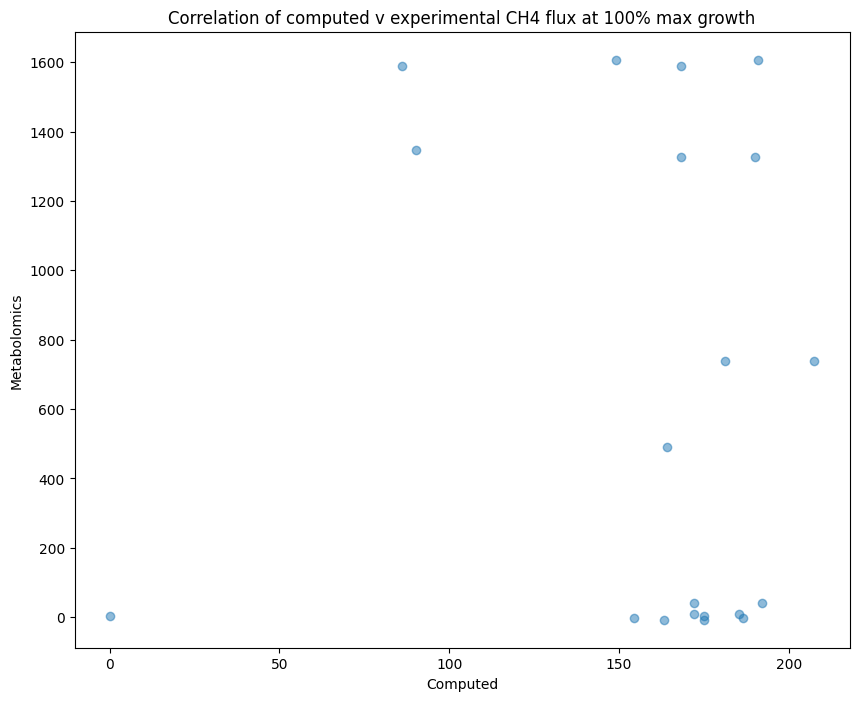

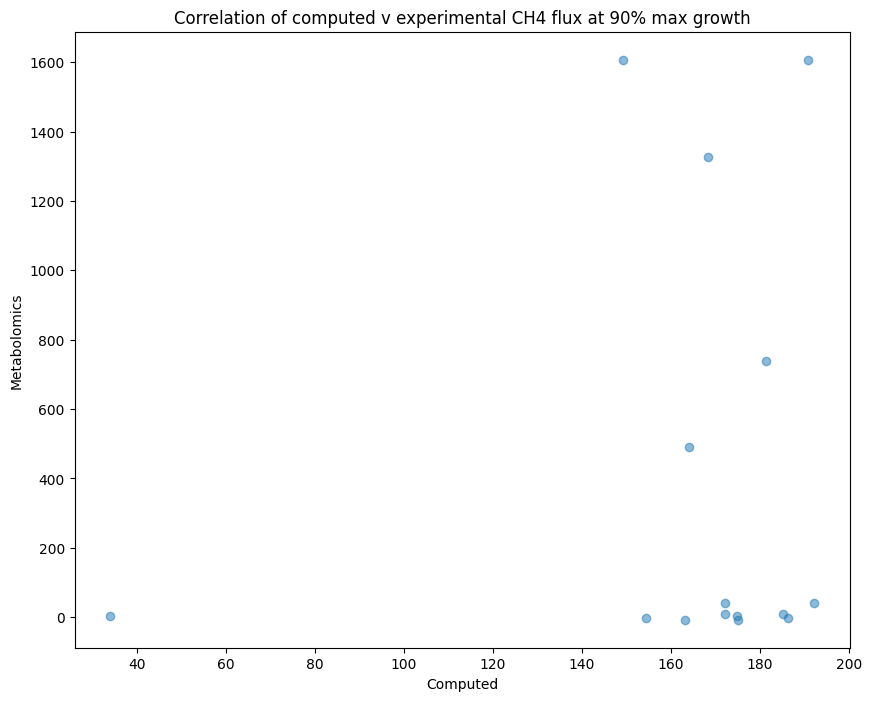

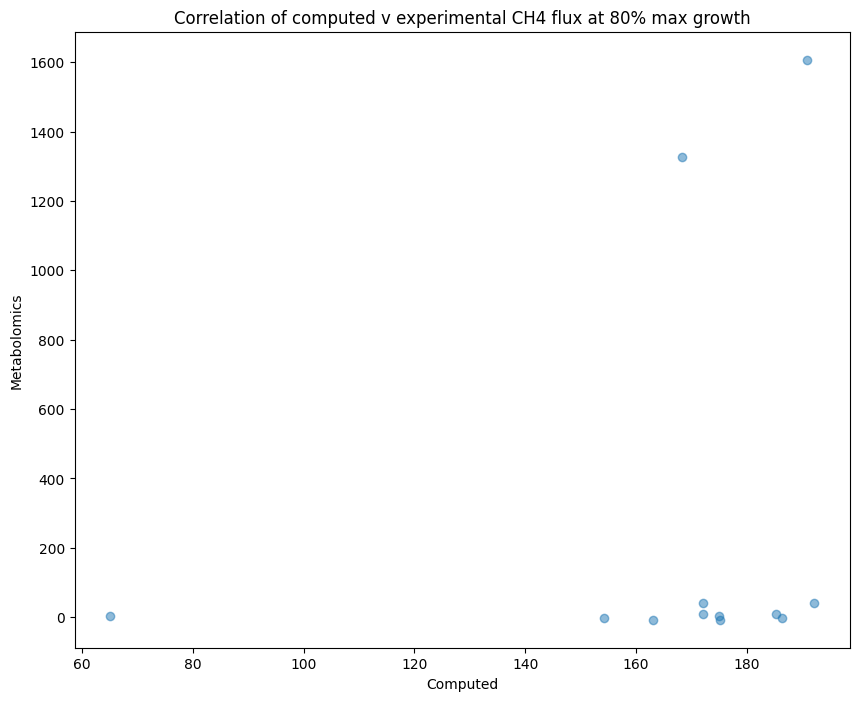

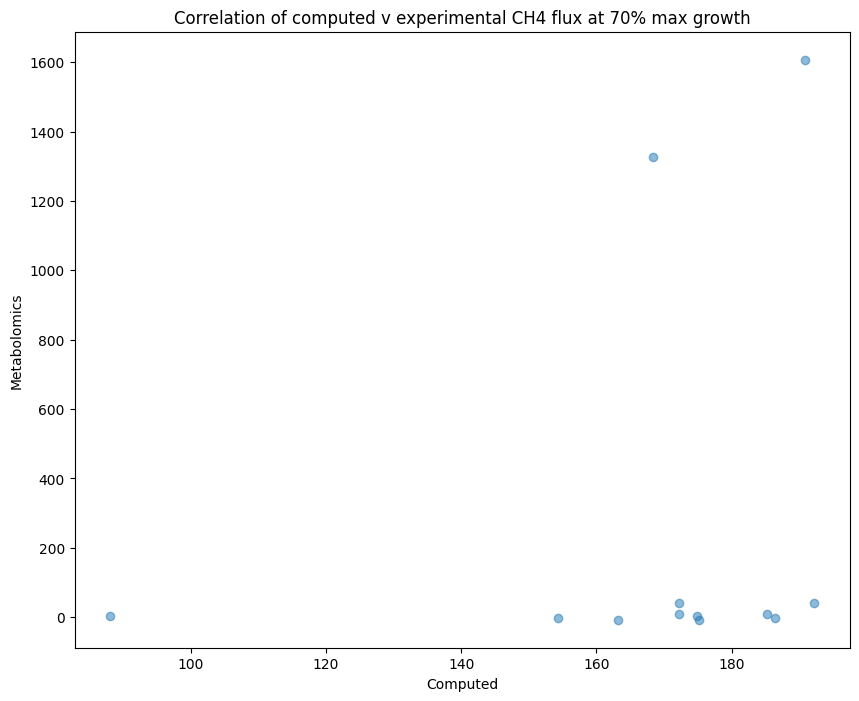

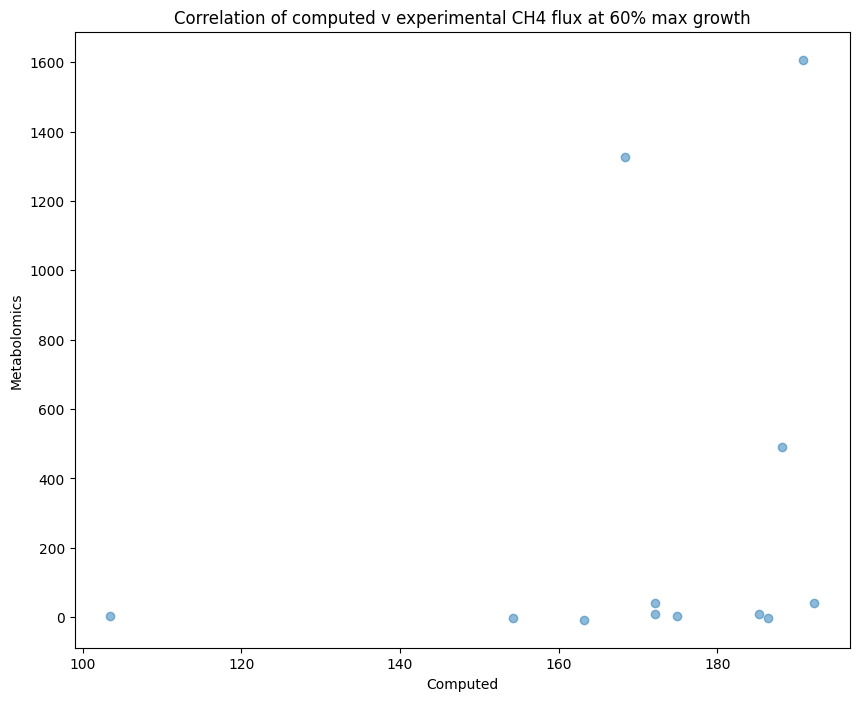

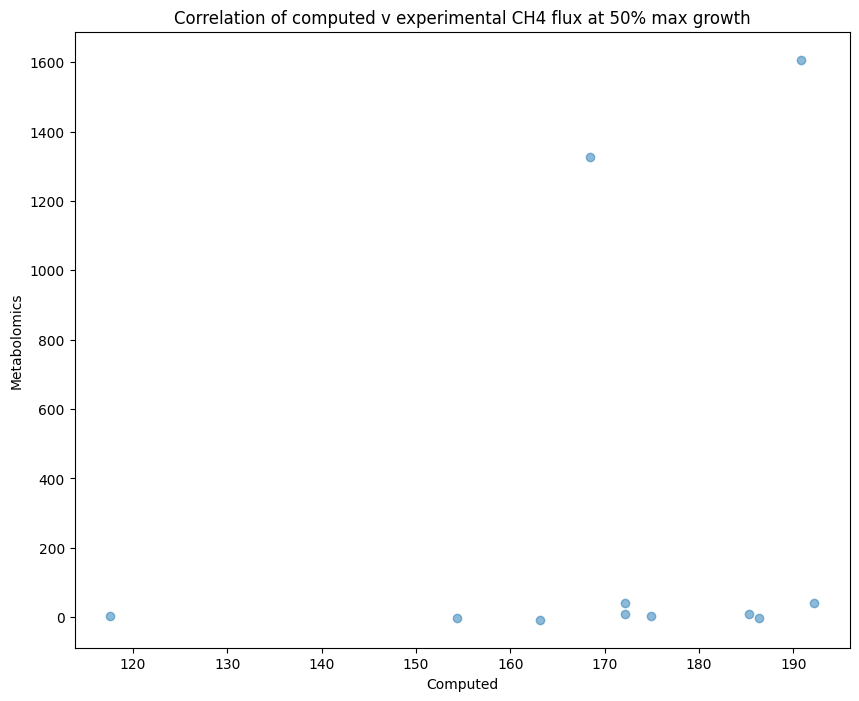

In [237]:
from pandas import read_csv
from matplotlib import pyplot
from numpy import array, delete
from sklearn.linear_model import LinearRegression

# compute the correlations
metabolomics_data = read_csv("data/Cliff_Sample_Metadata_BGC_NMR.csv").set_index("Sample")
CH4vals = metabolomics_data["CH4_umol_m2_d"].to_dict()
CH4correlations = {}
missing = {}
for growth, content in methane_fluxes.items():
    print(growth)
    ## define the initial figure conditions
    pyplot.figure(figsize=(10, 8))
    pyplot.xlabel('Computed')
    pyplot.ylabel('Metabolomics')
    pyplot.title(f'Correlation of computed v experimental CH4 flux at {growth}% max growth')
    
    ## plot each correlation
    samples, fluxes = [x.replace("_output", '') for x in content.keys()], list(content.values())
    ys = []
    CH4fluxes = []
    labels = []
    for sample, y in CH4vals.items():
        if sample not in samples:
            missing[growth] = missing.get(growth, [])
            missing[growth].append(sample)
            print(sample)
            continue
        flux = fluxes[samples.index(sample)]
        if flux == {}:  continue
        ys.append(y)
        labels.append(list(flux.keys())[0])
        CH4fluxes.append(list(flux.values())[0])
    # print(CH4fluxes)
    # print(CH4vals.values())
    pyplot.scatter(CH4fluxes,  ys,  alpha=0.5)
    pyplot.savefig(f"nboutput/{growth}/CH4_{growth}%.png")

    # Create a linear regression model
    model = LinearRegression()
    fitting_xs = array(CH4fluxes).reshape(-1, 1)
    fitting_ys = array(ys)
    fitting_xs = fitting_xs.reshape(-1, 1)
    model.fit(fitting_xs, fitting_ys)
    ## Calculate R^2
    r_squared = model.score(fitting_xs, fitting_ys)
    CH4correlations[growth] = r_squared if model.coef_[0] >= 0 else -r_squared
    
display(CH4correlations)
print("missing", missing)

# community visualization

## parse the community interactions

### separate products and reactants

In [7]:
# from pandas import read_csv
# fluxes = read_csv("nboutput/magFluxes.csv").set_index("Unnamed: 0")
# fluxes.index.name = "MAGs"
# fluxes.columns = fluxes.iloc[0]
# fluxes.drop(fluxes.index[0], inplace=True)

In [9]:
display(fluxes)

id,rxn02201,rxn00351,rxn00836,rxn00423,rxn00364,rxn05561,rxn03408,rxn02177,rxn05250,rxn01673,...,rxn01147,rxn11544,rxn09615,rxn10883,rxn02375,rxn03856,rxn24610,rxn24611,rxn07849,rxn11938
MAGs,,,,,,,,,,,,,,,,,,,,,
equation,rxn02201_c1: cpd00443_c1 + cpd02920_c1 --> cpd...,rxn00351_c1: cpd00002_c1 + cpd00033_c1 + cpd00...,rxn00836_c1: cpd00012_c1 + cpd00067_c1 + cpd00...,rxn00423_c1: cpd00022_c1 + cpd00054_c1 --> cpd...,rxn00364_c1: cpd00002_c1 + cpd00046_c1 + cpd00...,rxn05561_c1: cpd00067_e0 + cpd00106_e0 <=> cpd...,rxn03408_c1: cpd00037_c1 + cpd03494_c1 <=> cpd...,rxn02177_c1: cpd00001_c1 + cpd00658_c1 --> cpd...,rxn05250_c1: cpd00002_c1 + cpd00010_c1 + cpd11...,rxn01673_c1: cpd00002_c1 + cpd00533_c1 <=> cpd...,...,rxn01147_c9: cpd00018_c9 + cpd00184_c9 --> cpd...,rxn11544_c14: cpd00001_c14 + 2 cpd00002_c14 + ...,rxn09615_c14: cpd00038_c14 + cpd00332_c14 --> ...,rxn10883_c14: cpd00001_c14 + cpd00002_c14 + cp...,rxn02375_c1: cpd00002_c1 + cpd01405_c1 --> cpd...,rxn03856_c1: cpd00003_c1 + cpd03752_c1 <=> cpd...,rxn24610_c1: cpd00067_c1 + cpd00425_c1 + cpd27...,rxn24611_c1: cpd02246_c1 + cpd27511_c1 --> cpd...,rxn07849_c1: cpd00001_c1 + cpd00735_c1 <-- cpd...,rxn11938_c1: cpd00001_c1 + cpd00003_c1 + cpd00...
name,"2-amino-4-hydroxy-6-hydroxymethyl-7,8-dihydrop...",gamma-L-glutamyl-L-cysteine:glycine ligase (AD...,IMP:diphosphate phospho-D-ribosyltransferase [c0],acetyl-CoA:L-serine O-acetyltransferase [c0],ATP:CMP phosphotransferase [c0],"Transport of dicarboxylates, extracellular [c0]",UDP-N-acetyl-D-glucosamine:undecaprenyl-diphos...,Isochorismate pyruvate-hydrolase [c0],FACOAL160(ISO) [c0],ATP:dCDP phosphotransferase [c0],...,AMP:thymidine 5'-phosphotransferase,"Hydrogenobyrinate<=>Hydrogenobyrinate a,c diam...",Mevalonate kinase,ATP phosphohydrolase (polar-amino-acid-importing),ATP:pseudouridine 5'-phosphotransferase [c0],Galactitol-1-phosphate:NAD oxidoreductase [c0],dimethylamine-corrinoid protein Co-methyltrans...,RXN-8101.c,R08060,Formylmethanofuran:(NAD) oxidoreductase
Salt_Pond_MetaGSF2_A_D1_MG_DASTool_bins_concoct_out.23_SF2_B_D1,0.0,0.0,0.0,0.0,0.010814710937106403,0.0,0.0006263166402700548,0.0,0.0,0.00012272358020851105,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Salt_Pond_MetaGSF2_A_D2_MG_DASTool_bins_concoct_out.11_SF2_B_D1,0.0,NaN,0.0,0.0,0.0015724808290031717,0.0,9.106770540959636e-05,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Salt_Pond_MetaGSF2_A_D1_MG_DASTool_bins_concoct_out.23_SF2_B_D2,0.0,0.0,0.0,0.0,0.009687013743801664,0.0,0.0005610078658182802,0.0,0.0,0.00010992665593024816,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Salt_Pond_MetaGSF2_A_D1_MG_DASTool_bins_concoct_out.23_R1_A_D1,NaN,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0
Salt_Pond_MetaGSF2_A_D2_MG_DASTool_bins_concoct_out.8_R1_A_D1,NaN,NaN,0.0,0.0,1.2723840155354626e-07,0.0,6.805097892384062e-09,NaN,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Salt_Pond_MetaGSF2_A_H2O_MG_DASTool_bins_concoct_out.33_R1_A_D1,NaN,NaN,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [87]:
%run cliffcommutil.py

from pandas import read_csv
from json import dump

maxGrowthPercent = 100
baseDir = util.output_dir+f"/{maxGrowthPercent}"
interactions = read_csv(baseDir+"/magMetaboliteInteractions.csv").set_index("MAG").fillna(0).astype('float')
stoich_mapping = {}
for index, row in interactions.iterrows():
    stoich_mapping[index] = {"reactants":{}, "products":{}}
    for col, ele in row.items():
        metID = col.split("_")[0]
        if ele > 0:   stoich_mapping[index]["products"][metID] = ele
        elif ele < 0:   stoich_mapping[index]["reactants"][metID] = ele

# display(stoich_mapping)
with open(baseDir+"/MAG_metabolic_activity_stoich.json", 'w') as jsonOut:
    dump(stoich_mapping, jsonOut, indent=3)

python version 3.11.1
KBBaseModules 0.0.1
modelseedpy 0.3.3
cobrakbase 0.4.0
Output files printed to:/scratch/shared/code/MicrobiomeNotebooks/Cliff/nboutput when using KBDevUtils.output_dir
ModelSEED: /scratch/shared//sdkmount/run_local/workdir/tmp/


### determine the connectedness and interaction categories in the community

### define the related input values

In [90]:
from itertools import product

sites = ["R2A", "SF2", "R1", "R2"]
cores = ["A", "B", "C"]
depths = ["D1", "D2"]

sampleParts = product(sites, cores, depths)
print(list(sampleParts))
samples = [f"{site}_{core}_{depth}" for (site, core, depth) in product(sites, cores, depths)]
samples

[('R2A', 'A', 'D1'), ('R2A', 'A', 'D2'), ('R2A', 'B', 'D1'), ('R2A', 'B', 'D2'), ('R2A', 'C', 'D1'), ('R2A', 'C', 'D2'), ('SF2', 'A', 'D1'), ('SF2', 'A', 'D2'), ('SF2', 'B', 'D1'), ('SF2', 'B', 'D2'), ('SF2', 'C', 'D1'), ('SF2', 'C', 'D2'), ('R1', 'A', 'D1'), ('R1', 'A', 'D2'), ('R1', 'B', 'D1'), ('R1', 'B', 'D2'), ('R1', 'C', 'D1'), ('R1', 'C', 'D2'), ('R2', 'A', 'D1'), ('R2', 'A', 'D2'), ('R2', 'B', 'D1'), ('R2', 'B', 'D2'), ('R2', 'C', 'D1'), ('R2', 'C', 'D2')]


['R2A_A_D1',
 'R2A_A_D2',
 'R2A_B_D1',
 'R2A_B_D2',
 'R2A_C_D1',
 'R2A_C_D2',
 'SF2_A_D1',
 'SF2_A_D2',
 'SF2_B_D1',
 'SF2_B_D2',
 'SF2_C_D1',
 'SF2_C_D2',
 'R1_A_D1',
 'R1_A_D2',
 'R1_B_D1',
 'R1_B_D2',
 'R1_C_D1',
 'R1_C_D2',
 'R2_A_D1',
 'R2_A_D2',
 'R2_B_D1',
 'R2_B_D2',
 'R2_C_D1',
 'R2_C_D2']

In [91]:
from pandas import read_csv
from numpy import load
from json import dump
from glob import glob

categories = {}
for category in glob("../../CommScores/data/categories/*.npy"):
    categories[category.replace("../../CommScores/data/categories/", "").replace(".npy", "")] = load(category)
    
# categories

In [174]:
from cobra.io import load_json_model
# from optlang import Objective

maxGrowthPercent = 100
baseDir = util.output_dir+f"/{maxGrowthPercent}"
effectiveMAG_model = load_json_model(baseDir+"/MAGInteractionModel.json")
# rxnNames = [rxn.id for rxn in effectiveMAG_model.reactions]
# rcNames = {}
# numRCs = []
# for name in rxnNames:
#     if "RC" in name:
#         nameParts = name.split("RC")
#         numRCs.append(nameParts[0])
#         rcNames[nameParts[0]] = rcNames.get(nameParts[0], [])
#         rcNames[nameParts[0]].append(nameParts[1].split("_")[1])
# # print(set(rcNames.keys()) - set(numRCs))
# wdNames = {}
# numWDs = []
# for name in rxnNames:
#     if "WD" in name:
#         nameParts = name.split("WD")
#         numWDs.append(nameParts[0])
#         wdNames[nameParts[0]] = wdNames.get(nameParts[0], [])
#         wdNames[nameParts[0]].append(nameParts[1].split("_")[1])
# # print(set(wdNames.keys()) - set(numWDs))
# new_rcNames = [f"{k}RC-ABX_{time}" for k,v in rcNames.items() for time in v]
# new_wdNames = [f"{k}WD-ABX_{time}" for k,v in wdNames.items() for time in v]

# missing_keys = set(rxnNames) - set(new_rcNames+new_wdNames)
# print(missing_keys)

def search_days(day):
    RCasvs = [asv for asv, days in rcNames.items() if day in days]
    WDasvs = [asv for asv, days in wdNames.items() if day in days]
    display("RC", sorted(RCasvs))
    display("WD", sorted(WDasvs))

    
def biggest_engager(site, core, depth, compound, all=False, limit=1):
    print(compound)
    maxFlux, minFlux = [None, 0], [None, 0]
    for rxn in effectiveMAG_model.reactions:
        if all([x in rxn.id for x in [site, "_"+core, depth]]):
            for met, coef in rxn.metabolites.items():
                if compound == met.name:
                    if coef > maxFlux[1]:    maxFlux = [rxn.name, coef]
                    elif coef < minFlux[1]:  minFlux = [rxn.name, coef]
    if maxFlux != [None, 0]:  print("maxFlux", maxFlux)
    if minFlux != [None, 0]:  print("minFlux", minFlux)


def full_assessment(site, core, depth, compounds, engagers=True, classification=True, skipping_mets=None):
    print(f"metabolite assessment for the {core} core and {depth} depth of the {site} site")
    #determine the biggest consumers/producers of each compound
    if engagers:
        for category, metabolites in compounds.items():
            print(category)
            biggest_engager(site, core, depth, metabolites)

    #determine the compounds that exclusively consumed/produced or both
    if classification:
        metabolites = {"consumed": set(), "produced": set(), "intermediates": set()}
        for rxn in effectiveMAG_model.reactions:
            if all([x in rxn.id for x in [site, "_"+core, depth]]):
                for met, coef in rxn.metabolites.items():
                    if skipping_mets and met.name in skipping_mets:  continue
                    if abs(coef) <= 0.05:   continue
                    # print(met.name, coef)
                    if coef > 0:
                        metabolites["produced"].add(met.name)
                        if met.name in metabolites["consumed"]:
                            # print("produced", met.name, rxn.name)
                            metabolites["intermediates"].add(met.name)
                    elif coef < 0:
                        metabolites["consumed"].add(met.name)
                        # print("consumed", met.name, rxn.name)
                        if met.name in metabolites["produced"]:
                            # print("consumed", met.name, rxn.name)
                            metabolites["intermediates"].add(met.name)
        metabolites["consumed"] -= metabolites["intermediates"]
        metabolites["produced"] -= metabolites["intermediates"]
        display(metabolites) 


def count_interactions(compounds):
    from itertools import product
    Interactions = {category:dict() for category in compounds}
    categories = {ele:k for k,v in compounds.items() for ele in v}
    for category in Interactions:
        Interactions[category] = {}
        for site in sites:
            Interactions[category][site] = {}
            for core in cores:
                Interactions[category][site][core] = {}
                for depth in depths:
                    Interactions[category][site][core][depth] = set()
    notCategorized = set()
    for category, content in Interactions.items():
        for site, coreInfo in content.items():
            for core, depthInfo in coreInfo.items():
                for depth in depthInfo:
                    produced, consumed = set(), set()
                    # print(category, site, core, depth)
                    for rxn in effectiveMAG_model.reactions:
                        if site+"_"+core+"_"+depth not in rxn.id:  continue
                        for met, coef in rxn.metabolites.items():
                            if met.name not in categories:
                                notCategorized.add(met.name)
                                continue
                            if category != categories[met.name]:   continue
                            if coef > 0:    produced.add(met.name)
                            elif coef < 0:  consumed.add(met.name)
                    depthInfo[depth] = produced.intersection(consumed)
                    # print(produced, consumed)
    
    # display(Interactions)
    print(f"{notCategorized} are not categorized")

    InteractionCounts = {}
    for category, content in Interactions.items():
        InteractionCounts[category] = {}
        for site, coreInfo in content.items():
            InteractionCounts[category][site] = InteractionCounts[category].get(site, {})
            for core, depthinfo in coreInfo.items():
                InteractionCounts[category][site][core] = InteractionCounts[category][site].get(core, {})
                for depth, mets in depthinfo.items():
                    InteractionCounts[category][site][core][depth] = len(mets)
                    # print(category, site, core, depth, mets)
    # display(InteractionCounts)

    # convert the amino acid counts into a DataFrame
    from pandas import DataFrame
    df = DataFrame(InteractionCounts)
    for index, row in df.iterrows():
        for col, ele in row.items():
            totSyn = 0
            for core, depthInfo in ele.items():
                for depth, val in depthInfo.items():
                    totSyn += val
            row[col] = totSyn
    # df.index.name = "Interval Day"
    df.to_csv("nboutput/InteractionCounts.csv")
    return df


def memeberConnectedness(model):
    connectedness, errors, averages = {}, {}, {}
    for site in sites:
        connectedness[site], errors[site], averages[site] = {}, {}, {}
        for core in cores:
            connectedness[site][core] = {}
            averages[site][core], errors[site][core] = {}, {}
            for depth in depths:
                connectedness[site][core][depth] = {}
                for rxn in model.reactions:
                    if not all([x in rxn.id for x in [site, f"_{core}_", f"_{depth}"]]):  continue
                    rxnID = rxn.id.replace(f"_{core}", '').replace(site, '').replace(f"_{depth}", '')
                    connectedness[site][core][depth].update({rxnID:len(rxn.metabolites)})
                connections = list(connectedness[site][core][depth].values())
                averages[site][core][depth] = mean(connections)
                errors[site][core][depth] = std(connections)
    return connectedness, averages, errors


from json import load
with open("data/metabolomics_categories.json", 'r') as jsonIn:
    compounds = load(jsonIn)
InteractionCounts = count_interactions(compounds)
display(InteractionCounts)

from pandas import DataFrame, set_option
from numpy import mean, std
set_option('display.max_colwidth', None)  # Set to None to display all content in the column
set_option('display.max_rows', None)      # Set to None to display all rows
set_option('display.max_columns', None)

connectedness, averages, errors = memeberConnectedness(effectiveMAG_model)
# display(connectedness)
display(averages)
display(errors)
df = DataFrame(connectedness)
# display(df.columns, df.index)
# display(df.loc[df.index[0],df.columns[0]])
df.to_csv(baseDir+"/connectedness.csv")
for depth in ["D1", "D2"]:
    averaged_df = DataFrame(columns=df.columns, index=df.index)
    for column in df.columns:
        for index in df.index:
            averaged_df.loc[index,column] = f"""{'% .2f' %(mean(list(df.loc[index,column][depth].values())))} 
+/- {'% .1f' %(std(list(df.loc[index,column][depth].values())))}"""
    display(averaged_df)
    averaged_df.to_csv(baseDir+f"/ave_connectedness_{depth}.csv")

1725552952.350513 INFO: The current solver interface glpk doesn't support setting the optimality tolerance.


{'Thymidine', 'Uracil', '(R)-3-Hydroxybutanoate', 'Maltose', 'CO2', 'BET', '(CH3)2NH', 'Ethanol', 'Methyl sulfide', '1,2-Propanediol', 'Deoxyuridine', 'Methane', 'PACT', 'GABA', '(CH3)3N', 'TRHL', 'Uridine', 'Glycerol', 'Methanol', 'Methanamine', 'Formate', 'L-Lactate'} are not categorized


,Simple_carbs,Complex_carbs,SCFAs,Fatty Acids,Amino Acids,Simple_carbon,Other
R2A,2,0,5,0,24,2,5
SF2,3,0,8,0,45,6,12
R1,0,0,0,0,0,0,1
R2,0,0,0,0,1,2,2


{'R2A': {'A': {'D1': 2.6545454545454548, 'D2': 3.0},
  'B': {'D1': 2.3488372093023258, 'D2': 2.8275862068965516},
  'C': {'D1': 1.4583333333333333, 'D2': 1.2162162162162162}},
 'SF2': {'A': {'D1': 2.4054054054054053, 'D2': 2.2989690721649483},
  'B': {'D1': 1.2526315789473683, 'D2': 1.3975409836065573},
  'C': {'D1': 1.3728813559322033, 'D2': 1.188235294117647}},
 'R1': {'A': {'D1': 0.26666666666666666, 'D2': 0.43037974683544306},
  'B': {'D1': 0.3125, 'D2': 0.28},
  'C': {'D1': 0.1388888888888889, 'D2': 0.2916666666666667}},
 'R2': {'A': {'D1': 1.6101694915254237, 'D2': 2.0425531914893615},
  'B': {'D1': 1.174757281553398, 'D2': 1.575},
  'C': {'D1': 0.921875, 'D2': 0.9438202247191011}}}

{'R2A': {'A': {'D1': 4.440385658182004, 'D2': 4.936212838107631},
  'B': {'D1': 4.1083223585067135, 'D2': 4.760244600476058},
  'C': {'D1': 2.75347003292613, 'D2': 3.032572141118556}},
 'SF2': {'A': {'D1': 4.916195662359404, 'D2': 4.575066780997832},
  'B': {'D1': 3.343393866788125, 'D2': 3.6442400794290526},
  'C': {'D1': 3.538640479555771, 'D2': 3.115404298744656}},
 'R1': {'A': {'D1': 0.9977753031397176, 'D2': 1.309010103371647},
  'B': {'D1': 1.0439558180306292, 'D2': 1.0140348448976824},
  'C': {'D1': 0.5350377856738394, 'D2': 0.7894706383956841}},
 'R2': {'A': {'D1': 3.4371694560463135, 'D2': 3.9010315792008705},
  'B': {'D1': 2.960671612556589, 'D2': 3.6346996666391385},
  'C': {'D1': 2.2451662487163393, 'D2': 2.4281104252780117}}}

,R2A,SF2,R1,R2
A,2.65 \n+/- 4.4,2.41 \n+/- 4.9,0.27 \n+/- 1.0,1.61 \n+/- 3.4
B,2.35 \n+/- 4.1,1.25 \n+/- 3.3,0.31 \n+/- 1.0,1.17 \n+/- 3.0
C,1.46 \n+/- 2.8,1.37 \n+/- 3.5,0.14 \n+/- 0.5,0.92 \n+/- 2.2


,R2A,SF2,R1,R2
A,3.00 \n+/- 4.9,2.30 \n+/- 4.6,0.43 \n+/- 1.3,2.04 \n+/- 3.9
B,2.83 \n+/- 4.8,1.40 \n+/- 3.6,0.28 \n+/- 1.0,1.57 \n+/- 3.6
C,1.22 \n+/- 3.0,1.19 \n+/- 3.1,0.29 \n+/- 0.8,0.94 \n+/- 2.4


### diverging barchart of the syntrophic interactions

In [1]:
from matplotlib.ticker import MaxNLocator
from matplotlib import pyplot
from numpy import arange
from os import getcwd

# Plotting the diverging bar chart

def divergingBarChart(InteractionCounts, width=0.5, baseDir=None):
    ## simple carbs
    baseDir = baseDir or getcwd()
    fig, ax = pyplot.subplots(figsize=(10, 6), layout='constrained')
    colors = {"R1": "red", "R2":"green", "R2A": "blue", "SF2": "purple"}
    barss = []
    numCols = len(InteractionCounts.columns)
    padding = 1
    xs = arange(numCols) * (1 + padding)
    # for i, category in enumerate(InteractionCounts.columns):
    for i, (row_label, row_data) in enumerate(InteractionCounts.iterrows()):
    # for i, (sample, ele) in enumerate(colors.items()):
        bars = ax.bar(xs + width*i, row_data, width, label=row_label, color=colors.get(row_label, 'gray'))
        # ax.bar_label(bars, padding=3)
        # bars = ax.bar(xs[i] - width*displacements[i], ele, width, label=index)  # InteractionCounts['Positive'], 
        barss.append(bars)

        ### Add text labels above each bar
        for bars in barss:
            for bar in bars:
                val = bar.get_height()
                if val == 0:   continue
                ax.text(bar.get_x() + bar.get_width() / 2, val, f'{abs(val)}', ha='center', va='top', fontsize=10, color='white')
                
                
    ### curtail the figure
    # ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    # for label in ax.get_xticklabels():
    #     label.set_y(label.get_position()[1] - 0.02)  # Adjust the y position of the tick labels
    categories = list(InteractionCounts.columns)
    ax.set_xticks(xs + width*numCols/5)  # Center the tick labels
    ax.set_xticklabels(categories)
    ax.legend(loc='upper left', ncols=3)
    ax.set_xlabel('Categories')
    ax.set_ylabel('number of exchanges')
    ax.set_title(f"{' + '.join(categories)} syntrophy count")
    
    fig.savefig(baseDir+f"/diverging_barChart.png")


def averageConnectedness(averages, errors, baseDir):
    fig, ax = pyplot.subplots(figsize=(10, 6))
    wd_label, rc_label = False, False
    for day, content in averages.items():
        for diet, ave in content.items():
            error = errors[day][diet]
            if diet == "WD":
                color = "black"
                bars = ax.bar([day], [ave-averages[day]["RC"]], color="blue", label=diet if not wd_label else "",
                              yerr=error, bottom=[averages[day]["RC"]])
                wd_label = True
            else:
                color = "white"
                bars = ax.bar([day], [ave], color='red', label=diet if not rc_label else "", yerr=error, bottom=[0])
                rc_label = True
            for bar in bars:
                ax.text(bar.get_x() + bar.get_width()/1.2, ave, '%.1f' %(ave), ha='center', va='bottom', fontsize=10, color=color)
    ax.set_xlabel('days')
    ax.set_ylabel('ave. number of consumption+production per ASV')
    ax.set_title("Average metabolic connectivity")
    ax.legend()
    fig.savefig(baseDir+f"/aveMetabolicConnectivity.png")
    

# process the interactions
maxGrowthPercent = 100
baseDir = util.output_dir+f"/{maxGrowthPercent}"

divergingBarChart(InteractionCounts, 0.3, baseDir)
averageConnectedness(averages, errors, baseDir)



NameError: name 'util' is not defined

## Escher map development and filtering

### filtering the Escher map for fewer reactions based on the metabolite fluxes

# TODO
- The coefficients on the metabolites could be the frequency of member A interacting with compound 1
- Aggregate members based on their ecological role (above a threshold of consumed and produced profiles)
- Compare each of the methane flux regimes as an indication of remediation pathways

In [ ]:
aa_names = ["L-Methionine", "L-Histidine", "L-Tryptophan", "L-Alanine", "L-Threonine", "L-Glutamate", "L-Isoleucine", "L-Proline", "L-Leucine", "Glycine",
 'L-Phenylalanine', 'L-Tyrosine', 'L-Valine', 'L-Glutamine', 'L-Arginine', 'L-Asparagine', 'L-Aspartate', 'L-Lysine', 'L-Serine', 'L-Cysteine', "D-Serine",
 "5-Oxoproline"]

In [ ]:
from json import load, dump
with open("metabolite_focused_map.json", 'r') as jsonIn:
    escherMap = load(jsonIn)
# display(escherMap)

og_escherMap = [ele for ele in escherMap]

# from collections import Counter
nodeID = {nodeNum: content["bigg_id"] for nodeNum, content in og_escherMap[1]["nodes"].items() if "bigg_id" in content}
with open("Escher_nodeNum_cpdIDs.json", 'w') as jsonOut:
    dump(nodeID, jsonOut, indent=3)

idName = {content["bigg_id"]: content["name"] for content in og_escherMap[1]["nodes"].values() if "bigg_id" in content}
with open("EscherNodeMapping.json", 'w') as jsonOut:
    dump(idName, jsonOut, indent=3)

newEscher = []
for index, ele in enumerate(og_escherMap):
    og_ele = {k:v for k,v in ele.items()}
    if index == 0:  newEscher = [ele]
    newEscher.append({})
    nodes_to_remove = []
    nodeNumCoef = {}
    for k, val in ele.items():
        if k == "reactions":
            newEscher[index][k] = val
            # newEscher[index][k] = {}
            # reactions = {}
            for rxnNum, content in val.items():
                # display(len(content["metabolites"]), content)
                # print(len(content["metabolites"]))
                #create a mapping from IDs to their respective coefficients
                metCoefs = {met["bigg_id"]: met["coefficient"] for met in content["metabolites"]}
                nameID = {}
                # print(metCoefs)
                for ID in metCoefs.keys():
                    if ID not in idName:   continue
                    name = idName[ID]
                    if name in nameID: nameID[name].append(ID)
                    else: nameID[name] = [ID]
                #determine the nodes that should be removed
                nodeNumIDs = {content2["to_node_id"]: nodeID[content2["to_node_id"]]
                              for content2 in content["segments"].values() if content2["to_node_id"] in nodeID.keys()}
                nodeNumIDs.update({content2["from_node_id"]: nodeID[content2["from_node_id"]]
                                   for content2 in content["segments"].values() if content2["from_node_id"] in nodeID.keys()})
                nodeNumCoef.update({num: metCoefs[ID] for num, ID in nodeNumIDs.items()})
                # print(nodeNumCoef)
                # for nodeNum, coef in nodeNumCoef.items():
                #     if coef < 0.01:   nodes_to_remove.append(nodeNum)
                #     elif "AA" in idName[content["bigg_id"]] and metCoefs[content["bigg_id"]] < 0.1:  continue
                #     for k2, v in content.items():
                #         if k2 == "node_is_primary" and metCoefs[content["bigg_id"]] >= 1:
                #             new_nodes[nodeNum][k2] = True
                #         else:  new_nodes[nodeNum][k2] = v

                # names = Counter([idName[ID]:ID for ID in metCoefs.keys()])
                #determine the ID with the highest coefficient, which will be exclusively kept in the final Escher
                # new_met_content = []
                # for k2,v in nameID.items():
                #     if metCoefs[content["bigg_id"]] < 0.01:   continue
                #     elif "AA" in idName[content["bigg_id"]] and metCoefs[content["bigg_id"]] < 0.1:  continue
                #     for k2, v in content.items():
                #         if k2 == "node_is_primary" and metCoefs[content["bigg_id"]] >= 1:
                #             new_nodes[nodeNum][k2] = True
                #         else:  new_nodes[nodeNum][k2] = v
                #     if len(v) == 1:
                #         new_met_content.append({"bigg_id": v[0], "coefficient": metCoefs[v[0]]})
                #     elif len(v) > 1:
                #         ReactantWinner, ProductWinner = [None, 0], [None, 0]
                #         for ID, coef in metCoefs.items():
                #             if ID in v:
                #                 if coef > 0 and coef > ProductWinner[1]:
                #                     ProductWinner = [ID, coef]
                #                 if coef < 0 and coef < ReactantWinner[1]:
                #                     ReactantWinner = [ID, coef]
                #         for met in content["metabolites"]:
                #             if met["bigg_id"] in v and met["bigg_id"] in [ReactantWinner[0], ProductWinner[0]]:
                #                 new_met_content.append(met)
                # print(len(new_met_content), len(content["metabolites"]))
                #update the new Escher Figure
                newEscher[index][k][rxnNum] = content
                # for key, value in content.items():
                #     if key == "metabolites":
                #         newEscher[index][k][rxnNum][key] = new_met_content
                #     else:
                #         newEscher[index][k][rxnNum][key] = value
                # escherMap[index]["reactions"][rxnNum]["metabolites"] = new_met_content
                # print(len(content["metabolites"]) == len(newEscher[index][k][rxnNum]["metabolites"]))
                # display(len(new_met_content), escherMap[index]["reactions"][rxnNum]["metabolites"])
                # break
    # display(nodeNumCoef)
    for k, val in ele.items():
        if k == "nodes":
            new_nodes = {}
            # display(val)
            for nodeNum, content in val.items():
                # display(content)
                new_nodes[nodeNum] = {}
                if nodeNum in nodeNumCoef:
                    # print(nodeID[nodeNum], nodeNumCoef[nodeNum])
                    if abs(nodeNumCoef[nodeNum]) < 0.05:   continue
                    if idName[content["bigg_id"]] in aa_names:  continue # and abs(nodeNumCoef[nodeNum]) < 0.1:  continue
                    if idName[content["bigg_id"]] in ["Niacin", "Acetate"]:  continue
                    # if abs(nodeNumCoef[nodeNum]) >= 1:   primary = True
                for k2, v in content.items():
                    if k2 == "node_is_primary":  new_nodes[nodeNum][k2] = True
                    else:  new_nodes[nodeNum][k2] = v
            # break
            #remove all of the above nodes, which should remove the segments by default
            #replace the IDs with their categories so that the nodes can consolidate
            newEscher[index][k] = new_nodes
            # DeepDiff(val, new_nodes)
        elif k != "reactions":
            newEscher[index][k] = val
    # print(DeepDiff(og_ele, newEscher[index]))

from deepdiff import DeepDiff
# display(DeepDiff(og_escherMap[1], newEscher[1]))

from json import dump
with open("metabolite_focused_map0.json", 'w') as jsonOut:
    dump(newEscher, jsonOut, indent=3)

#make each column an interacting web, which can feed into the next column through some type of overlapping metabolites
#the fatty acids and the sugars will likely be the differentiating factor between the RC and WD regimes
#amino acids and niacin are the insurance policy for syntrophy, and should be used as the structure of the food web 
#group the members who have the same major products, and group seemingly parasitic organisms separately, by programmatically analyzing the highest fluxes for each organism's reactants and products

### Changing the map IDs

In [ ]:
from pandas import DataFrame

nameAbbrev = DataFrame(columns=["name", "abbrev", "ID"])

cpdID_abbrv = {
    'cpd00076': 'sucr', 'cpd00141': 'prpa', 'cpd00211': 'butr', 'cpd00130': 'malat', 'cpd00137': 'citr', 'cpd00024': 'akg', 
    'cpd00036': 'succ', 'cpd00064': 'ornth', 'cpd03847': 'myrst', 'cpd00106': 'fumr', 'cpd00108': 'galct', 'cpd00382': 'melit', 
    'cpd00105': 'ribs', 'cpd00121': 'inost', 'cpd00751': 'fucos', 'cpd00122': 'acglum', 'cpd00158': 'cellb', 
    'cpd00214': 'palm', 'cpd03198': 'melib', 'cpd01171': 'dulco', 'cpd00020': 'pyr', 'cpd00224': 'arbns', 'cpd00082': 'fru', 
    'cpd00851': '4hpro', 'cpd01107': 'decac', 'cpd00396': 'rhmn', 'cpd01055': 'allos', 'cpd00027': 'glu', 
    'cpd01242': '2drib'}

for cpdID, abbrev in cpdID_abbrv.items():
    cpd = msdb.compounds.get_by_id(cpdID)
    nameAbbrev.loc[len(nameAbbrev)] = [cpd.name, abbrev, cpdID]

display(nameAbbrev)
print(len(cpdID_abbrv))
nameAbbrev.to_csv("nameAbbrev.csv")

from json import load, dump

def cleanEscherJSON(escherPath):
    with open(escherPath, 'r') as jsonIn:
        escherMap = load(jsonIn)

    # exchange the nodeIDs
    nodes_to_delete = []
    for nodeNum, content in escherMap[1]["nodes"].items():
        if content == {}:
            # del escherMap[1]["nodes"][nodeNum]
            nodes_to_delete.append(nodeNum)
            continue
        if content["node_type"] == "metabolite":
            content["name"] = cpdID_abbrv[content["bigg_id"]]

    for nodeNum in nodes_to_delete:
        escherMap[1]["nodes"].pop(nodeNum)

    # exchange the rxnIDs
    for content in escherMap[1]["reactions"].values():
        # content["name"] = content["bigg_id"]
        # content["name"] = content["name"].split('_')[0].replace("-ABX", '').replace("RC", '').replace("WD", '')
        content["name"] = content["name"].split('.')[0][:6] + "." + content["name"].split('.')[1]

    with open(escherPath.replace(".json", "_cleaned0.json"), 'w') as jsonOut:
        dump(escherMap, jsonOut, indent=3)

cleanEscherJSON("metabolite_focused_map_IDs.json")

### Adjusting the Escher map 

In [ ]:
# from shapely.geometry import Point, box
import random
import re

def tint_color(hex_color, tint_factor=0.5):
    rgb_color = tuple(int(hex_color.lstrip('#')[i:i+2], 16) for i in (0, 2, 4))
    tinted_rgb = [((1 - tint_factor) * component + tint_factor * 255) for component in rgb_color]
    return '{:02x}{:02x}{:02x}'.format(int(tinted_rgb[0]), int(tinted_rgb[1]), int(tinted_rgb[2]))

# Function to get bounding box of an SVG element
def get_text_bbox(text_element, font_size=10):
    x = float(text_element['x'])
    y = float(text_element['y'])
    # Approximate width and height based on font size
    width = len(text_element.get_text()) * font_size * 0.6
    height = font_size
    return box(x, y - height, x + width, y)

# Function to approximate the bounding box of a node element
def get_node_bbox(node_element):   # TODO need to be updated
    cx = float(node_element['cx'])
    cy = float(node_element['cy'])
    r = float(node_element['r'])
    return box(cx - r, cy - r, cx + r, cy + r)

# Function to approximate the bounding box of an edge element (assuming it's a line)
def get_edge_bbox(edge_element):   # TODO need to be updated
    x1 = float(edge_element['x1'])
    y1 = float(edge_element['y1'])
    x2 = float(edge_element['x2'])
    y2 = float(edge_element['y2'])
    # A simple approximation of the bounding box of a line
    return box(min(x1, x2), min(y1, y2), max(x1, x2), max(y1, y2))


# Function to adjust text labels to minimize overlap
def adjust_labels(labels, nodes, edges, font_size=10, textToKeep=["l27", "l13"]):
    label_positions = [get_text_bbox(label, font_size) for label in labels if label["id" not in textToKeep]]
    node_positions = [get_node_bbox(node) for node in nodes]
    edge_positions = [get_edge_bbox(edge) for edge in edges]
    
    all_positions = label_positions + node_positions + edge_positions
    for i, label in enumerate(labels):
        bbox = label_positions[i]
        adjusted = False
        
        while not adjusted:
            overlap = False
            for j, other_bbox in enumerate(all_positions):
                if i != j and bbox.intersects(other_bbox):
                    overlap = True
                    break
            
            if overlap:
                # Adjust position (for simplicity, moving randomly; a better algorithm can be used)
                match = re.search(r'translate\((-?\d+\.?\d*),\s*(-?\d+\.?\d*)\)', label['transform'])
                x, y = float(match.group(1)), float(match.group(2))
                x = str(x + random.uniform(-1, 1))
                y = str(y + random.uniform(-1, 1))
                label["transform"] = f'translate({x},{y})'
                bbox = get_text_bbox(label, font_size)
                label_positions[i] = bbox
            else:     adjusted = True


def EscherSVG_processing(svg_path="metabolite_focused_map.svg", labels_to_remove=["stoichiometry-labels"],
                         node_label_px=10, rxn_label_px=30, node_label_hex="e0865b", rxn_label_hex="202078",
                         rxn_edge_hex="5aa6df", rxn_edge_px=10, colorElements=None, largeNodeLabels=None,
                         largeEdgeLabels=None, tint_factor=0.5, stroke_reduction=100, abbrevIDs=None, msdb=None,
                         large_node_offset=100, dashedEdges=None):
    # load the SVG for parsing
    from bs4 import BeautifulSoup
    soup = BeautifulSoup(open(svg_path, "r").read() , 'lxml-xml')

    # remove all stoichiometric or other undesirable labels
    for label in labels_to_remove:
        stoich_labels = soup.find_all(class_=label)
        for label in stoich_labels:
            label.decompose()

    # label font-size and color change
    metadata = soup.find("style", attrs={'type': "text/css"})
    ## change reactions
    metadata.string = metadata.string.replace(".reaction-label{font-size:30px;fill:#202078;text-rendering:optimizelegibility}",
                                              ".reaction-label{"+f"font-size:{rxn_label_px}px;fill:#{rxn_label_hex};stroke:#000000;stroke-width:{rxn_label_px/stroke_reduction}px;"+"text-rendering:optimizelegibility}")
    if largeEdgeLabels is not None:
        fadedEdgesColor = tint_color(rxn_edge_hex, tint_factor)
        fadedEdgesLabelsColor = tint_color(rxn_label_hex, tint_factor)
        metadata.string = metadata.string + f" .m{fadedEdgesLabelsColor}-label"+"{"+f"font-size:{rxn_label_px/1.5}px;fill:#{fadedEdgesLabelsColor};stroke:#000000;stroke-width:{rxn_label_px/stroke_reduction}px;"+"text-rendering:optimizelegibility}"
        #f"stroke:#{fadedEdgesColor};"+f"stroke-width:{rxn_edge_px/1.2}px;"+"fill:none}"
    for reaction in soup.find_all(class_="reaction"):
        label = reaction.find("text")
        if largeEdgeLabels is not None and reaction["id"] not in largeEdgeLabels:
            label['class'] = f"m{fadedEdgesLabelsColor}-label"
        if abbrevIDs is not None:
            cleanedStr = label.string.split('_')[0].replace("-ABX", '').replace("RC", '').replace("WD", '')
            label.string = cleanedStr.split('.')[0][:6] + "." + cleanedStr.split('.')[1]
    ## change nodes
    metadata.string = metadata.string.replace(".node-label{font-size:20px}", 
                                              ".node-label{"+f"font-size:{node_label_px}px;fill:#{node_label_hex};stroke:#000000;stroke-width:{node_label_px/stroke_reduction}px;"+"}")
    metadata.string = metadata.string.replace(".metabolite-circle{stroke:#a24510;fill:#e0865b}",
                                              ".metabolite-circle{stroke:#"+f"{node_label_hex};fill:#{node_label_hex}"+"}")
    if largeNodeLabels is not None:
        fadedNodesColor = tint_color(node_label_hex, tint_factor)
        for node in soup.find_all(class_="node"):
            # print(node)
            circle = node.find("circle")
            label = node.find("text")
            if label is None:   continue
            # coordinates = list(map(float, label["transform"].replace("translate", '').replace("(",'').replace(")",'').split(",")))
            # if len(label.string) < 4:
            #     label["transform"] = f"translate({coordinates[0]+large_node_offset/4},{coordinates[1]})"
            # elif len(label.string) > 4:
            #     label["transform"] = f"translate({coordinates[0]-(large_node_offset/8 * (len(label.string)-4))},{coordinates[1]})"
            
            if node["id"] not in largeNodeLabels:
                # print(node["id"])
                if any([x is None for x in [circle, label]]):   continue
                circle["class"] = f"m{fadedNodesColor}"
                label['class'] = f"m{fadedNodesColor}-label"
                ## changing the node label
                # cpdID = label.string
                if abbrevIDs is not None:
                    label.string = abbrevIDs[cpdID]
                    print(node["id"])
            # else:
            #     coordinates = list(map(float, label["transform"].replace("translate", '').replace("(",'').replace(")",'').split(",")))
            #     label["transform"] = f"translate({coordinates[0]-large_node_offset/2},{coordinates[1]})"


        metadata.string = metadata.string + f" .m{fadedNodesColor}"+"{"+f"stroke:#{fadedNodesColor};fill:#{fadedNodesColor}"+"}"
        metadata.string = metadata.string + f" .m{fadedNodesColor}-label"+"{"+f"font-size:{node_label_px/1.2}px;fill:#{fadedNodesColor};stroke:#000000;stroke-width:{node_label_px/stroke_reduction}px;"+"}"
    ## change segments
    metadata.string = metadata.string.replace(".segment{"+"stroke:#334E75;stroke-width:10px;fill:none}", 
                                              ".segment{"+f"stroke:#{rxn_edge_hex};"+f"stroke-width:{rxn_edge_px}px;"+"fill:none}")
    # metadata.string = metadata.string.replace(".direction-arrow{stroke:#000;stroke-width:1px;fill:#fff;opacity:.3}",
    #                                           ".direction-arrow{stroke:#000;"+f"stroke-width:{rxn_edge_px*8}px;fill:#fff;opacity:{tint_factor}"+"}")
    # metadata.string = metadata.string.replace("arrowhead{fill:#334E75}",
    #                                           "arrowhead{fill:#000000"+f";stroke-width:{rxn_edge_px*8}px;"+"}")
    ## change miscellaneous text
    metadata.string = metadata.string.replace(".text-label-input{font-size:50px}", ".text-label-input{font-size:"+f"{rxn_label_px*1.8}"+"px}")
    # text['font-weight'] = 'bold'

    # optimize text locations
    # labelSizes = [node_label_px, rxn_edge_px]
    # adjust_labels(soup.find_all('text'), sum(labelSizes)/len(labelSizes))

    ## re-order the labels such that the text overlays all other elements
    # labels = soup.find_all('text')
    # edges = soup.find_all('reaction')  # Assuming edges are defined by <path> elements
    # nodes = soup.find_all('circle')  # Assuming nodes are defined by <circle> elements

    # # Create a new SVG content with reordered elements
    # new_svg = BeautifulSoup('<svg xmlns="http://www.w3.org/2000/svg"></svg>', 'lxml-xml')
    # new_svg.svg.attrs = soup.svg.attrs  # Preserve original SVG attributes

    # # Function to append elements to new SVG
    # def append_elements(elements):
    #     for elem in elements:
    #         # Find the parent <g> element if the element is nested
    #         parent = elem.find_parent('g')
    #         if parent and parent not in new_svg.svg:
    #             new_svg.svg.append(parent)
    #         elif elem not in new_svg.svg:
    #             new_svg.svg.append(elem)

    # # Append edges first
    # append_elements(edges)

    # # Append nodes second
    # append_elements(nodes)

    # # Append labels last
    # append_elements(labels)

    # # Write the modified SVG content to a new file with proper indentation
    # with open("output.svg", "w", encoding="utf-8") as file:
    #     file.write(new_svg.prettify())


    # add ASV nodes
    for edge in soup.find_all(class_="segment-group"):
        if dashedEdges is not None:
            if edge["id"] in dashedEdges:
                edge["stroke-dasharray"] = "8,5"
        segment = edge.find(class_="segment")
        coordinates = list(map(float, re.split(",| ", segment["d"].replace("M", "").replace("M", "").replace("C", "").replace("undefined", "100000000"))))
        if abs(coordinates[0]-coordinates[2]) < 30 and abs(coordinates[1]-coordinates[3]) < 3:
            # print(coordinates)
            rect = soup.new_tag("rect")
            rect['x'] = str(coordinates[0]+float("10734.555053710938")/2.03)
            rect['y'] = str(coordinates[1]+float("5315.0328369140625")/7.66)
            rect['width'] = "40"
            rect['height'] = "15"
            rect['fill'] = f"#{rxn_label_hex}"
            soup.svg.append(rect)
            # print(edge)
        # break
    # change the color of select edges
    if colorElements is not None:
        # baseline_metadata = metadata.string
        edgeColor = {}
        for color, lst in colorElements.items():
            edgeColor.update({x:color for x in lst})
        for edge in soup.find_all(class_="segment-group"):
            if edge["id"] in edgeColor:
                color = edgeColor[edge["id"]]
                for child in edge.find_all(class_="segment"):
                    child['class'] = f"m{color}"
                # for i, child in enumerate(edge.children):
                #     if "segment" in child:
                #         edge.children[i] = child.replace("segment", f"segment m{color}")

                # display([x for x in edge.children])
                # break
            elif largeEdgeLabels is not None:
                for child in edge.find_all(class_="segment"):
                    child['class'] = f"m{fadedEdgesColor}"
        for color, elements in colorElements.items():
            # ".segment{"+"stroke:#334E75;stroke-width:10px;fill:none}"
            metadata.string = metadata.string + f" .m{color}"+"{"+f"stroke:#{color};"+f"stroke-width:{rxn_edge_px*1.2}px;"+"fill:none}"
            if any(['r' in x for x in elements]):
                for ele in elements:
                    if 'r' in ele:
                        reaction = soup.find(attrs={"id": ele})
                        label = reaction.find("text")
                        label["class"] = f"m{color}-label"
                metadata.string = metadata.string + f" .m{color}-label"+"{"+f"font-size:{rxn_label_px}px;fill:#{color};stroke:#000000;stroke-width:{rxn_label_px/stroke_reduction}px;"+"text-rendering:optimizelegibility;font-family:sans-serif;font-style:italic;font-weight:700;}"
            if any(['n' in x for x in elements]):
                for ele in elements:
                    if 'n' in ele:
                        node = soup.find(attrs={"id": ele})
                        circle = node.find("circle")
                        circle["class"] = f"m{color}-circle"
                        label = node.find("text")
                        label["class"] = f"m{color}-label"
                metadata.string = metadata.string + f" .m{color}-circle"+"{"+f"stroke:#{color};fill:#{color}"+"}"
                
        if largeEdgeLabels is not None:
            metadata.string = metadata.string + f" .m{fadedEdgesColor}"+"{"+f"stroke:#{fadedEdgesColor};"+f"stroke-width:{rxn_edge_px/1.2}px;"+"fill:none}"
    
    with open(svg_path.replace(".svg", "_edited.svg"), "w", encoding="utf-8") as file:
        file.write(soup.prettify())

EscherSVG_processing("metabolite_focused_map_IDs_cleaned.svg", node_label_px=90, rxn_label_px=90, rxn_edge_px=6,
                     node_label_hex="E36400", rxn_label_hex="cc0000", rxn_edge_hex="2C79BD",
                     largeNodeLabels=["n202", "n311", "n900", "n963", "n33", "n32", "n830", "n71", "n1322", "n1443", "n1672", "n1673",
                                      "n2066", "n2102", "n206", "n404", "n873", "n1090", "n1182", "n1746", "n2154", "n2154", "n1338", # RC
                                      "n539", "n1063", "n1282", "n1511", "n1576" # cellibiose
                                      "n1540", "n249", "n1515", "n1540",   # Melitose
                                      "n85", "n104",    # WD
                                      ],
                     largeEdgeLabels=["r10", "r23", "r48", "r50", "r49", "r41", "r3", "r60", "r64", "r65", "r73", "r68", "r72", "r88", "r86", "r83",
                                      "r95", "r108", "r106", "r107",
                                      "r31", "r53", "r63", "r75", "r76", "r99", "r77", "r79", "r121", "s1435", "s1009", "s1218",      # WD
                                      ],
                    #  abbrevIDs=cpdID_abbrv,
                     colorElements={"8E0FFF":["s903", "s295", "s444", "s906", "s928", "s900", "s913", "s67", "s1246", "s1150", "s1254", "s1238", "s1390",
                                              "s1370", "s1666", "s1637", "s1588", "s788", "s66", "s1589", "s1787", "s1777", "s387", "s915",
                                              "s1170", "s1186", "s1152", "s2024", "s2072", "s2042", "s2024", "s2085", "s1993", "s1190", "s1669",
                                              "s1959", "s1975",   # RC
                                              "s602", "s593", "s624", "s597", "s511", "s2195", "s1479", "s98"    # WD
                                           ],  # purple  
                                 "11C911":["s191", "s195", "r10", "r3", # "r68", Enterococcus.3 in the 4th interval
                                           "r43", "n206", "s387", # "r20", Allio in the first interval
                                           "s383", "s823", "s829", "n873", "r80", "r122"],  # green
                                 "F15757":["s1304"]  # red
                                 },
                     msdb=msdb, tint_factor=0.8, stroke_reduction=100, dashedEdges=consumptionEdges)